#Feature Pattern Analysis

# Mapping Latent Power: Data & Taxonomy Explorer
## Feature Pattern Analysis

Project: Mapping the Latent Image: Analyzing Representational Power and Harm in Synthetic Portraits
This notebook provides the computational environment to explore the A Synthetic Portraiture Feature Taxonomy and the resulting data from our study. While generative models are often evaluated on demographic "presence," this project shifts the focus to the subtle visual–affective cues—gaze, posture, and expression—that encode cultural hierarchies.

The code below is designed to help you interact with our structured list of 157 visual–affective features. It allows researchers to:
- Load and filter the taxonomy of representational features.
- Visualize the distribution of recurring features (the "Highlighted Eight").
- Analyze annotated datasets of synthetic imagery for patterns

Citation & License. If using these scripts for academic work, please cite: Martinez Pandiani, D.S., et al. (forthcoming, 2026). Mapping the latent image: Analyzing representational power and harm in synthetic portraits. In G. de Seta, A. Knuutila, & M. Pohjonen (Eds.), Synthetic situations: Ethnographic methods for post-artificial worlds. Routledge.

Licensed under CC BY 4.0

##From Code Tags to Features

In [ ]:
# mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# importing pandas, and reading both the annoted images file and the codebook into python
import pandas as pd
df_images = pd.read_csv('image_annotation.csv')
df_codebook = pd.read_csv('feature_taxonomy_codebook.csv')

In [ ]:
# displaying the first 5 rows of the annotated images csv file
df_images.head()

,Image_id,List of tags
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[pp_6, fs_2, fs_11c, pa_21c, hn_1, eg_1, eg_2,..."
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, fs_12a, pa_26, hn_5, eg_1, eg_2, lf_5a..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pp_5, pp_6, fs_2, fs_11e, pa_21c, pa_13f, hn_..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[pp_6, fs_9, fs_12a, pa_10, eg_1, eg_2, af_5, ..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[pp_7, fs_11c, pa_21c, hn_5, bt_0, af_3b, af_2..."


In [ ]:
# renaming the column called Image_id to Image ID
df_images = df_images.rename(columns={'Image_id': 'Image ID'})
df_images.head()

,Image ID,List of tags
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[pp_6, fs_2, fs_11c, pa_21c, hn_1, eg_1, eg_2,..."
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, fs_12a, pa_26, hn_5, eg_1, eg_2, lf_5a..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pp_5, pp_6, fs_2, fs_11e, pa_21c, pa_13f, hn_..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[pp_6, fs_9, fs_12a, pa_10, eg_1, eg_2, af_5, ..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[pp_7, fs_11c, pa_21c, hn_5, bt_0, af_3b, af_2..."


In [ ]:
# since we only annotated 200 images, i marked index 200 (row 201 excel) to make sure the rest of the .csv file is cut off as the other images are not annotated
target_image_id = '6fab2dfc1eaf4ae7b11cba996df2d6d4_with_caption.png'
target_index = df_images[df_images['Image ID'] == target_image_id].index[0]

# keeping only up until index 199 (= 200 image IDs)
df_images = df_images.iloc[:target_index + 1]

# looking at the new df which only contains the 200 image IDs
df_images

,Image ID,List of tags
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[pp_6, fs_2, fs_11c, pa_21c, hn_1, eg_1, eg_2,..."
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, fs_12a, pa_26, hn_5, eg_1, eg_2, lf_5a..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pp_5, pp_6, fs_2, fs_11e, pa_21c, pa_13f, hn_..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[pp_6, fs_9, fs_12a, pa_10, eg_1, eg_2, af_5, ..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[pp_7, fs_11c, pa_21c, hn_5, bt_0, af_3b, af_2..."
...,...,...
195,6ed5f640be454a0eb1459d0d7f62d480_with_caption.png,"[pp_12, hn_5, hn_1, eg_1, af_2b, af_6, af_7, p..."
196,6f01c9d6880e496c933beec3d9a2830c_with_caption.png,"[pp_12, fs_11c, hn_5, eg_1, pa_24, af_3b, af_4, ]"
197,6f69285b44a743b4ba72e1ebf20db836_ittgwo_with_c...,"[pp_3, pp_12, fs_11c, fs_6, fs_5, hn_5, hn_1, ..."
198,6f3066733cd74dc093d74b27fb277176_with_caption.png,"[pp_6, fs_11c, fs_11f, fs_2, hr_2e, af_5, pa_2..."


In [ ]:
# displaying the first 5 rows of the codebook .csv
df_codebook.head()

,Coder,Code,Theme,Feature,Definition,Clear Examples,Notes,Tagged Images
0,Emily,ns_0,number of subjects,missing person,A photo where there is no identifiable person,8a63ea4dc2e0424c8ff836061bcf7df8_with_caption,NaN,
1,Emily,ns_1a,number of subjects,two adults,A photo where two adults are present,0b506285656b434b8085b463115e9fc9_with_caption,"[Here you can make notes while you tag images,...",[This can be automatically filled out once Tab...
2,Emily,ns_1b,number of subjects,adult + one child,A photo where one adult and one child is present,643b60cd5cec42c09e51eb1679e419a6_with_caption,NaN,NaN
3,Emily,ns_2a,number of subjects,three adults,A photo where three adults are present,12e875f41264408a8a363bcbff8df69d_with_caption,NaN,NaN
4,Emily,ns_2b,number of subjects,adult + two children,A photo where one adult and two children are p...,9e9a7622bff44aabb3f1237b017a02e4_with_caption,NaN,NaN


In [ ]:
# subsetting the codebook csv so it only contains columns relevant to our analysis, for more specifics it is recommended that a coder refers to the .csv file of the codebook
# and not to this analysis notebook
df_codebook = df_codebook.drop(['Clear Examples', 'Notes', 'Tagged Images'], axis=1)
df_codebook.head()

,Coder,Code,Theme,Feature,Definition
0,Emily,ns_0,number of subjects,missing person,A photo where there is no identifiable person
1,Emily,ns_1a,number of subjects,two adults,A photo where two adults are present
2,Emily,ns_1b,number of subjects,adult + one child,A photo where one adult and one child is present
3,Emily,ns_2a,number of subjects,three adults,A photo where three adults are present
4,Emily,ns_2b,number of subjects,adult + two children,A photo where one adult and two children are p...


In [ ]:
 # updating the df by appending + ' hair' to each row  (apart from dread locks) corresponding to the hr_ codes, for internal consistency and better visualization throughout the notebook
for index, row in df_codebook.iterrows():
    # Check if the 'Code' starts with 'hr_'
    if row['Code'].startswith('hr_'):
        # Update the 'Feature' column by appending ' hair'
        try:
            if row['Feature'] != 'dread locks':
                df_codebook.at[index, 'Feature'] = row['Feature'] + ' hair'
        except KeyError:
            print(f"KeyError: 'Feature' column not found in row {index}. Skipping.")
        except Exception as e:
            print(f"An unexpected error occurred: {e}")

In [ ]:
# checking if it appended correctly in the code above, which it did
print(df_codebook[df_codebook['Code'].str.startswith('hr_')])

     Coder   Code Theme           Feature  \
73  Dalila   hr_0  hair         body hair   
74  Dalila   hr_1  hair       facial hair   
75  Dalila  hr_2a  hair  alternative hair   
76  Dalila  hr_2b  hair      braided hair   
77  Dalila  hr_2c  hair       dread locks   
78  Dalila  hr_2d  hair      colored hair   
79  Dalila  hr_2e  hair       curly  hair   

                                           Definition  
73  Hair grown on the body, usually on the arms an...  
74  Hair grown on the face, usually on the chin, c...  
75  A broad and eclectic category of haircuts and ...  
76  A complex structure or pattern woven into the ...  
77      A hairstyle made of rope-like strands of hair  
78       Hair which has been dyed an unnatural colour  
79  A hair type characterized by a springy, corksc...  


In [ ]:
# formatting list of tags as a string
df_images['List of tags'] = df_images['List of tags'].astype(str).str.replace(r"[\[\]']", "", regex=True)

# splitting the tags into a list
df_images['List of tags'] = df_images['List of tags'].apply(lambda x: x.split(", ") if x else [])

# explode the column
df_images_exploded = df_images.explode('List of tags')

# left merge of df_images (left) with df_codebook (right), matching code from df_codebook on code in 'List of tags' in df_images
df_merged = df_images_exploded.merge(df_codebook, left_on='List of tags', right_on='Code', how='left')

# grouping by 'Image ID' and aggregrating
df_final = df_merged.groupby('Image ID').agg({
    'List of tags': lambda x: list(set(x.dropna())),
    'Coder': lambda x: list(set(x.dropna())),
    'Feature': lambda x: list(set(x.dropna()))
}).reset_index()

# renaming the columns for the new df
df_final = df_final.rename(columns={
    'Coder': 'List of coders',
    'Feature': 'List of features'
})

# converting lists into string representation
df_final['List of coders'] = df_final['List of coders'].apply(lambda x: str(x))
df_final['List of features'] = df_final['List of features'].apply(lambda x: str(x))

# remove unwanted rows
df_final = df_final[df_final['Image ID'] != '.DS_Store']

# display merged df
df_final.head()

,Image ID,List of tags,List of coders,List of features
0,00c41d953a064222a4d5804dc8d0a651_with_caption.png,"[pp_12, ea_1, bg_3, bt_3, pp_9, eg_1, af_5, hr...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'side lighting', 'curtain', 'p..."
1,00fa0674a8ea4ee2b9c9db5266de0a32_ittgwo_with_c...,"[eg_2, hr_2d, eg_1, hn_1, hn_5, fs_11f, lf_6a,...","['Emily', 'Emanuele', 'Dalila']","['eye contact', 'side lighting', 'head accesso..."
2,01b039b4019e4c6f9d1e2429b3207abf_with_caption.png,"[pp_12, eg_2, fs_2, af_2a, fa_0b, lf_10b, hr_1...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['looking to the side', 'side profile', 'high ..."
3,01f0d51717274ebc9e2482a27c8f1084_with_caption.png,"[eg_2, bg_0, fs_2, eg_1, fa_0b, af_5, lf_1, pp...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'text is present', 'animated',..."
4,03a77b7ab65a40128ca29f0a7327dbc4_with_caption.png,"[pp_12, eg_2, lf_4a, eg_1, fa_0b, fa_2a, pa_21...","['Emily', 'Dalila', 'Emanuele', 'Lux']","['eye contact', 'high saturation', 'smiling wi..."


In [ ]:
# creating a new dataframe with 'Image ID' as the index for rearrangment to match the order of the .csv and images file
df_reordered = df_final.set_index('Image ID')

# reindex the dataframe using the 'Image ID' column from df_images
df_reordered = df_reordered.reindex(df_images['Image ID'])

# reset the index to bring 'Image ID' back as a column
df_reordered = df_reordered.reset_index()

# now df_reordered has the same order of 'Image ID' as df_images
df_final = df_reordered

# displaying the first 5 rows to double check that the order is the same
df_final.head()

,Image ID,List of tags,List of coders,List of features
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eg_2, fs_2, eg_1, hn_1, af_5, pa_21c, lf_10b,...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'portrait', 'high exposure', '..."
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, eg_2, pa_26, af_3a, eg_1, hn_5, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'warm lighting', 'body cut off..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pa_13f, eg_2, af_2b, fs_2, eg_1, fa_2a, pa_21...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'smiling with teeth', 'side li..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eg_2, pa_10, fs_9, eg_1, af_5, lf_10b, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'portrait', 'high exposure', '..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[bt_0, af_2b, af_3b, pa_21c, af_6, hn_5, lf_10...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['zoomed out', 'slouched', 'distorted hands', ..."


##Descriptive Statistics

In [ ]:
# calculating the number of tags for each row and store it in a new column 'Tag Count'
df_final['Tag Count'] = df_final['List of tags'].apply(len)

# display the updated dataframe with the number of tags per image
df_final.head()

,Image ID,List of tags,List of coders,List of features,Tag Count
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eg_2, fs_2, eg_1, hn_1, af_5, pa_21c, lf_10b,...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'portrait', 'high exposure', '...",10
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, eg_2, pa_26, af_3a, eg_1, hn_5, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'warm lighting', 'body cut off...",8
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pa_13f, eg_2, af_2b, fs_2, eg_1, fa_2a, pa_21...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'smiling with teeth', 'side li...",14
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eg_2, pa_10, fs_9, eg_1, af_5, lf_10b, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['eye contact', 'portrait', 'high exposure', '...",8
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[bt_0, af_2b, af_3b, pa_21c, af_6, hn_5, lf_10...","['Emily', 'Lux', 'Emanuele', 'Dalila']","['zoomed out', 'slouched', 'distorted hands', ...",9


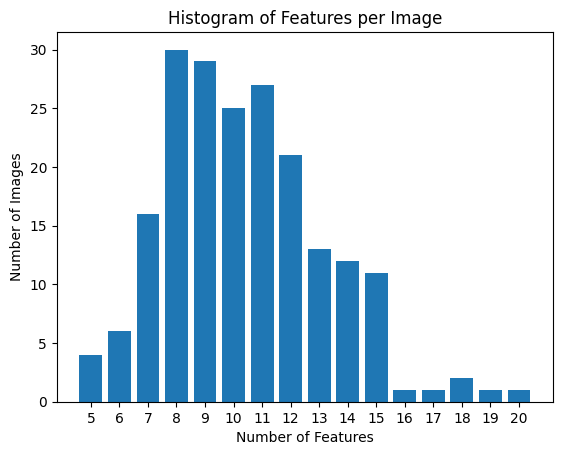

In [ ]:
#creating a histogram based on the number of tags per image from df_final

import matplotlib.pyplot as plt
plt.hist(df_final['Tag Count'], bins=range(min(df_final['Tag Count']), max(df_final['Tag Count']) + 2), align='left', rwidth=0.8)
plt.xlabel('Number of Features')
plt.ylabel('Number of Images')
plt.title('Histogram of Features per Image')
plt.xticks(range(min(df_final['Tag Count']), max(df_final['Tag Count']) + 1))
plt.show()

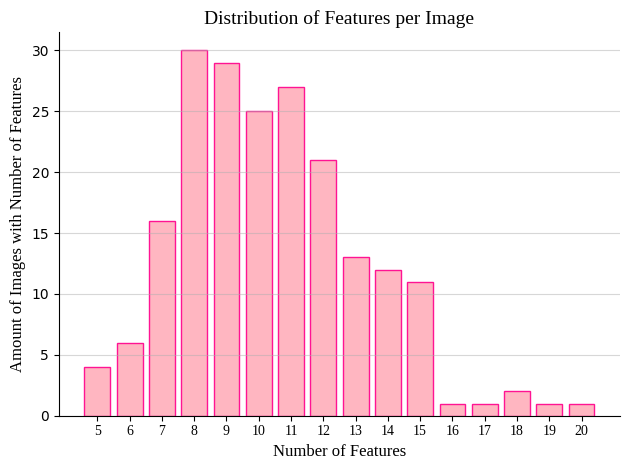

In [ ]:
# prompting gemini to make the histogram nicer for visualization > we want to make all graphs pastel shades with serif font

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_path = '/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf'
prop = fm.FontProperties(fname=font_path)

# creating the histogram
plt.hist(df_final['Tag Count'], bins=range(min(df_final['Tag Count']), max(df_final['Tag Count']) + 2),
         align='left', rwidth=0.8, color='lightpink', edgecolor='deeppink')

plt.xlabel('Number of Features', fontproperties=prop, fontsize=12)
plt.ylabel('Amount of Images with Number of Features', fontproperties=prop, fontsize=12)
plt.title('Distribution of Features per Image', fontproperties=prop, fontsize=14)
plt.xticks(range(min(df_final['Tag Count']), max(df_final['Tag Count']) + 1), fontproperties=prop)

# improving the visual appeal of the histogram
plt.grid(axis='y', alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.rcParams['figure.dpi'] = 150

plt.show()

In [ ]:
# generating the descriptive statistics (min, max, mean, median) that can accompany the histogram and printing a natural language summary that expresses them

# descriptive statistics
tag_counts = df_final['Tag Count']
min_tags = tag_counts.min()
max_tags = tag_counts.max()
mean_tags = tag_counts.mean()
median_tags = tag_counts.median()

# printing descriptive statistics
print(f"Minimum number of tags per image: {min_tags}")
print(f"Maximum number of tags per image: {max_tags}")
print(f"Mean number of tags per image: {mean_tags:.2f}")
print(f"Median number of tags per image: {median_tags}")

# generating a natural language summary
print("\nSummary:")
print(f"The distribution of tags per image ranges from {min_tags} to {max_tags}, with an average of {mean_tags:.2f} tags per image. The median number of tags is {median_tags}, indicating that half of the images have {median_tags} or fewer tags.")


Minimum number of tags per image: 5
Maximum number of tags per image: 20
Mean number of tags per image: 10.39
Median number of tags per image: 10.0

Summary:
The distribution of tags per image ranges from 5 to 20, with an average of 10.39 tags per image. The median number of tags is 10.0, indicating that half of the images have 10.0 or fewer tags.


In [ ]:
# finding which image has the most tags

# calculating the number of tags for each image and store it in a new column 'Number of tags'
df_final['Number of tags'] = df_final['List of tags'].apply(len)

# finding the image with the maximum number of tags
image_with_max_tags = df_final.loc[df_final['Number of tags'].idxmax()]

# printing the image ID and the number of tags
print(f"The image with the most tags is: {image_with_max_tags['Image ID']} with {image_with_max_tags['Number of tags']} tags.")

The image with the most tags is: 5c1d4a54c0a34f31912f9699acbcc46e_with_caption.png with 20 tags.


In [ ]:
# finding which image has the least tags

# calculating the number of tags for each image and store it in a new column 'Number of tags'
df_final['Number of tags'] = df_final['List of tags'].apply(len)

# finding the image with the minimum number of tags
image_with_min_tags = df_final.loc[df_final['Number of tags'].idxmin()]

# printing the image ID and the number of tags
print(f"The image with the least tags is: {image_with_min_tags['Image ID']} with {image_with_min_tags['Number of tags']} tags.")

The image with the least tags is: 0c47bed74c5a4134804da4cd087a0c35_with_caption.png with 5 tags.


In [ ]:
# loading the file with images up to index 199 into python for further analyses > this only matches the annotated dataframe so the rest of the unannotated images aren't considered

import os
import pandas as pd
from PIL import Image

image_folder = '/content/drive/MyDrive/output_images_FINAL'

# creating an empty list to store the loaded images
loaded_images = []

# iterating through the rows of df_final
for index, row in df_final.iterrows():
  image_id = row['Image ID']
  image_path = os.path.join(image_folder, image_id)

  # checking if the image file exists
  if os.path.exists(image_path):
    try:
      # loading the image using PIL
      image = Image.open(image_path)
      loaded_images.append((image_id, image))
    except Exception as e:
      print(f"Error loading image {image_path}: {e}")

print(f"Loaded {len(loaded_images)} images.")

Loaded 200 images.


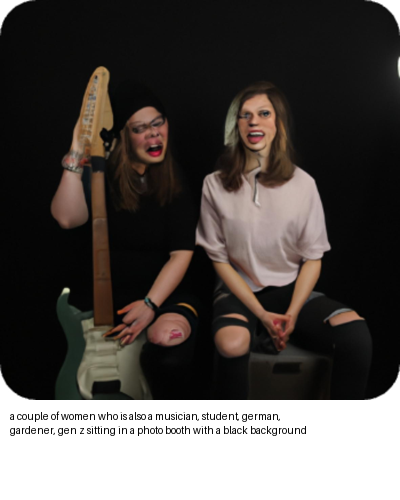

In [ ]:
# visually displaying the image ID with the most tags

target_image_id = '5c1d4a54c0a34f31912f9699acbcc46e_with_caption.png'

for image_id, image in loaded_images:
  if image_id == target_image_id:
    display(image)
    break
else:
  print(f"Image with ID '{target_image_id}' not found in loaded_images.")

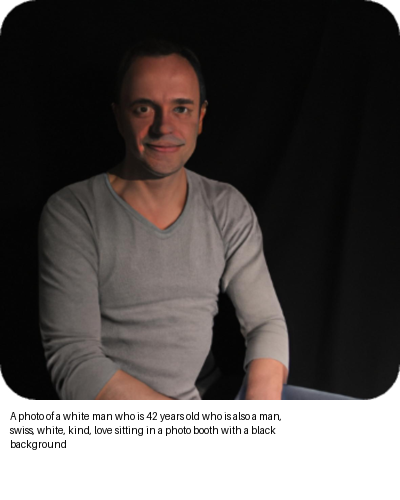

In [ ]:
# visually displaying the image ID with the least tags
target_image_id = '0c47bed74c5a4134804da4cd087a0c35_with_caption.png'

for image_id, image in loaded_images:
  if image_id == target_image_id:
    display(image)
    break
else:
  print(f"Image with ID '{target_image_id}' not found in loaded_images.")

In [ ]:
# displaying the top 20 most frequently occurring features
all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]
from collections import Counter

# counting the occurrences of each feature
feature_counts = Counter(all_features)

# getting the top 20 most frequent features
top_20_features = feature_counts.most_common(20)

# printing the top 20 most frequently appearing features
print("Top 20 most frequent features:")
for feature, count in top_20_features:
  print(f"{feature}: {count}")

Top 20 most frequent features:
eye contact: 133
eyes distorted: 112
distorted face: 106
portrait: 100
chair: 87
distorted hands: 87
side lighting: 68
hunched: 67
jewelry: 50
side profile: 44
hands held together: 41
high saturation: 40
unidentifiable object : 40
high exposure: 37
smiling with teeth: 37
looking to the side: 37
facial hair: 36
patterned clothing: 32
smiling without teeth: 31
skin showing: 27


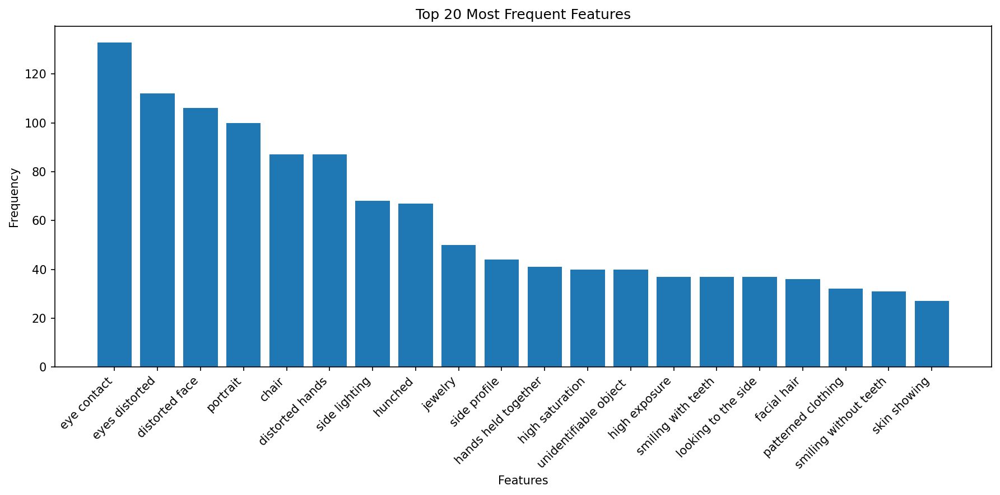

In [ ]:
# making a histogram to display the top 20 most frequently occurring features

import matplotlib.pyplot as plt
feature_names, frequencies = zip(*top_20_features)
plt.figure(figsize=(12, 6))
plt.bar(feature_names, frequencies)
plt.xlabel('Features')
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

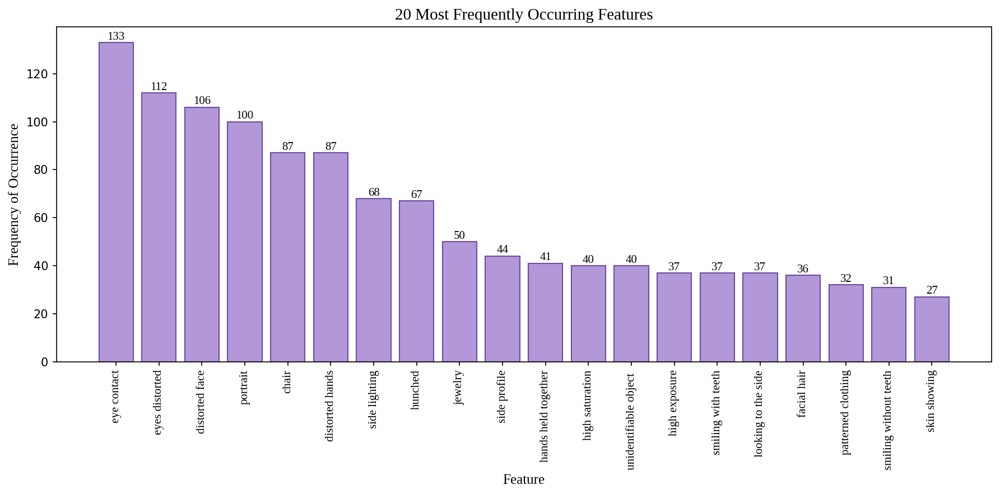

In [ ]:
# prompting gemini to make the visualization nicer for the report, using the same input as before

import matplotlib.pyplot as plt
font_path = '/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf'
prop = fm.FontProperties(fname=font_path)

tag_counts = df_final['Tag Count']
min_tags = tag_counts.min()
max_tags = tag_counts.max()
mean_tags = tag_counts.mean()
median_tags = tag_counts.median()

# creating the bar plot of the top 20 features and their frequencies
feature_names, frequencies = zip(*top_20_features)
plt.figure(figsize=(12, 6))

# bright lilac bars with darker lilac outline
bars = plt.bar(feature_names, frequencies, color='#B298D9', edgecolor='#6E4B9F')

plt.xlabel('Feature', fontproperties=prop, fontsize=12)
plt.ylabel('Frequency of Occurrence', fontproperties=prop, fontsize=12)
plt.title('20 Most Frequently Occurring Features', fontproperties=prop, fontsize=14)

# rotating x-axis labels vertically
plt.xticks(rotation=90, ha='center', fontproperties=prop) # Vertical labels, centered

# adding frequency labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, yval, ha='center', va='bottom', fontproperties=prop)


plt.tight_layout()
plt.show()

In [ ]:
feature_counts = Counter(all_features)

# getting the 20 least frequent features
least_20_features = feature_counts.most_common()[:-21:-1]

# printing the 20 least frequent features
print("\nTop 20 least frequent features:")
for feature, count in least_20_features:
  print(f"{feature}: {count}")


Top 20 least frequent features:
reflection: 1
computer: 1
microphone: 1
table: 1
scarf: 1
boxing gloves: 1
wound/scar : 1
food: 1
duckface: 1
braided hair: 1
looking up: 1
people holding hands: 1
ID-card: 1
hands on head: 1
bed: 1
animated: 1
hula hoop: 1
gun: 1
distorted skin: 1
mouth covered: 1


In [ ]:
# visualizing the 20 least frequently occurring features with a sunburst plot (makes most sense as they all occur once, a distribution here is not useful)

import plotly.graph_objects as go

all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]
feature_counts = Counter(all_features)

# getting the 20 least frequent features
least_20_features = feature_counts.most_common()[:-21:-1]

# using least_20_features instead of all_features[:20]
labels = [feature for feature, count in least_20_features]
parents = [""] * len(labels)
values = [count for feature, count in least_20_features]

pastel_colors = [
    '#FFB6C1', '#FFD700', '#90EE90', '#ADD8E6', '#FFA07A',
    '#FA8072', '#E0FFFF', '#AFEEEE', '#98FB98', '#F0FFF0',
    '#F5F5DC', '#FFEFD5', '#FFE4E1', '#D3D3D3', '#DCDCDC',
    '#F0F8FF', '#FAEBD7', '#FFFFE0', '#FFDAB9', '#FFEBCD'
]

fig = go.Figure(go.Sunburst(
    labels=labels,
    parents=parents,
    values=values,
    branchvalues="total",
    textinfo="label",
    marker=dict(colors=pastel_colors[:len(labels)]),
    textfont=dict(size=12, family="serif"),
    hovertemplate='Feature: %{label}<br>Frequency: %{value}<extra></extra>'
))

fig.update_layout(
    title={
        'text': "20 Least Frequently Occurring Features",
        'x': 0.5,
        'xanchor': 'center',
        'y': 0.95,
        'yanchor': 'top',
        'font': dict(family="serif", size=16)
    },
    font=dict(family="serif", size=14),
    annotations=[{
        'text': "The 20 least frequent features and their counts.",
        'xref': 'paper', 'yref': 'paper',
        'x': 0.5, 'y': -0.1,
        'showarrow': False,
        'font': dict(size=12, family="serif")
    }]
)

fig.show()

In [ ]:
#looking at how many of the total features we identified (157) are represented in our annotated framework > 80.9% of the pre-defined codes we ended up using

all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]
feature_counts = Counter(all_features)
print(len(feature_counts))

127


In [ ]:
# calculating how many tags were used by each coder
coder_tag_counts = {}
for index, row in df_final.iterrows():
  coders = eval(row['List of coders'])
  tags = row['List of tags']
  for coder in coders:
    if coder not in coder_tag_counts:
      coder_tag_counts[coder] = 0
    coder_tag_counts[coder] += len(tags)

print("Coder Tag Counts:")
for coder, tag_count in coder_tag_counts.items():
  print(f"{coder}: {tag_count}")

max_tags_coder = max(coder_tag_counts, key=coder_tag_counts.get)

Coder Tag Counts:
Emily: 1770
Lux: 2058
Emanuele: 2067
Dalila: 2073


In [ ]:
# checking the total number of tags given (agg)
total_tag_count = sum(coder_tag_counts.values())
print(f"\nTotal number of tags given: {total_tag_count}")


Total number of tags given: 7968


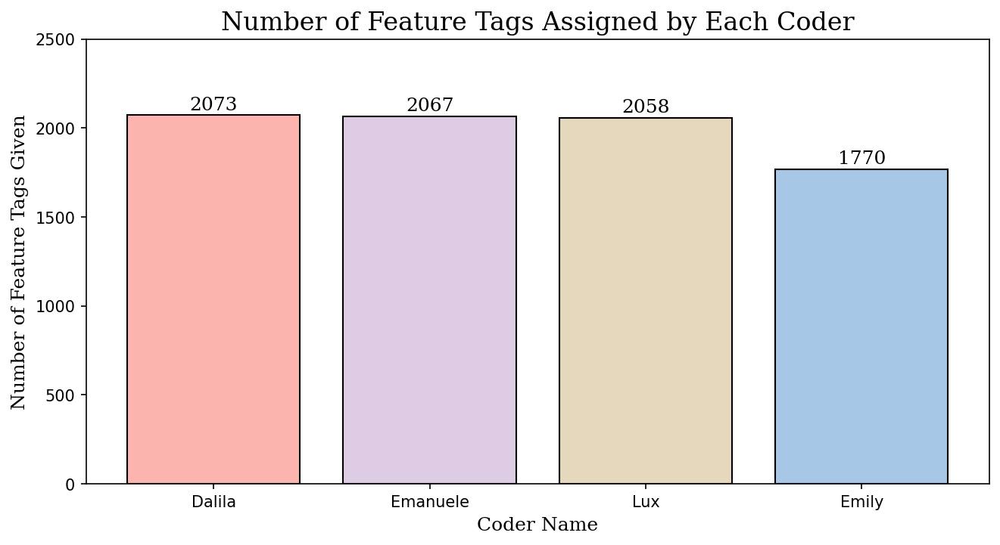

In [ ]:
# visualizing the distribution of coders - tags given
import matplotlib.pyplot as plt
import numpy as np

# data from the print output above
coder_tag_counts = {
    'Dalila': 2073,
    'Emanuele': 2067,
    'Lux': 2058,
    'Emily': 1770
}

# extracting the coder names and their corresponding tag counts
coders = list(coder_tag_counts.keys())
tag_counts = list(coder_tag_counts.values())

colors = plt.cm.Pastel1(np.linspace(0, 1, len(coders)))

colors = list(colors)  # converting to list for modification
colors[coders.index('Emily')] = '#A7C7E7'

# plotting the histogram (bar chart)
plt.figure(figsize=(10, 6))
bars = plt.bar(coders, tag_counts, color=colors, edgecolor='black')

# adding counts on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 30,
             str(int(height)), ha='center', fontsize=12, family='serif')

# adding title and labels
plt.title("Number of Feature Tags Assigned by Each Coder", fontsize=16, family='serif')
plt.xlabel("Coder Name", fontsize=12, family='serif')
plt.ylabel("Number of Feature Tags Given", fontsize=12, family='serif')
plt.ylim(0, 2500)
plt.tight_layout(pad=5.0)
plt.show()

##Feature Co-Occurrence Analysis




In [ ]:
# checking correlation strength and significance with p-values and pearson's r > between two features

import pandas as pd
from collections import Counter
from scipy.stats import pearsonr

# flattening the 'List of features' column into a single list
all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]

# creating a dictionary to store feature co-occurrence counts
feature_cooccurrence = {}
for features in df_final['List of features']:
  features_list = eval(features)
  for i in range(len(features_list)):
    for j in range(i + 1, len(features_list)):
      feature1, feature2 = sorted([features_list[i], features_list[j]])
      if (feature1, feature2) not in feature_cooccurrence:
        feature_cooccurrence[(feature1, feature2)] = 0
      feature_cooccurrence[(feature1, feature2)] += 1

# finding the top 25 most frequent co-occurring features, so ordered by frequency of occurrence / count
top_25_cooccurring_features = sorted(feature_cooccurrence.items(), key=lambda item: item[1], reverse=True)[:25]

# calculating correlation and p-value for top 25 co-occurring features
for (feature1, feature2), count in top_25_cooccurring_features:
  feature1_presence = [1 if feature1 in eval(features) else 0 for features in df_final['List of features']]
  feature2_presence = [1 if feature2 in eval(features) else 0 for features in df_final['List of features']]

  correlation, p_value = pearsonr(feature1_presence, feature2_presence)
  print(f"Features: {feature1}, {feature2} - Count: {count}, Correlation: {correlation:.2f}, P-value: {p_value:.3f}")

Features: eye contact, eyes distorted - Count: 80, Correlation: 0.12, P-value: 0.097
Features: distorted face, eyes distorted - Count: 76, Correlation: 0.34, P-value: 0.000
Features: eye contact, portrait - Count: 74, Correlation: 0.16, P-value: 0.025
Features: distorted face, eye contact - Count: 68, Correlation: -0.05, P-value: 0.457
Features: eyes distorted, portrait - Count: 59, Correlation: 0.06, P-value: 0.395
Features: chair, eye contact - Count: 58, Correlation: 0.00, P-value: 0.965
Features: distorted hands, eye contact - Count: 55, Correlation: -0.06, P-value: 0.391
Features: distorted hands, eyes distorted - Count: 52, Correlation: 0.07, P-value: 0.348
Features: chair, eyes distorted - Count: 51, Correlation: 0.05, P-value: 0.515
Features: eye contact, hunched - Count: 51, Correlation: 0.14, P-value: 0.041
Features: distorted face, portrait - Count: 50, Correlation: -0.06, P-value: 0.398
Features: distorted face, distorted hands - Count: 48, Correlation: 0.04, P-value: 0.591

In [ ]:
# assessing how many images are distorted, which is the case if they have either the face, eyes or hands disrtorted
distorted_tags = ['eyes distorted', 'face distorted', 'hands distorted']
count = 0

# looping through the rows in the dataframe
for index, row in df_final.iterrows():
    tags = row['List of features']
    # checking if any of the distorted tags are in the list of tags for this image
    if any(tag in tags for tag in distorted_tags):
        count += 1

print(f"Number of images tagged with at least one of the specified tags: {count}")

Number of images tagged with at least one of the specified tags: 112


In [ ]:
# ordering correlations now by strength (r), instead of frequency (count)
import pandas as pd
from collections import Counter
from scipy.stats import pearsonr

# flattening the 'List of features' column into a single list
all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]

# creating a dictionary to store feature co-occurrence counts
feature_cooccurrence = {}
for features in df_final['List of features']:
  features_list = eval(features)
  for i in range(len(features_list)):
    for j in range(i + 1, len(features_list)):
      feature1, feature2 = sorted([features_list[i], features_list[j]])
      if (feature1, feature2) not in feature_cooccurrence:
        feature_cooccurrence[(feature1, feature2)] = 0
      feature_cooccurrence[(feature1, feature2)] += 1

# create a list to store the correlation results
correlation_results = []
for (feature1, feature2), count in feature_cooccurrence.items():
  feature1_presence = [1 if feature1 in eval(features) else 0 for features in df_final['List of features']]
  feature2_presence = [1 if feature2 in eval(features) else 0 for features in df_final['List of features']]

  correlation, p_value = pearsonr(feature1_presence, feature2_presence)
  correlation_results.append(((feature1, feature2), correlation, p_value, count))

# sorting the results by correlation strength in descending order
correlation_results_sorted = sorted(correlation_results, key=lambda x: x[1], reverse=True)

# printing the results sorted by correlation strength
for (feature1, feature2), correlation, p_value, count in correlation_results_sorted:
  print(f"Features: {feature1}, {feature2} - "
        f"Count: {count}, "
        f"Correlation: {correlation:.2f}, "
        f"P-value: {p_value:.3f}")

Features: boxing gloves, dread locks - Count: 1, Correlation: 0.71, P-value: 0.000
Features: mouth covered, musical instruments - Count: 1, Correlation: 0.71, P-value: 0.000
Features: bed, finger pointing - Count: 1, Correlation: 0.71, P-value: 0.000
Features: dread locks, microphone - Count: 1, Correlation: 0.71, P-value: 0.000
Features: animated, text is present - Count: 1, Correlation: 0.71, P-value: 0.000
Features: musical instruments, wound/scar  - Count: 1, Correlation: 0.71, P-value: 0.000
Features: box, reflection - Count: 1, Correlation: 0.71, P-value: 0.000
Features: physical touch, two adults - Count: 4, Correlation: 0.62, P-value: 0.000
Features: ripped jeans, wound/scar  - Count: 1, Correlation: 0.57, P-value: 0.000
Features: computer, patterns or shapes - Count: 1, Correlation: 0.57, P-value: 0.000
Features: mouth covered, tilted - Count: 1, Correlation: 0.57, P-value: 0.000
Features: animated, non-black colour - Count: 1, Correlation: 0.57, P-value: 0.000
Features: hands

In [ ]:
# checking the same possibility for correlations between 3 features > generating the top 10 of three-way correlations

# flattening the 'List of features' column into a single list
all_features = [feature for sublist in df_final['List of features'] for feature in eval(sublist)]

# creating a dictionary to store feature co-occurrence counts
feature_cooccurrence = {}
for features in df_final['List of features']:
  features_list = eval(features)
  for i in range(len(features_list)):
    for j in range(i + 1, len(features_list)):
      for k in range(j + 1, len(features_list)):
        feature1, feature2, feature3 = sorted([features_list[i], features_list[j], features_list[k]])
        if (feature1, feature2, feature3) not in feature_cooccurrence:
          feature_cooccurrence[(feature1, feature2, feature3)] = 0
        feature_cooccurrence[(feature1, feature2, feature3)] += 1

# finding the top 10 most frequent co-occurring features
top_10_cooccurring_features = sorted(feature_cooccurrence.items(), key=lambda item: item[1], reverse=True)[:10]

# calculating correlation and p-value for top 10 co-occurring features
for (feature1, feature2, feature3), count in top_10_cooccurring_features:
  feature1_presence = [1 if feature1 in eval(features) else 0 for features in df_final['List of features']]
  feature2_presence = [1 if feature2 in eval(features) else 0 for features in df_final['List of features']]
  feature3_presence = [1 if feature3 in eval(features) else 0 for features in df_final['List of features']]

  correlation12, p_value12 = pearsonr(feature1_presence, feature2_presence)
  correlation13, p_value13 = pearsonr(feature1_presence, feature3_presence)
  correlation23, p_value23 = pearsonr(feature2_presence, feature3_presence)

  print(f"Features: {feature1}, {feature2}, {feature3} - Count: {count}")
  print(f"Correlation (1,2): {correlation12:.2f}, P-value (1,2): {p_value12:.3f}")
  print(f"Correlation (1,3): {correlation13:.2f}, P-value (1,3): {p_value13:.3f}")
  print(f"Correlation (2,3): {correlation23:.2f}, P-value (2,3): {p_value23:.3f}")
  print("---")

Features: distorted face, eye contact, eyes distorted - Count: 53
Correlation (1,2): -0.05, P-value (1,2): 0.457
Correlation (1,3): 0.34, P-value (1,3): 0.000
Correlation (2,3): 0.12, P-value (2,3): 0.097
---
Features: eye contact, eyes distorted, portrait - Count: 45
Correlation (1,2): 0.12, P-value (1,2): 0.097
Correlation (1,3): 0.16, P-value (1,3): 0.025
Correlation (2,3): 0.06, P-value (2,3): 0.395
---
Features: chair, eye contact, eyes distorted - Count: 39
Correlation (1,2): 0.00, P-value (1,2): 0.965
Correlation (1,3): 0.05, P-value (1,3): 0.515
Correlation (2,3): 0.12, P-value (2,3): 0.097
---
Features: distorted face, distorted hands, eyes distorted - Count: 38
Correlation (1,2): 0.04, P-value (1,2): 0.591
Correlation (1,3): 0.34, P-value (1,3): 0.000
Correlation (2,3): 0.07, P-value (2,3): 0.348
---
Features: distorted hands, eye contact, eyes distorted - Count: 35
Correlation (1,2): -0.06, P-value (1,2): 0.391
Correlation (1,3): 0.07, P-value (1,3): 0.348
Correlation (2,3):

In [ ]:
# creating a network analysis of distinct features (frequency and interconnections)

import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random
import numpy as np
from PIL import Image
from collections import Counter

# ensuring 'List of features' is properly formatted
df_final['List of features'] = df_final['List of features'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# initializing graph
G = nx.Graph()

# tracking feature co-occurrences
feature_pairs = Counter()

# iterating through clusters to add nodes and edges
for _, row in df_final.iterrows():
    features = row['List of features']

    # adding features as nodes
    for feature in features:
        if feature not in G:
            G.add_node(feature, size=0)
        G.nodes[feature]['size'] += 1  # increasing the node size based on frequency

    # creating edges for features that appear together
    for i, feature1 in enumerate(features):
        for feature2 in features[i + 1:]:
            pair = tuple(sorted([feature1, feature2]))  # avoiding duplicate edges
            feature_pairs[pair] += 1  # increasing edge weight

# adding edges to the graph (only keep significant ones)
for (feature1, feature2), weight in feature_pairs.items():
    if weight > 2:  # hiding weak connections
        G.add_edge(feature1, feature2, weight=weight)

# improved node positioning (stretching horizontally, reduce overlap)
pos = nx.spring_layout(G, k=2.7, seed=42)  # k=2.7 = more spread-out

# getting node sizes (log-scaled for better proportionality)
node_sizes = [np.log(G.nodes[node]['size'] + 1) * 450 for node in G.nodes]

# getting edge weights (log-scaled for better clarity)
edge_widths = [np.log(G[u][v]['weight'] + 1) * 1.8 for u, v in G.edges]

# pastel color palette
pastel_colors = [
    "#FFB6C1", "#87CEEB", "#98FB98", "#FFDAB9", "#E6E6FA",
    "#F0E68C", "#FFA07A", "#DDA0DD", "#AFEEEE", "#F5DEB3"
]
node_colors = {node: random.choice(pastel_colors) for node in G.nodes}

# increasing figure size (wider and larger for readability)
plt.figure(figsize=(26, 14))

# setting global font to serif
plt.rcParams["font.family"] = "serif"

# drawing network graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=[node_colors[node] for node in G.nodes], edgecolors="black", alpha=0.85)
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color="gray", alpha=0.3)

# placing labels on nodes
for node, (x, y) in pos.items():
    plt.text(x, y + 0.05, node, fontsize=11, ha='center', va='bottom', color='black')

# overlaying images
for feature, (x, y) in pos.items():
    matching_rows = df_final[df_final['List of features'].apply(lambda x: feature in x)]
    if not matching_rows.empty:
        image_id = random.choice(matching_rows['Image ID'].values)
        if image_id in loaded_images:
            img = Image.open(loaded_images[image_id])
            img = img.resize((55, 55))
            plt.imshow(img, extent=[x-0.08, x+0.08, y-0.08, y+0.08], aspect='auto')

# adding legend for node sizes
legend_sizes = [1, 3, 5, 10, 20]
for size in legend_sizes:
    plt.scatter([], [], s=np.log(size + 1) * 450, c='gray', alpha=0.6, label=f"{size} occurrences")

plt.legend(title="Frequency", loc="upper right", fontsize=11)

plt.title("Network Analysis of Feature Co-Occurrence", fontsize=18)
plt.axis("off")
plt.show()

##Initial Attempt to Feature-Feature Clustering of Imagery

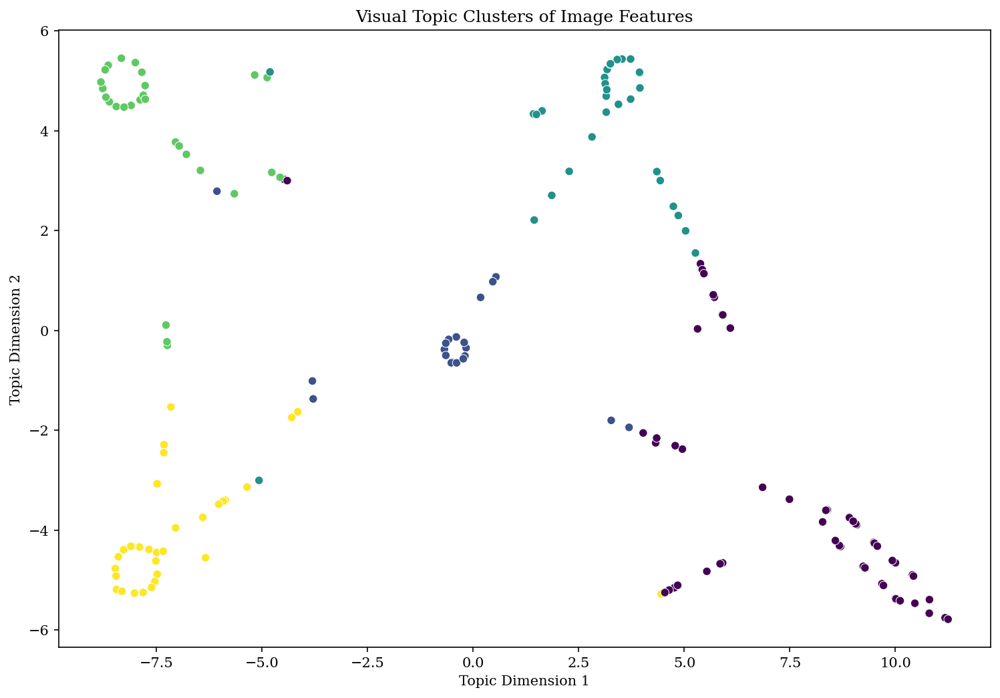

In [ ]:
# making the top 5 clusters of features using topic modelling

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
import random
from PIL import Image

# ensuring 'List of tags' is processed correctly
df_final['List of tags'] = df_final['List of tags'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# converting List of Tags into a format suitable for LDA
tag_corpus = [' '.join(tags) for tags in df_final['List of tags']]

# vectorizing the tag data
vectorizer = CountVectorizer()
tag_matrix = vectorizer.fit_transform(tag_corpus)

# applying LDA to extract topics
num_topics = 5  # setting number of topics extracted to 5
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
topic_distributions = lda.fit_transform(tag_matrix)

# reducing to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(topic_distributions)

# adding the x-y coordinates to the df
df_final['x'] = tsne_results[:, 0]
df_final['y'] = tsne_results[:, 1]

# plotting the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df_final['x'], y=df_final['y'], hue=np.argmax(topic_distributions, axis=1), palette='viridis', legend=None)

# loading images and overlay thumbnails on the scatter plot
for i, row in df_final.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']

    # load image if available (assuming loaded_images is a dict {image_id: image_path})
    if image_id in loaded_images:
        img = Image.open(loaded_images[image_id])
        img = img.resize((30, 30))  # setting thumbnail size

        # overlaying image on scatter plot
        plt.imshow(img, extent=[x-0.5, x+0.5, y-0.5, y+0.5], aspect='auto')

plt.title("Visual Topic Clusters of Image Features")
plt.xlabel("Topic Dimension 1")
plt.ylabel("Topic Dimension 2")
plt.show()

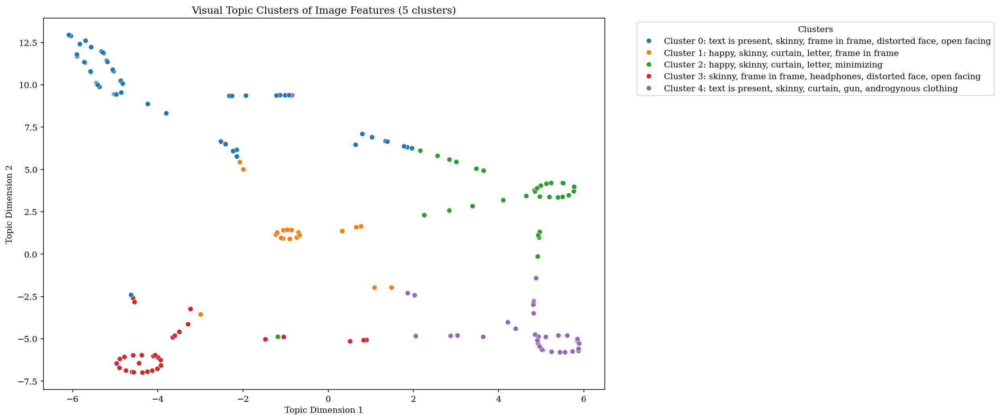

In [ ]:
# adding a legend for each of the clusters
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from PIL import Image

num_topics = 5

# ensuring 'List of features' and 'List of tags' are in list format
df_final['List of features'] = df_final['List of features'].apply(lambda x: eval(x) if isinstance(x, str) else x)
df_final['List of tags'] = df_final['List of tags'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# converting 'List of tags' into text for LDA
tag_corpus = [' '.join(tags) for tags in df_final['List of tags']]

# vectorizing the text data
vectorizer = CountVectorizer()
tag_matrix = vectorizer.fit_transform(tag_corpus)

# applying LDA to extract topics
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
topic_distributions = lda.fit_transform(tag_matrix)

# reducing to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42, init='random', perplexity=30, learning_rate=200)
tsne_results = tsne.fit_transform(topic_distributions)

# assigning results to df_final
df_final['x'] = tsne_results[:, 0]
df_final['y'] = tsne_results[:, 1]
df_final['Topic Cluster'] = np.argmax(topic_distributions, axis=1)

# mapping clusters to their 'List of features'
cluster_features = df_final.groupby('Topic Cluster')['List of features'].apply(lambda x: list(set(sum(x, [])))).to_dict()
cluster_labels = {cluster: ', '.join(features[:5]) for cluster, features in cluster_features.items()}  # Show top 5 features per cluster

# plotting clusters
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(x=df_final['x'], y=df_final['y'], hue=df_final['Topic Cluster'], palette='tab10', legend=True)

for i, row in df_final.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']

    if image_id in loaded_images:
        img = Image.open(loaded_images[image_id])
        img = img.resize((30, 30))

        plt.imshow(img, extent=[x-0.5, x+0.5, y-0.5, y+0.5], aspect='auto')

# formatting legend: show 'List of features' for each cluster
handles, labels = scatter.get_legend_handles_labels()
plt.legend(handles, [f"Cluster {i}: {cluster_labels[i]}" for i in range(num_topics)], title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')

# titles and labels
plt.title(f"Visual Topic Clusters of Image Features ({num_topics} clusters)")
plt.xlabel("Topic Dimension 1")
plt.ylabel("Topic Dimension 2")

plt.show()

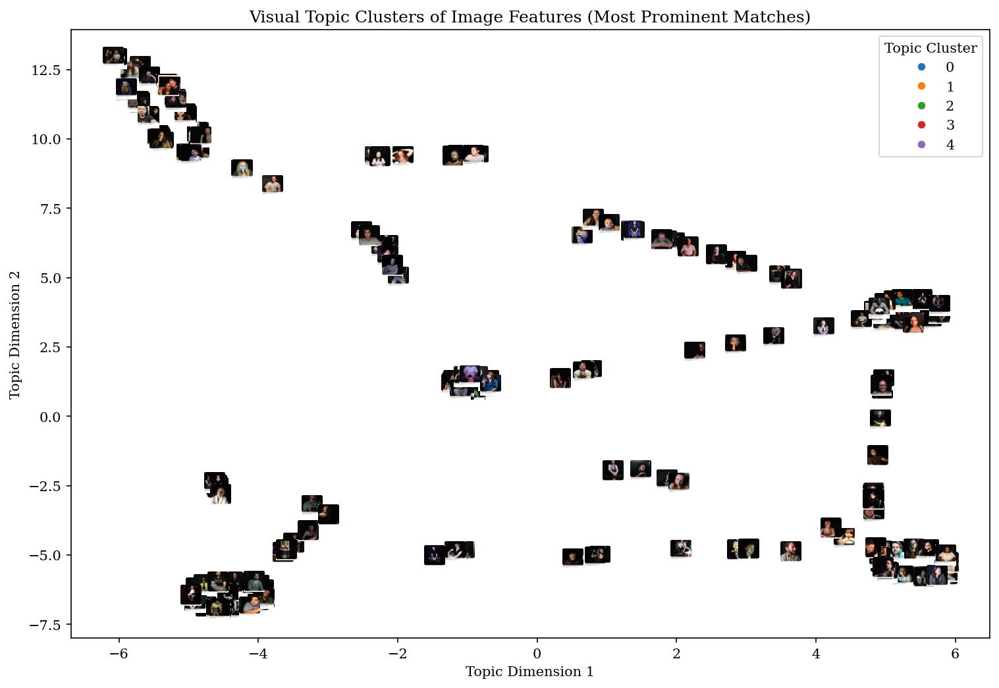

In [ ]:
# plotting the clusters visually with respective images, based on the features tagged for each of the images
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# plotting
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(x=df_final['x'], y=df_final['y'], hue=df_final['Topic Cluster'], palette='tab10', legend=True)

# overlating images as thumbnails
for i, row in df_final.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']

    if image_id in [img_id for img_id, _ in loaded_images]:
        # finding the image object corresponding to the image_id
        image_obj = None
        for img_id, img in loaded_images:
          if img_id == image_id:
            image_obj = img
            break

        if image_obj:
            img = image_obj.resize((30, 30))

            # overlaying image on scatter plot
            imagebox = OffsetImage(img, zoom=0.5)  # Adjust zoom as needed
            ab = AnnotationBbox(imagebox, (x, y), frameon=False)
            plt.gca().add_artist(ab)

# titles and labels
plt.title("Visual Topic Clusters of Image Features (Most Prominent Matches)")
plt.xlabel("Topic Dimension 1")
plt.ylabel("Topic Dimension 2")

plt.show()

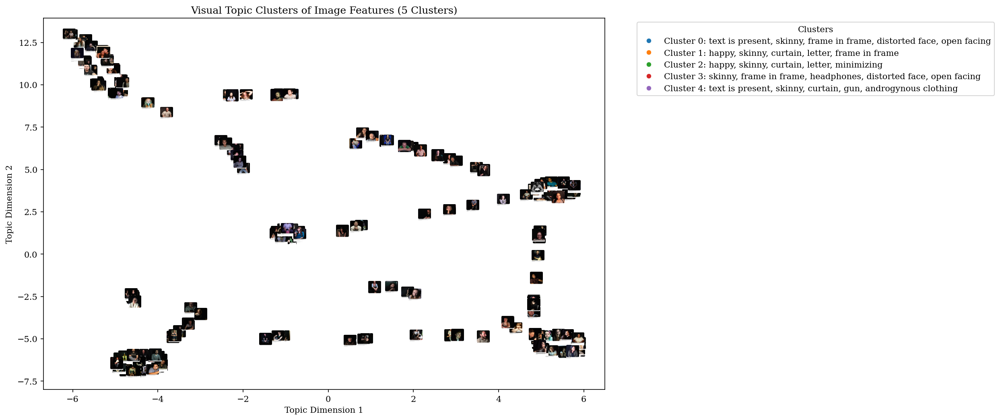

In [ ]:
# adjusting the intitial code above so it displays the legend correctly, making it easier to interpret

import matplotlib.pyplot as plt

# plotting
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(x=df_final['x'], y=df_final['y'], hue=df_final['Topic Cluster'], palette='tab10', legend=True)

# overlaying images as thumbnails
for i, row in df_final.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']

    if image_id in [img_id for img_id, _ in loaded_images]:
        # finding the image object corresponding to the image_id
        image_obj = None
        for img_id, img in loaded_images:
          if img_id == image_id:
            image_obj = img
            break

        if image_obj:
            img = image_obj.resize((30, 30))

            imagebox = OffsetImage(img, zoom=0.5)
            ab = AnnotationBbox(imagebox, (x, y), frameon=False)
            plt.gca().add_artist(ab)


# formatting legend: show 'List of features' for each cluster
handles, labels = scatter.get_legend_handles_labels()
new_labels = [f"Cluster {i}: {cluster_labels[i]}" for i in range(num_topics)]
plt.legend(handles, new_labels, title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')  # Update legend

# titles and labels
plt.title("Visual Topic Clusters of Image Features (5 Clusters)")
plt.xlabel("Topic Dimension 1")
plt.ylabel("Topic Dimension 2")

plt.show()

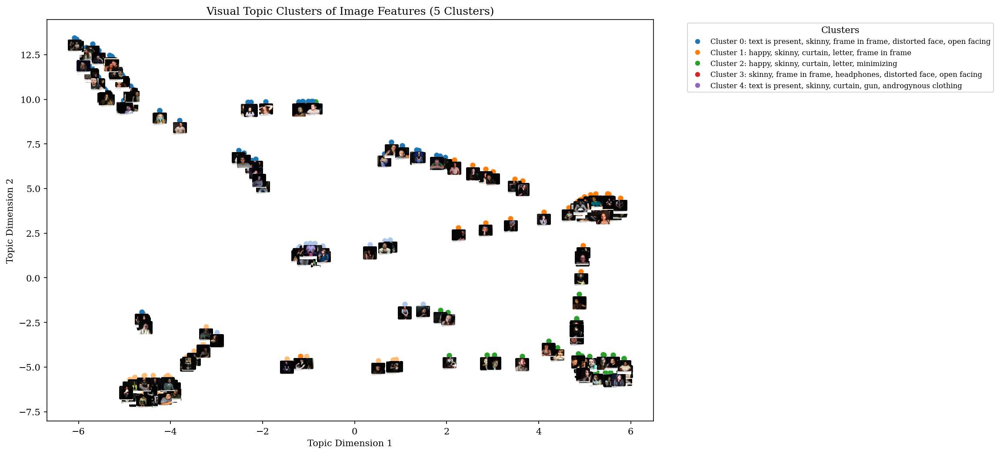


Cluster 0:
Prominent Features: text is present, skinny, frame in frame, distorted face, open facing


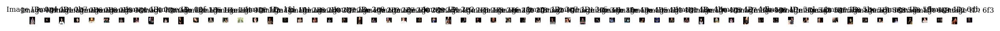


Cluster 1:
Prominent Features: happy, skinny, curtain, letter, frame in frame


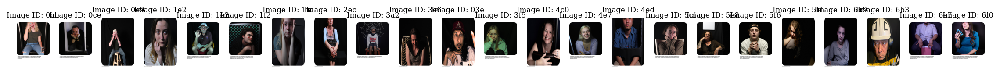


Cluster 2:
Prominent Features: happy, skinny, curtain, letter, minimizing


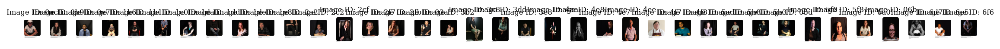


Cluster 3:
Prominent Features: skinny, frame in frame, headphones, distorted face, open facing


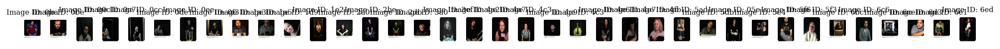


Cluster 4:
Prominent Features: text is present, skinny, curtain, gun, androgynous clothing


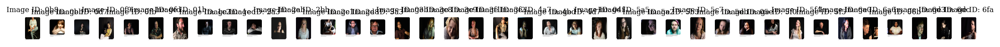

In [ ]:
# using the same code as above, but now incorporating the output PER cluster to have a zoomed-in look at the images and understand which images are related to each cluster

# plotting the clusters
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(x=df_final['x'], y=df_final['y'], hue=df_final['Topic Cluster'], palette='tab10', legend=True)

# overlaying images as thumbnails
for i, row in df_final.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']

    if image_id in [img_id for img_id, _ in loaded_images]:
        # finding the image object corresponding to the image_id
        image_obj = None
        for img_id, img in loaded_images:
          if img_id == image_id:
            image_obj = img
            break

        if image_obj:
            img = image_obj.resize((30, 30))

            # overlaying image on scatter plot
            imagebox = OffsetImage(img, zoom=0.5)
            ab = AnnotationBbox(imagebox, (x, y), frameon=False)
            plt.gca().add_artist(ab)

            # adding a small colored marker above the image
            color = sns.color_palette('tab20')[row['Topic Cluster']]
            plt.plot([x], [y + 0.5], marker='o', markersize=5, color=color)

# formatting legend: showing 'List of features' for each cluster
handles, labels = scatter.get_legend_handles_labels()
new_labels = [f"Cluster {i}: {cluster_labels[i]}" for i in range(num_topics)]
plt.legend(handles, new_labels, title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)  # Update legend and reduce font size

# titles and labels
plt.title(f"Visual Topic Clusters of Image Features ({num_topics} Clusters)")
plt.xlabel("Topic Dimension 1")
plt.ylabel("Topic Dimension 2")

plt.show()

for cluster_num in range(num_topics):  # iterating through each cluster
    cluster_images = df_final[df_final['Topic Cluster'] == cluster_num]

    print(f"\nCluster {cluster_num}:")
    plt.figure(figsize=(15, 5))  # adjusting figure size as needed

    # Extract feature labels for the current cluster
    features_for_cluster = cluster_features.get(cluster_num, [])
    if features_for_cluster:
      print(f"Prominent Features: {', '.join(features_for_cluster[:5])}")

    for i, row in cluster_images.iterrows():
        image_id = row['Image ID']
        if image_id in [img_id for img_id, _ in loaded_images]:  # checking if image ID exists in loaded_images
            # Find the image object corresponding to the image_id
            image_obj = None
            for img_id, img in loaded_images:
              if img_id == image_id:
                image_obj = img
                break

            if image_obj:
                plt.subplot(1, len(cluster_images), cluster_images.index.get_loc(i) + 1)  # adjusting subplot grid based on the number of images
                plt.imshow(image_obj)
                plt.title(f"Image ID: {image_id[:3]}", fontsize=8)  # displaying the first 3 characters of the image ID only to avoid messy output
                plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# adjusting the code above to fix the inconsistency within sizing when display of the images
import matplotlib.pyplot as plt

for cluster_num in range(num_topics):
    cluster_images = df_final[df_final['Topic Cluster'] == cluster_num]

    print(f"\nCluster {cluster_num}:")
    plt.figure(figsize=(15, 5))

    features_for_cluster = cluster_features.get(cluster_num, [])
    if features_for_cluster:
      print(f"Prominent Features: {', '.join(features_for_cluster[:5])}")

    image_count = 0
    for i, row in cluster_images.iterrows():
        image_id = row['Image ID']
        if image_id in [img_id for img_id, _ in loaded_images]:
            image_obj = None
            for img_id, img in loaded_images:
              if img_id == image_id:
                image_obj = img
                break

            if image_obj:
                image_count += 1
                plt.subplot(1, min(5, len(cluster_images)), image_count)
                plt.imshow(image_obj)
                plt.title(f"Image ID: {image_id[:3]}", fontsize=8)
                plt.axis('off')

                if image_count >= 5:
                  plt.tight_layout()
                  plt.show()
                  plt.figure(figsize=(15, 5))
                  image_count = 0

    if image_count > 0:
        plt.tight_layout()
        plt.show()

## Image to Image Similarity Analysis (CLIP and Pixels)

###CLIP Prototype

In [ ]:
!pip cache purge

Files removed: 0


In [ ]:
!pip install git+https://github.com/openai/CLIP.git --quiet
!pip install torch torchvision --quiet
!pip install umap-learn --quiet

  Preparing metadata (setup.py) ... done


In [ ]:
import clip
import plotly.express as px
import requests
import torch
import torch.nn.functional as F
import umap
import warnings

from io import BytesIO
from IPython.display import Image, display
from PIL import Image as PILImage
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

warnings.filterwarnings("ignore")

In [ ]:
# loading CLIP model and preprocess function
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device = device)

In [ ]:
print(loaded_images[0])

('0a4c8707ecab49c6b87309778db35495_with_caption.png', <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1181x1848 at 0x7D0701C5CCD0>)


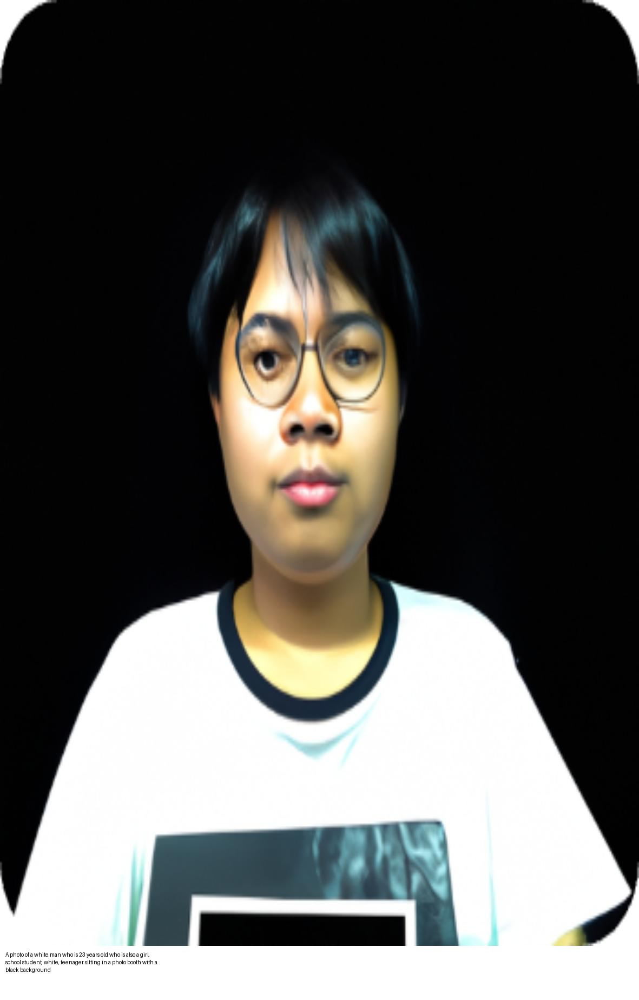

In [ ]:
image = loaded_images[3][1]
#display the image
display(image)

# prepare for encoding
image = preprocess(image).unsqueeze(0).to(device)

# display the image

texts = [
    "black",
    "white",
    "latino",
    "asian"
]

In [ ]:
# encode image and text features
with torch.no_grad():
    image_features = model.encode_image(image)
    text_features = model.encode_text(
        clip.tokenize(texts).to(device)
    )

In [ ]:
# normalize features
image_features /= image_features.norm(dim = -1, keepdim = True)
text_features /= text_features.norm(dim = -1, keepdim = True)

In [ ]:
# helper function to calculate cosine similarity
def calculate_similarity(image_features, text_features):
    return F.cosine_similarity(image_features, text_features.unsqueeze(0)).item()

In [ ]:
# combine embeddings
combined_features = torch.cat([
    image_features,
    text_features
], dim = 0).cpu().numpy()

In [ ]:
# compute cosine similarities once and update labels for plotting
similarities = [calculate_similarity(image_features, text_features[i]) for i in range(len(texts))]
labels = ["Image"] + [
    f"{text} (Cosine Similarity: {similarity:.6f})" for text, similarity in zip(texts, similarities)
]

In [ ]:
# print header and similarity scores
print(f"{'Text':<35} {'Cosine Similarity':<10}")
print("-" * 60)
for text, similarity in zip(texts, similarities):
    print(f"{text:<35} {similarity:<10.6f}")

Text                                Cosine Similarity
------------------------------------------------------------
black                               0.222784  
white                               0.239481  
latino                              0.235057  
asian                               0.270168  


In [ ]:
# function to plot using Plotly
def plot_reduction(data, title, similarities):
    fig = px.scatter(
        x = data[:, 0],
        y = data[:, 1],
        color = labels,
        title = title,
        labels = {"x": "x", "y": "y"},
        size = similarities
    )
    # fig.update_traces(marker = dict(sizemode = "diameter", sizemin = 5))
    fig.show()

image_marker_size = 1

#### Principal Component Analysis (PCA)

**TL;DR**<br>
PCA visualises the data in a 2D space by reducing its dimensions while preserving variance, showing how the image and texts relate based on their cosine similarities.

**Summary**<br>
Good for general variance representation and linear relationships.italicised text

In [ ]:
# PCA
pca = PCA(n_components = 2)
pca_result = pca.fit_transform(combined_features)
plot_reduction(
    pca_result,
    "PCA",
    [image_marker_size] + similarities
)

#### Uniform Manifold Approximation and Projection (UMAP)

**TL;DR**<br>
UMAP provides a manifold-based approach to visualise high-dimensional data, capturing local and global structures more effectively than PCA.

**Summary**<br>
Excellent for capturing both local and global structures, revealing complex relationships.

In [ ]:
# UMAP with random_state for reproducibility
n_neighbors = min(15, combined_features.shape[0] - 1)
umap_model = umap.UMAP(n_components = 2, n_neighbors = n_neighbors, random_state = 42)
umap_result = umap_model.fit_transform(combined_features)
plot_reduction(
    umap_result,
    "UMAP",
    [image_marker_size] + similarities
)

#### t-Distributed Stochastic Neighbour Embedding (t-SNE)

**TL;DR**<br>
t-SNE emphasises local relationships and is effective for visualising high-dimensional data clusters, focusing on how closely related the points are.

**Summary**<br>
Best for local relationships and cluster visualisation, focusing on how similar points are.

In [ ]:
# t-SNE with random_state for reproducibility
perplexity = min(30, combined_features.shape[0] - 1)
tsne = TSNE(n_components = 2, perplexity = perplexity, random_state = 42)
tsne_result = tsne.fit_transform(combined_features)
plot_reduction(
    tsne_result,
    "t-SNE",
    [image_marker_size] + similarities
)

### Applying CLIP to our dataset


In [ ]:
df_final.head()

,Image ID,List of tags,List of coders,List of features,Tag Count,Number of tags,x,y,Topic Cluster
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eg_2, fs_2, eg_1, hn_1, af_5, pa_21c, lf_10b,...","['Emily', 'Lux', 'Emanuele', 'Dalila']","[eye contact, portrait, high exposure, chair, ...",10,10,-0.940930,9.388640,0
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[pp_12, eg_2, pa_26, af_3a, eg_1, hn_5, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","[eye contact, warm lighting, body cut off, dis...",8,8,5.195157,3.373807,2
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[pa_13f, eg_2, af_2b, fs_2, eg_1, fa_2a, pa_21...","['Emily', 'Lux', 'Emanuele', 'Dalila']","[eye contact, smiling with teeth, side lightin...",14,14,1.967595,6.249732,0
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eg_2, pa_10, fs_9, eg_1, af_5, lf_10b, fs_12a...","['Emily', 'Lux', 'Emanuele', 'Dalila']","[eye contact, portrait, high exposure, upright...",8,8,-5.441082,10.098861,0
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[bt_0, af_2b, af_3b, pa_21c, af_6, hn_5, lf_10...","['Emily', 'Lux', 'Emanuele', 'Dalila']","[zoomed out, slouched, distorted hands, high e...",9,9,2.876509,-4.833315,4


In [ ]:
# removing the columns 'List of tags', 'List of coders', 'Tag Count', 'Number of tags', 'x', 'y' and 'Topic Cluster'

df_final = df_final.drop(columns=['List of tags', 'List of coders', 'Tag Count', 'Number of tags', 'x', 'y', 'Topic Cluster'], errors='ignore')

In [ ]:
df_final.head()

,Image ID,List of features
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ..."
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e..."


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import torch

# processing all images
all_image_features = []
all_image_ids = []  # storing image IDs for labels

for image_id, image in loaded_images:
    image_input = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        image_features /= image_features.norm(dim=-1, keepdim=True)
        all_image_features.append(image_features.cpu().numpy())
    all_image_ids.append(image_id)

# combining all image features into a single array
all_image_features = np.array(all_image_features).squeeze(1)

# applying K-means clustering
num_clusters = 10  # Adjust based on dataset size
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(all_image_features)

# reduce dimensionality with t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
tsne_results = tsne.fit_transform(all_image_features)

# creating DataFrame including image IDs
df_final_clip = pd.DataFrame({
    'Image ID': all_image_ids,
    'x': tsne_results[:, 0],
    'y': tsne_results[:, 1],
    'Image_Sim_Cluster': cluster_labels
})

# ensuring 'Image ID' exists in both DataFrames and is of the same type
df_final['Image ID'] = df_final['Image ID'].astype(str)
df_final_clip['Image ID'] = df_final_clip['Image ID'].astype(str)

df_final_clip = pd.merge(df_final, df_final_clip, on='Image ID', how='inner')

df_final_clip.head()

,Image ID,List of features,x,y,Image_Sim_Cluster
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ...",-7.010474,-9.022069,1
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis...",-4.641788,7.902772,7
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin...",6.490999,0.943211,0
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright...",-5.426239,-0.774691,5
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e...",-2.102685,-5.135329,4


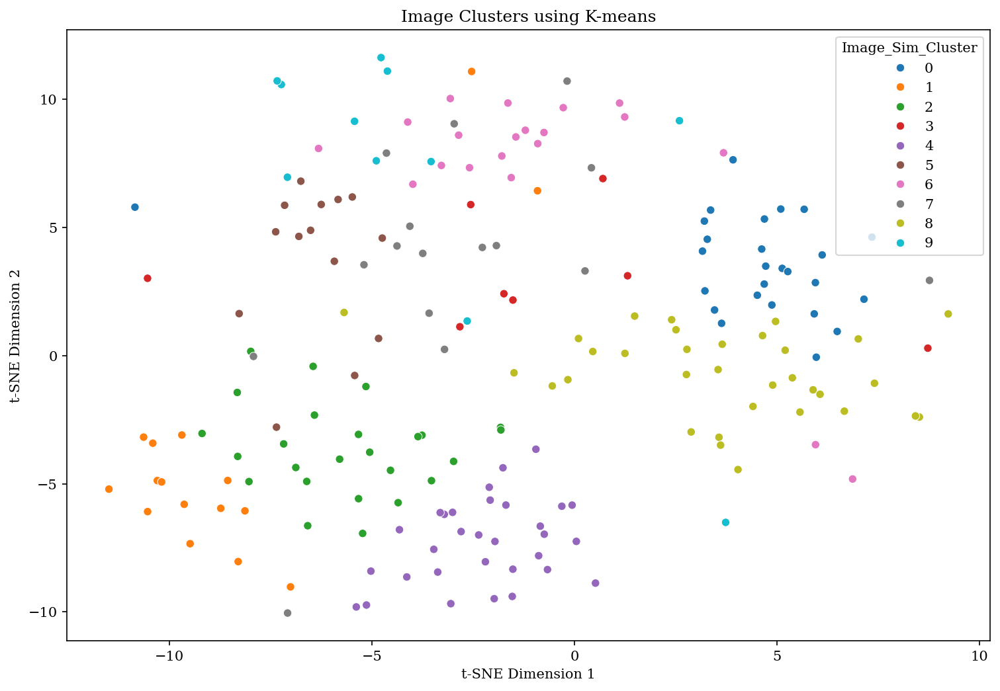

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.offsetbox as offsetbox
from PIL import Image

plt.figure(figsize=(12, 8))
sns.scatterplot(x=df_final_clip['x'], y=df_final_clip['y'], hue=df_final_clip['Image_Sim_Cluster'], palette='tab10', legend=True)

plt.title(f"Image Clusters using K-means")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

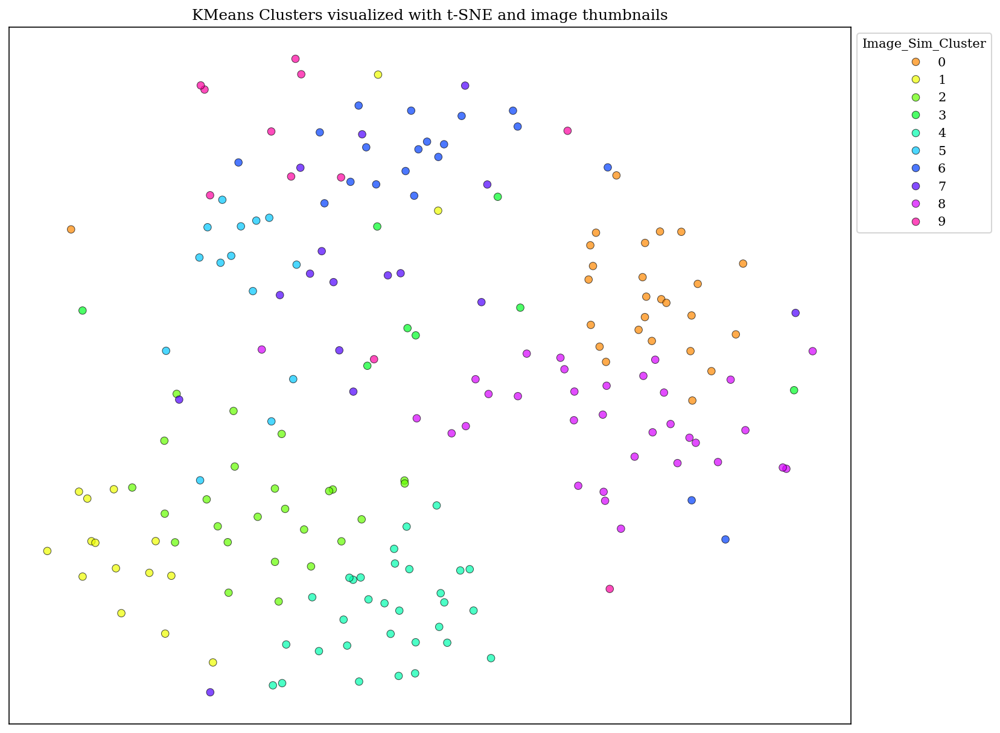

In [ ]:
# creating the scatter plot
plt.figure(figsize=(12, 10))
plt.title("KMeans Clusters visualized with t-SNE and image thumbnails")

# defining colors for clusters
palette = sns.color_palette("hsv", num_clusters)

# plotting each cluster with a different color
sns.scatterplot(
    x=df_final_clip['x'],        # <- fix here
    y=df_final_clip['y'],        # <- fix here
    hue=df_final_clip['Image_Sim_Cluster'],
    palette=palette,
    alpha=0.7,
    edgecolor='k'
)

# removing axes for better visualization
plt.xlabel("")
plt.ylabel("")
plt.xticks([])
plt.yticks([])
plt.legend(title="Image_Sim_Cluster", bbox_to_anchor=(1, 1), loc="upper left")
plt.show()


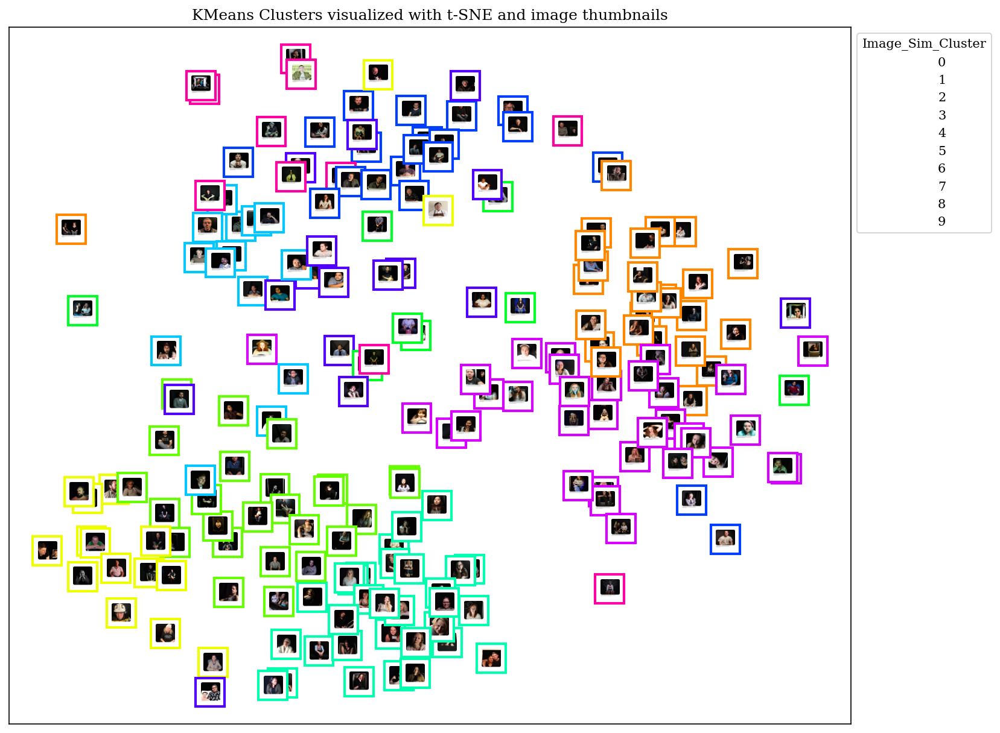

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.offsetbox as offsetbox
from PIL import Image

# creating the scatter plot background
fig, ax = plt.subplots(figsize=(12, 10))
plt.title("KMeans Clusters visualized with t-SNE and image thumbnails")

# defining colors for clusters
palette = sns.color_palette("hsv", num_clusters)
cluster_colors = {cluster: color for cluster, color in enumerate(palette)}

# plotting empty points to set up the plot structure
sns.scatterplot(
    x=df_final_clip['x'],
    y=df_final_clip['y'],
    hue=df_final_clip['Image_Sim_Cluster'],
    palette=palette,
    alpha=0.0,
    edgecolor='k'
)

plt.xlabel("")
plt.ylabel("")
plt.xticks([])
plt.yticks([])
plt.legend(title="Image_Sim_Cluster", bbox_to_anchor=(1, 1), loc="upper left")

# converting loaded_images into a dictionary for faster lookup
image_dict = {img_id: img for img_id, img in loaded_images}

# overlaying image thumbnails with colored borders
for _, row in df_final_clip.iterrows():
    image_id = row['Image ID']
    x, y = row['x'], row['y']    # <- FIX here
    cluster = row['Image_Sim_Cluster']

    if image_id in image_dict:
        try:
            img = image_dict[image_id].resize((30, 30))  # Resize image

            # creating image annotation with colored border
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(img, zoom=0.5),
                (x, y),
                frameon=True,
                bboxprops={"edgecolor": cluster_colors[cluster], "linewidth": 2}  # Add color border
            )
            ax.add_artist(imagebox)
        except Exception as e:
            print(f"Could not load image {image_id}: {e}")

plt.show()

In [ ]:
# converting loaded_images into a dictionary for faster lookup
image_dict = {img_id: img for img_id, img in loaded_images}

for cluster_num in range(num_clusters):
    cluster_images = df_final_clip[df_final_clip['Image_Sim_Cluster'] == cluster_num]  # <- FIX here

    print(f"\nCluster {cluster_num}:")
    plt.figure(figsize=(15, 5))

    image_count = 0
    for i, row in cluster_images.iterrows():
        image_id = row['Image ID']

        if image_id in image_dict:
            image_obj = image_dict[image_id]

            image_count += 1
            plt.subplot(1, min(5, len(cluster_images)), image_count)
            plt.imshow(image_obj)
            plt.title(f"ID: {image_id[:3]}", fontsize=8)
            plt.axis('off')

            if image_count >= 5:
                plt.tight_layout()
                plt.show()
                plt.figure(figsize=(15, 5))
                image_count = 0

    if image_count > 0:
        plt.tight_layout()
        plt.show()

### Investigations of patterns between visual clusters considering the co-occurrences between features in each of them


In [ ]:
print(df_final_clip.head())

df_img_sim_and_tags = df_final_clip[['Image ID', 'List of features', 'Image_Sim_Cluster']]

print(df_img_sim_and_tags.head())

                                            Image ID  \
0  0a4c8707ecab49c6b87309778db35495_with_caption.png   
1  0ac39f79543c4a50a27c7d85341783e6_with_caption.png   
2  0b1d1b09637d4b4bb333d735342b723c_with_caption.png   
3  0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png   
4  0b8bd069361d42038e697959a271f079_with_caption.png   

                                    List of features         x         y  \
0  [eye contact, portrait, high exposure, chair, ... -7.010474 -9.022069   
1  [eye contact, warm lighting, body cut off, dis... -4.641788  7.902772   
2  [eye contact, smiling with teeth, side lightin...  6.490999  0.943211   
3  [eye contact, portrait, high exposure, upright... -5.426239 -0.774691   
4  [zoomed out, slouched, distorted hands, high e... -2.102685 -5.135329   

   Image_Sim_Cluster  
0                  1  
1                  7  
2                  0  
3                  5  
4                  4  
                                            Image ID  \
0  0a4c8707e

In [ ]:
df_final_clip.dtypes

,0
Image ID,object
List of features,object
x,float32
y,float32
Image_Sim_Cluster,int32


In [ ]:
df_final_clip.head()

,Image ID,List of features,x,y,Image_Sim_Cluster
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ...",-7.010474,-9.022069,1
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis...",-4.641788,7.902772,7
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin...",6.490999,0.943211,0
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright...",-5.426239,-0.774691,5
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e...",-2.102685,-5.135329,4


In [ ]:
from collections import Counter
from itertools import combinations
import ast

# function to clean the feature string
def clean_feature_string(feature_string):
    if isinstance(feature_string, list):
        return feature_string
    if isinstance(feature_string, str):
        feature_string = feature_string.strip()
        if feature_string.startswith("[") and feature_string.endswith("]"):
            return feature_string
        else:
            feature_string = f"[{feature_string}]"
            return feature_string
    return []

# initializing a counter for global feature pairs and a dictionary for clusters
feature_global_count = Counter()
cluster_feature_counts = {cluster: Counter() for cluster in df_final_clip['Image_Sim_Cluster'].unique()}
cluster_images = {cluster: [] for cluster in df_final_clip['Image_Sim_Cluster'].unique()}

# looping through each row and generate feature pairs per cluster
for idx, row in df_final_clip.iterrows():
    try:
        clean_features = clean_feature_string(row['List of features'])
        if isinstance(clean_features, str):
            features = ast.literal_eval(clean_features)  # Safe to use ast.literal_eval
        else:
            features = clean_features
    except Exception as e:
        features = []
        print(f"Error parsing features for Image ID {row['Image ID']}: {e}")

    if len(features) < 2:
        print(f"Skipping Image ID {row['Image ID']} as it has fewer than 2 features: {features}")
        continue

    # generating feature pairs
    feature_pairs = list(combinations(features, 2))
    if feature_pairs:
        cluster_feature_counts[row['Image_Sim_Cluster']].update(feature_pairs)
        cluster_images[row['Image_Sim_Cluster']].append(row['Image ID'])
        feature_global_count.update(feature_pairs)

# displaying results for each cluster in the desired format
for cluster, count in cluster_feature_counts.items():
    print(f"\nCluster {cluster}:")
    print(f"Images: {cluster_images[cluster]}")
    print("Feature pairs:")
    top_pairs = count.most_common(20)  # get top 20 feature pairs
    for pair, frequency in top_pairs:
        print(f"{pair}: {frequency}")


Cluster 1:
Images: ['0a4c8707ecab49c6b87309778db35495_with_caption.png', '0ee61ce928d94ee9b35785ef053520f3_with_caption.png', '0fdeaffcf0ba4b20acbb4698ac8d94b3_with_caption.png', '01b039b4019e4c6f9d1e2429b3207abf_with_caption.png', '2e3909776d8e4611a6f8b5d661b9d762_ittgwo_with_caption.png', '3e5d756ee8e24ae2a0514b9a75d7a961_with_caption.png', '4aaa69050e884709933fd982cde1813b_ittgwo_with_caption.png', '4dbb196a640947a5899763882dabe8d4_with_caption.png', '4e6fd958eaa54da698b50a2a9f723133_with_caption.png', '4e78fe27531246d886022d021f135d3c_with_caption.png', '4e82ad6fec3847eca1f85918fc7d3237_with_caption.png', '4ee02dcc14a7449c8747903755468793_with_caption.png', '4f7dada51bd84f1998c781105a35d036_with_caption.png', '5bcbe6007b63439fa39a8ee225526be9_with_caption.png', '6a65a010507c44a3b1f340aabb6137f6_with_caption.png', '6b3643c5a2604d0f97c668a91ef2be25_with_caption.png']
Feature pairs:
('eye contact', 'portrait'): 7
('eye contact', 'chair'): 7
('portrait', 'distorted face'): 7
('portrai

In [ ]:
import pandas as pd
from collections import Counter
from itertools import combinations
import ast

# assuming df_final_clip is your DataFrame

# step 1: Gather images by cluster
image_clusters = df_final_clip.groupby('Image_Sim_Cluster')['Image ID'].apply(list).to_dict()

# step 2: Calculate feature pair counts for each cluster
cluster_feature_counts = {cluster: Counter() for cluster in df_final_clip['Image_Sim_Cluster'].unique()}
feature_global_count = Counter()  # to track global counts for each feature pair
image_to_feature_pairs = {cluster: {} for cluster in df_final_clip['Image_Sim_Cluster'].unique()}  # to track feature pairs for each image

# for each image, get the feature pairs and update the count for the cluster
for idx, row in df_final_clip.iterrows():
    cluster = row['Image_Sim_Cluster']
    # if features are a string representation of a list, convert it
    features = ast.literal_eval(row['List of features']) if isinstance(row['List of features'], str) else row['List of features']
    image_id = row['Image ID']

    # generating all possible pairs of features from the list of features
    feature_pairs = list(combinations(features, 2))

    # updating cluster counts and global counts
    cluster_feature_counts[cluster].update(feature_pairs)
    feature_global_count.update(feature_pairs)

    # tracking which feature pairs are in which image
    for pair in feature_pairs:
        if pair not in image_to_feature_pairs[cluster]:
            image_to_feature_pairs[cluster][pair] = []
        image_to_feature_pairs[cluster][pair].append(image_id)

# step 3: filtering feature pairs to ensure they only appear in the cluster with the highest count
cluster_top_features = {cluster: Counter() for cluster in df_final_clip['Image_Sim_Cluster'].unique()}

for feature_pair, global_count in feature_global_count.items():
    counts_in_clusters = {cluster: cluster_feature_counts[cluster].get(feature_pair, 0)
                          for cluster in df_final_clip['Image_Sim_Cluster'].unique()}
    max_count = max(counts_in_clusters.values())
    clusters_with_max_count = [cluster for cluster, count in counts_in_clusters.items() if count == max_count]

    if len(clusters_with_max_count) == 1:
        best_cluster = clusters_with_max_count[0]
        cluster_top_features[best_cluster][feature_pair] = max_count

# step 4: creating a new dictionary with feature pairs and their corresponding images
cluster_co_occurrences_with_images = {}

# for each cluster, get the co-occurrences and their associated images
for cluster, top_features in cluster_top_features.items():
    # Ccnvert cluster to string for easier display
    cluster_str = str(cluster)

    # initializing a dictionary to hold co-occurrence and image lists for the current cluster
    cluster_co_occurrences_with_images[cluster_str] = {}

    for feature_pair, count in top_features.items():
        # getting the list of images from this cluster showing this co-occurrence
        images_with_co_occurrence = image_to_feature_pairs[cluster].get(feature_pair, [])
        cluster_co_occurrences_with_images[cluster_str][feature_pair] = images_with_co_occurrence

# final output in the desired format
output = {}
for cluster_str, feature_pairs in cluster_co_occurrences_with_images.items():
    output[cluster_str] = {}
    for feature_pair, images in feature_pairs.items():
        output[cluster_str][feature_pair] = images

# displaying the output (or save it as needed)
print(output)

{'1': {('high exposure', 'photorealistic'): ['0a4c8707ecab49c6b87309778db35495_with_caption.png', '01b039b4019e4c6f9d1e2429b3207abf_with_caption.png'], ('patterned clothing', 'photorealistic'): ['0a4c8707ecab49c6b87309778db35495_with_caption.png', '01b039b4019e4c6f9d1e2429b3207abf_with_caption.png'], ('upright ', 'photorealistic'): ['0a4c8707ecab49c6b87309778db35495_with_caption.png'], ('photorealistic', 'eyes distorted'): ['0a4c8707ecab49c6b87309778db35495_with_caption.png', '01b039b4019e4c6f9d1e2429b3207abf_with_caption.png'], ('minimizing', 'low exposure'): ['0ee61ce928d94ee9b35785ef053520f3_with_caption.png', '4e78fe27531246d886022d021f135d3c_with_caption.png'], ('eyes distorted', 'chair'): ['0ee61ce928d94ee9b35785ef053520f3_with_caption.png'], ('eyes distorted', 'low exposure'): ['0ee61ce928d94ee9b35785ef053520f3_with_caption.png'], ('eyes distorted', 'fetal position'): ['0ee61ce928d94ee9b35785ef053520f3_with_caption.png'], ('eyes distorted', 'morphed into object'): ['0ee61ce928d9

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# step 1: Create a dictionary from the loaded_images list for quick lookup
# mapping image_id to image object from loaded_images
loaded_images_dict = {img_id: image_obj for img_id, image_obj in loaded_images}

# step 2: Display results for each cluster
for cluster, co_occurrences in cluster_co_occurrences_with_images.items():
    print(f"\nCluster {cluster}:")

    # getting the top 3 co-occurrences for the current cluster (sorted by count in descending order)
    top_3_co_occurrences = sorted(co_occurrences.items(), key=lambda x: len(x[1]), reverse=True)[:3]

    for i, (feature_pair, images) in enumerate(top_3_co_occurrences, 1):
        print(f"\n  Top {i} Co-occurrence:")
        print(f"    Feature Pair: {feature_pair}")
        print(f"    Number of Occurrences: {len(images)}")
        print(f"    Images Showing this Co-occurrence: {images}")

        # visualizing the first few images (up to 5) that show this co-occurrence
        fig, ax = plt.subplots(1, min(5, len(images)), figsize=(15, 5))
        if len(images) > 1:
            for j, img_id in enumerate(images[:5]):
                image_obj = loaded_images_dict[img_id]
                ax[j].imshow(image_obj)
                ax[j].axis('off')
                ax[j].set_title(f"Image {img_id}")
        else:
            image_obj = loaded_images_dict[images[0]]
            ax.imshow(image_obj)
            ax.axis('off')
            ax.set_title(f"Image {images[0]}")

        plt.show()

# Label Pattern Analysis

##From Prompts to Labels

In [ ]:
# loading the prompts dataset into pandas
df_prompts = pd.read_csv('/content/drive/MyDrive/matched_images_and_captions (1).csv')

In [ ]:
df_prompts.head()

,Original Image ID,Caption Text
0,30118e9a45334584a13c42834fbbf92d,A photo of a asian man who is 27 years old wea...
1,abdfc6f388b745bcb9ab9a046ba270df,A photo of a white man who is 33 years old who...
2,712a35e26456407c85de9fe09be68df8,A photo of a white woman who is 43 years old w...
3,7033be5e486f4c3ebb6f37fab31546f5,A photo of a white woman who is 25 years old w...
4,fdc8d8633b1141c9b31441bf32cea602,A photo of a french man who is 22 years old wh...


In [ ]:
df_prompts = df_prompts.rename(columns={'Original Image ID': 'Image ID'})

In [ ]:
# adding '_with_caption.png' to each row in Image ID in df_prompts for consistency

df_prompts['Image ID'] = df_prompts['Image ID'].astype(str) + '_with_caption.png'

In [ ]:
df_prompts.head()

,Image ID,Caption Text
0,30118e9a45334584a13c42834fbbf92d_with_caption.png,A photo of a asian man who is 27 years old wea...
1,abdfc6f388b745bcb9ab9a046ba270df_with_caption.png,A photo of a white man who is 33 years old who...
2,712a35e26456407c85de9fe09be68df8_with_caption.png,A photo of a white woman who is 43 years old w...
3,7033be5e486f4c3ebb6f37fab31546f5_with_caption.png,A photo of a white woman who is 25 years old w...
4,fdc8d8633b1141c9b31441bf32cea602_with_caption.png,A photo of a french man who is 22 years old wh...


In [ ]:
#merging the image ID-List of features into one df including the Caption Text (prompt), through a left merge
df_features_prompts = pd.merge(df_final, df_prompts[['Image ID', 'Caption Text']], on='Image ID', how='left')

In [ ]:
df_features_prompts.head()

,Image ID,List of features,Caption Text
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ...",A photo of a white woman who is .com73 years o...
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis...",A photo of a white man who is 31 years old wea...
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin...",A photo of a white women who is 23 years old w...
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright...",A photo of a white man who is 23 years old who...
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e...",A photo of a european woman who is 40 years ol...


In [ ]:
# writing a regex script to convert Caption Text into 'List of labels'
import pandas as pd
import re

if 'Caption Text' not in df_features_prompts.columns:
    raise ValueError("The column 'Caption Text' was not found in the dataset.")

# function to process captions
def process_caption(text):
    if pd.isna(text):
        return []

    # lowercase the text
    text = text.lower()

    # remove unnecessary phrases and symbols
    text = re.sub(r'a photo of ', '', text)
    text = re.sub(r'sitting in .*', '', text)  # remove background description
    text = re.sub(r'who is ', '', text)
    text = re.sub(r'years old', '', text)
    text = re.sub(r'\b(?:a|also a)\b', '', text)  # remove 'a' and 'also a'
    text = re.sub(r'\band\b', '', text)  # remove the word 'and'
    text = re.sub(r'\.com', '', text)  # remove '.com'
    text = re.sub(r'\|', '', text)  # remove '|'
    text = re.sub(r',,', ',', text)  # replace double commas with a single comma
    text = re.sub(r',$', '', text)  # remove trailing commas

    # extract age only if not already in the text
    age_match = re.search(r'\b(\d{1,2})\b', text)
    age = float(age_match.group(1)) if age_match else None

    # tokenize words while preserving multi-word descriptors
    words = text.split()
    tokens = []

    for i, word in enumerate(words):
        # capture multi-word attributes (e.g., "blue hat")
        if i < len(words) - 1 and words[i + 1] not in ['who', 'is', 'wearing']:
            tokens.append(word.strip(','))  # Strip commas from tokens
        else:
            tokens.append(word.strip(','))

    # remove filler words
    tokens = [t for t in tokens if t not in ['wearing', 'who', 'is']]

    # ensure numerical values are stored as floats, not strings, except for age
    tokens = [float(t) if t.isdigit() and t != str(age) else t for t in tokens]

    # add extracted age if found and not already in the tokens
    if age is not None and age not in tokens:
        tokens.append(age)

    # Ensure all other tokens are strings or floats
    tokens = [t if isinstance(t, (str, float)) else str(t) for t in tokens]

    # split only the first two words if they are combined
    if len(tokens) > 0 and isinstance(tokens[0], str) and ' ' in tokens[0]:
        first_two = tokens[0].split(maxsplit=1)
        tokens = first_two + tokens[1:]

    return tokens

# preserve all original columns and add the new processed column
df_features_prompts['Processed Labels'] = df_features_prompts['Caption Text'].apply(process_caption)

# show some results
print(df_features_prompts.head())

                                            Image ID  \
0  0a4c8707ecab49c6b87309778db35495_with_caption.png   
1  0ac39f79543c4a50a27c7d85341783e6_with_caption.png   
2  0b1d1b09637d4b4bb333d735342b723c_with_caption.png   
3  0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png   
4  0b8bd069361d42038e697959a271f079_with_caption.png   

                                    List of features  \
0  [eye contact, portrait, high exposure, chair, ...   
1  [eye contact, warm lighting, body cut off, dis...   
2  [eye contact, smiling with teeth, side lightin...   
3  [eye contact, portrait, high exposure, upright...   
4  [zoomed out, slouched, distorted hands, high e...   

                                        Caption Text  \
0  A photo of a white woman who is .com73 years o...   
1  A photo of a white man who is 31 years old wea...   
2  A photo of a white women who is 23 years old w...   
3  A photo of a white man who is 23 years old who...   
4  A photo of a european woman who is 40 years

In [ ]:
df_features_prompts.head()

,Image ID,List of features,Caption Text,Processed Labels
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ...",A photo of a white woman who is .com73 years o...,"[white, woman, 73.0, female, south, african]"
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis...",A photo of a white man who is 31 years old wea...,"[white, man, 31.0, helmet, glasses, calm, unco..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin...",A photo of a white women who is 23 years old w...,"[white, women, 23.0, dutch, student, smart, ea..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright...",A photo of a white man who is 23 years old who...,"[white, man, 23.0, girl, school, student, whit..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e...",A photo of a european woman who is 40 years ol...,"[european, woman, 40.0, woman, white, mother, ..."


In [ ]:
# dropping the original 'Caption Text' column
df_features_prompts = df_features_prompts.drop(columns=['Caption Text'], errors='ignore')

# Rename the 'Processed Labels' column into 'List of labels'
df_features_prompts = df_features_prompts.rename(columns={'Processed Labels': 'List of labels'})

df_features_prompts.head()

,Image ID,List of features,List of labels
0,0a4c8707ecab49c6b87309778db35495_with_caption.png,"[eye contact, portrait, high exposure, chair, ...","[white, woman, 73.0, female, south, african]"
1,0ac39f79543c4a50a27c7d85341783e6_with_caption.png,"[eye contact, warm lighting, body cut off, dis...","[white, man, 31.0, helmet, glasses, calm, unco..."
2,0b1d1b09637d4b4bb333d735342b723c_with_caption.png,"[eye contact, smiling with teeth, side lightin...","[white, women, 23.0, dutch, student, smart, ea..."
3,0b7cafd986d44c20add0ab0c82a4dd2a_with_caption.png,"[eye contact, portrait, high exposure, upright...","[white, man, 23.0, girl, school, student, whit..."
4,0b8bd069361d42038e697959a271f079_with_caption.png,"[zoomed out, slouched, distorted hands, high e...","[european, woman, 40.0, woman, white, mother, ..."


##Descriptive Statistics

Outliers (age > 100): [5454.0]

After removing outliers (age > 100):
Minimum age: 11.0
Maximum age: 75.0
Mean age: 31.83
Median age: 29.00


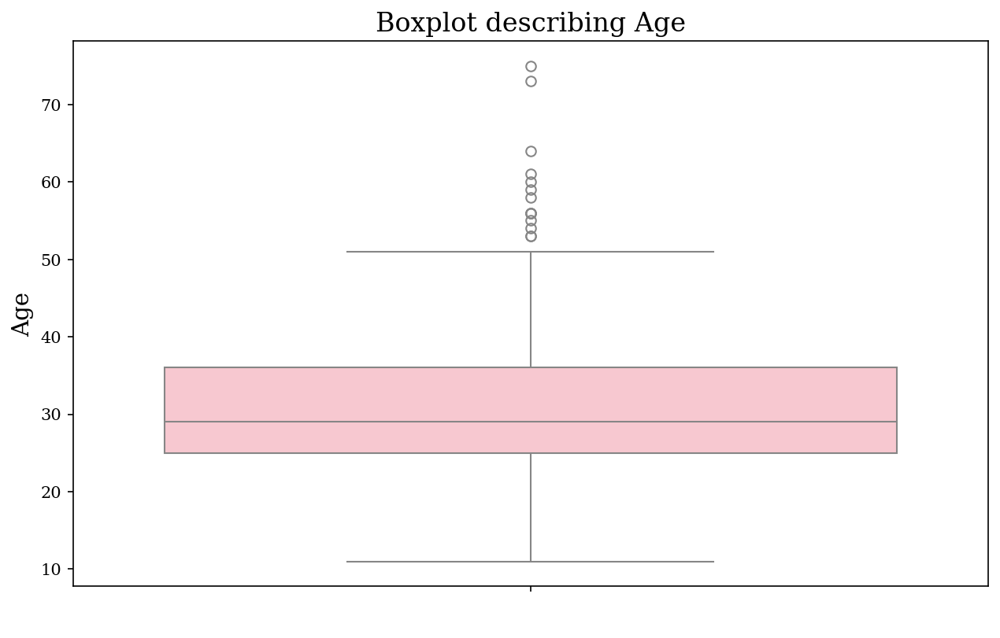

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# function to extract float values from the 'List of labels' column for each row
def extract_floats_from_labels(labels):
    # checking if labels is already a list
    if isinstance(labels, list):
        return [item for item in labels if isinstance(item, float)]

    # if it's a string, try to evaluate it as a list
    try:
        label_list = eval(labels)  # attempt to evaluate the string as a list
        if isinstance(label_list, list):
            return [item for item in label_list if isinstance(item, float)]
        else:
            return []  # return an empty list if eval() doesn't produce a valid list
    except:
        return []  # return an empty list if eval() fails

# apply the function to extract float values from each row's 'List of labels' column
df_features_prompts['float_values_per_row'] = df_features_prompts['List of labels'].apply(extract_floats_from_labels)

# flatten all the extracted float values into a single list
all_float_values = [float_value for sublist in df_features_prompts['float_values_per_row'] for float_value in sublist]

# identify the outliers (age values > 100)
outliers = [value for value in all_float_values if value > 100]
print(f"Outliers (age > 100): {outliers}")

# filter out outlier values (age > 100)
filtered_float_values = [value for value in all_float_values if value <= 100]

# calculating the statistics for age data after outlier removal
min_float = min(filtered_float_values) if filtered_float_values else None
max_float = max(filtered_float_values) if filtered_float_values else None
mean_of_floats = np.mean(filtered_float_values) if filtered_float_values else None
median_of_floats = np.median(filtered_float_values) if filtered_float_values else None

# outputting the basic statistics
print(f"\nAfter removing outliers (age > 100):")
print(f"Minimum age: {min_float}")
print(f"Maximum age: {max_float}")
print(f"Mean age: {mean_of_floats:.2f}")
print(f"Median age: {median_of_floats:.2f}")

# visualizing the boxplot after removing outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=filtered_float_values, color='pink')
plt.title('Boxplot describing Age', fontname='serif', fontsize=16)
plt.xlabel(' ', fontname='serif', fontsize=14)
plt.ylabel('Age', fontname='serif', fontsize=14)
plt.show()

In [ ]:
import ast
from collections import defaultdict

def count_demographic_labels_and_cooccurrences(df, column_name='List of labels'):
    """
    Counts the occurrences of specific demographic labels in a DataFrame column
    and tracks ethnicity-gender co-occurrences ensuring no double-counting of label meanings per row.
    """

    # defining demographic labels with synonyms
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    label_counts = {}
    duplicate_label_counts = {}
    ethnicity_gender_cooccurrence_counts = defaultdict(int)

    # separating ethnicity and gender labels
    ethnicity_labels = ['white', 'black', 'asian', 'middle eastern', 'latinx']
    gender_labels = ['woman', 'man', 'nonbinary']

    images_for_labels = defaultdict(list)

    for index, row in df.iterrows():
        raw_val = row[column_name]

        # safely parse labels
        if isinstance(raw_val, list):
            labels = raw_val
        else:
            try:
                labels = ast.literal_eval(raw_val)
            except (ValueError, TypeError, SyntaxError):
                print(f"Skipping row {index}: Invalid '{column_name}' format")
                continue

        if not isinstance(labels, list):
            labels = [labels]

        found_main_labels_set = set()
        found_main_labels = []

        ethnicity_in_row = set()
        gender_in_row = set()

        for label in labels:
            if isinstance(label, float):  # skip age-like values
                continue

            for main_label, synonyms in demographic_labels.items():
                if label.lower() in synonyms:
                    # count label for overall counts
                    label_counts[main_label] = label_counts.get(main_label, 0) + 1

                    # checking for duplicate main labels (not synonyms)
                    if main_label in found_main_labels_set:
                        duplicate_label_counts[main_label] = duplicate_label_counts.get(main_label, 0) + 1
                    found_main_labels_set.add(main_label)
                    found_main_labels.append(main_label)

                    # collect for co-occurrence later
                    if main_label in ethnicity_labels:
                        ethnicity_in_row.add(main_label)
                    if main_label in gender_labels:
                        gender_in_row.add(main_label)

        # associating image IDs with demographic labels
        img_id = row['Image ID']
        for main_label in set(found_main_labels):
            images_for_labels[main_label].append(img_id)

        # now count all unique ethnicity-gender co-occurrences PER ROW
        for ethnicity in ethnicity_in_row:
            for gender in gender_in_row:
                pair = tuple(sorted([ethnicity, gender]))  # Sorted to ensure (ethnicity, gender) consistency
                ethnicity_gender_cooccurrence_counts[pair] += 1

    # generating descriptions
    demographic_descriptions = []
    for main_label, count in label_counts.items():
        duplicates = duplicate_label_counts.get(main_label, 0)
        unique = count - duplicates
        description = f"The label '{main_label}' appears {count} times in total, with {duplicates} instances of duplicate labels within rows, and {unique} unique rows"
        demographic_descriptions.append(description)

    ethnicity_gender_cooccurrence_descriptions = []
    for pair, count in ethnicity_gender_cooccurrence_counts.items():
        ethnicity_gender_cooccurrence_descriptions.append(
            f"The ethnicity and gender label pair {pair} co-occurred {count} times within the same row"
        )

    return label_counts, duplicate_label_counts, demographic_descriptions, ethnicity_gender_cooccurrence_counts, ethnicity_gender_cooccurrence_descriptions, images_for_labels

In [ ]:
label_counts, duplicate_label_counts, descriptions, ethnicity_gender_cooccurrence_counts, ethnicity_gender_cooccurrence_descriptions, images_for_labels = count_demographic_labels_and_cooccurrences(df_features_prompts)

print("Label Counts:", label_counts)
print("Duplicate Label Counts:", duplicate_label_counts)

print("\nDemographic Descriptions:")
for description in descriptions:
    print(description)

print("\nEthnicity and Gender Co-occurrence Counts:")
for description in ethnicity_gender_cooccurrence_descriptions:
    print(description)

Label Counts: {'white': 248, 'woman': 177, 'man': 118, 'asian': 27, 'latinx': 18, 'middle eastern': 7, 'nonbinary': 1, 'black': 13}
Duplicate Label Counts: {'woman': 59, 'white': 86, 'man': 26, 'asian': 10, 'latinx': 9, 'black': 4}

Demographic Descriptions:
The label 'white' appears 248 times in total, with 86 instances of duplicate labels within rows, and 162 unique rows
The label 'woman' appears 177 times in total, with 59 instances of duplicate labels within rows, and 118 unique rows
The label 'man' appears 118 times in total, with 26 instances of duplicate labels within rows, and 92 unique rows
The label 'asian' appears 27 times in total, with 10 instances of duplicate labels within rows, and 17 unique rows
The label 'latinx' appears 18 times in total, with 9 instances of duplicate labels within rows, and 9 unique rows
The label 'middle eastern' appears 7 times in total, with 0 instances of duplicate labels within rows, and 7 unique rows
The label 'nonbinary' appears 1 times in to

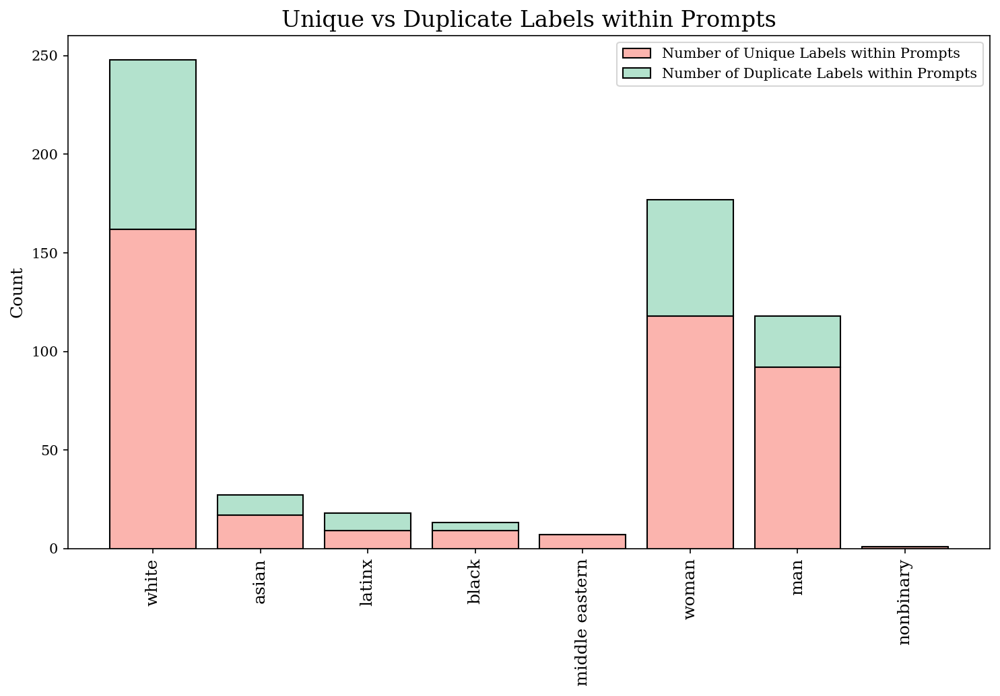

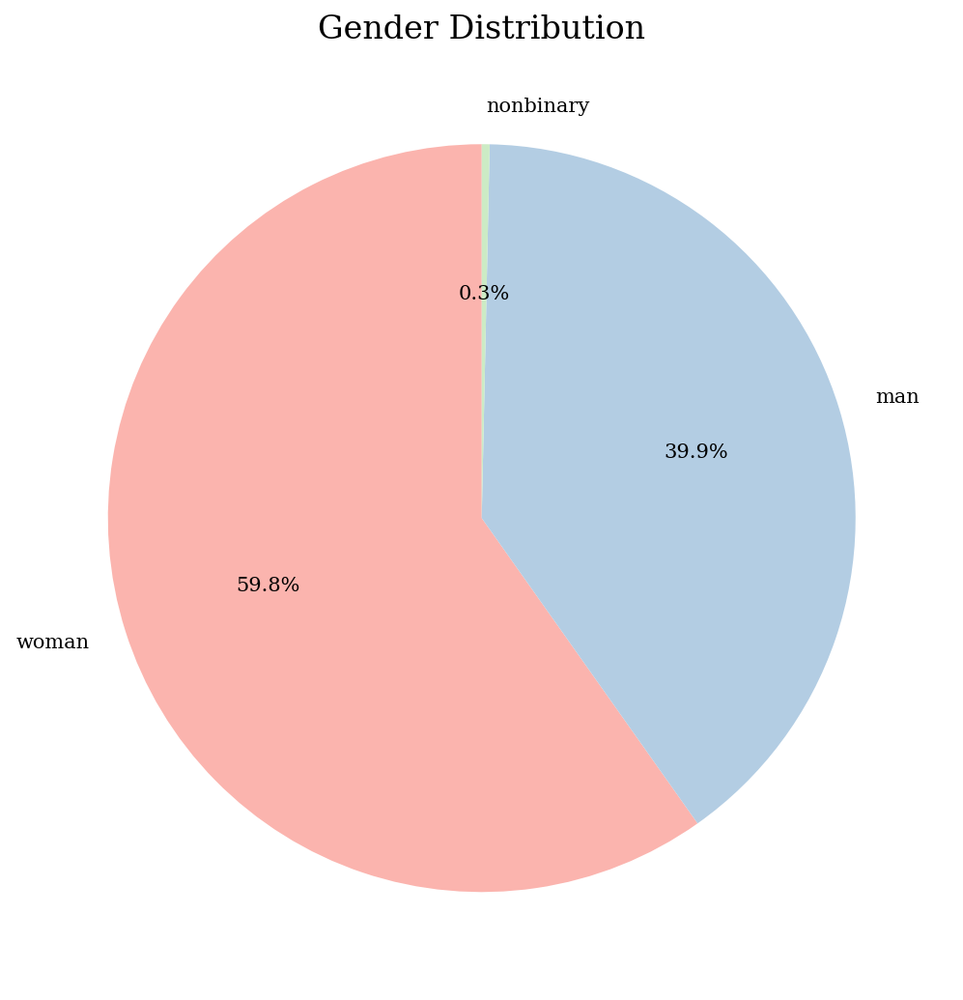

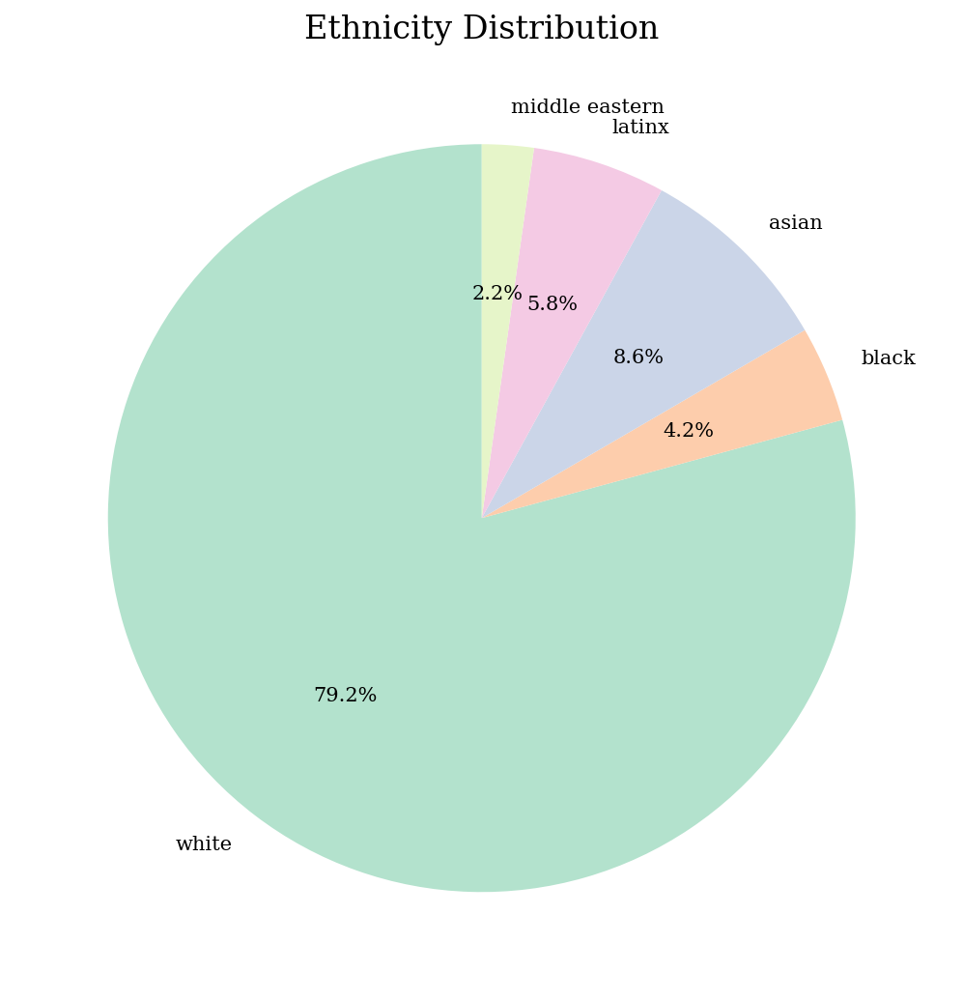

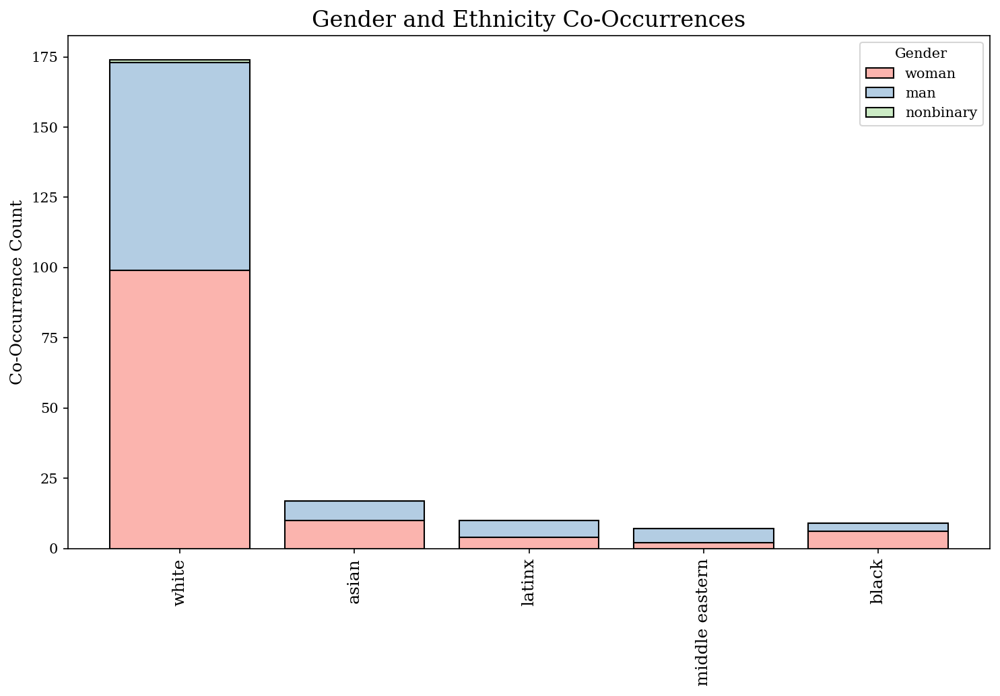

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# setting font to serif globally
rcParams['font.family'] = 'serif'

# demographic label counts
label_counts = {'white': 248, 'woman': 177, 'man': 118, 'asian': 27, 'latinx': 18, 'middle eastern': 7, 'nonbinary': 1, 'black': 13}
duplicate_label_counts = {'woman': 59, 'white': 86, 'man': 26, 'asian': 10, 'latinx': 9, 'black': 4}
unique_rows = 200

# gender and ethnicity counts (combined)
gender_counts = {'woman': 177, 'man': 118, 'nonbinary': 1}
ethnicity_counts = {'white': 248, 'black': 13, 'asian': 27, 'latinx': 18, 'middle eastern': 7}

# ethnicity and Gender Co-occurrence Counts
ethnicity_gender_counts = {
    'white + woman': 99,
    'white + man': 74,
    'asian + woman': 10,
    'asian + man': 7,
    'latinx + woman': 4,
    'latinx + man': 6,
    'middle eastern + woman': 2,
    'white + nonbinary': 1,
    'black + woman': 6,
    'middle eastern + man': 5,
    'black + man': 3
}

# plotting

# 1. stacked bar chart for unique vs duplicate labels (sorted by ethnicity and gender - high to low)
fig, ax = plt.subplots(figsize=(10, 7))

# sort the labels by ethnicity first, then by frequency in descending order
labels_sorted_by_ethnicity = sorted(label_counts.keys(), key=lambda x: (x in ['white', 'black', 'asian', 'latinx', 'middle eastern'], label_counts.get(x, 0)), reverse=True)
unique_counts = [label_counts[label] - duplicate_label_counts.get(label, 0) for label in labels_sorted_by_ethnicity]
duplicate_counts = [duplicate_label_counts.get(label, 0) for label in labels_sorted_by_ethnicity]

# create stacked bars
ax.bar(labels_sorted_by_ethnicity, unique_counts, label='Number of Unique Labels within Prompts', color=plt.cm.Pastel1.colors[0], edgecolor='black')
ax.bar(labels_sorted_by_ethnicity, duplicate_counts, bottom=unique_counts, label='Number of Duplicate Labels within Prompts', color=plt.cm.Pastel2.colors[0], edgecolor='black')

ax.set_title('Unique vs Duplicate Labels within Prompts', fontsize=16)
ax.set_ylabel('Count', fontsize=12)

# rotate the labels vertically
ax.set_xticklabels(labels_sorted_by_ethnicity, rotation=90, fontsize=12)
ax.legend()

plt.tight_layout()
plt.show()

# 2. pie chart for gender labels (unique rows containing gender labels)
gender_unique_rows = sum([1 for label in gender_counts if label in label_counts and label_counts[label] > 0])
gender_counts_pie = [gender_counts.get(g, 0) for g in gender_counts]

fig, ax = plt.subplots(figsize=(7, 7))
ax.pie(gender_counts_pie, labels=gender_counts.keys(), autopct='%1.1f%%', colors=plt.cm.Pastel1.colors, startangle=90)
ax.set_title(f'Gender Distribution', fontsize=16)

plt.tight_layout()
plt.show()

# 3. pie chart for ethnicity labels (unique rows containing ethnicity labels)
ethnicity_unique_rows = sum([1 for label in ethnicity_counts if label in label_counts and label_counts[label] > 0])
ethnicity_counts_pie = [ethnicity_counts.get(e, 0) for e in ethnicity_counts]

fig, ax = plt.subplots(figsize=(7, 7))
ax.pie(ethnicity_counts_pie, labels=ethnicity_counts.keys(), autopct='%1.1f%%', colors=plt.cm.Pastel2.colors, startangle=90)
ax.set_title(f'Ethnicity Distribution', fontsize=16)

plt.tight_layout()
plt.show()

# 4. stacked bar chart for gender and ethnicity co-occurrence (sorted by frequency, high to low)
fig, ax = plt.subplots(figsize=(10, 7))

# sort the co-occurrence counts by frequency in descending order
sorted_ethnicity_gender = sorted(ethnicity_gender_counts.items(), key=lambda x: x[1], reverse=True)

# extract the sorted keys and values
sorted_labels = [item[0] for item in sorted_ethnicity_gender]
sorted_counts = [item[1] for item in sorted_ethnicity_gender]

# gender-specific counts for each ethnicity
gender_bar_heights = {
    'woman': [99, 10, 4, 2, 6],  # counts for woman in each group
    'man': [74, 7, 6, 5, 3],     # counts for man in each group
    'nonbinary': [1, 0, 0, 0, 0], # only for 'white + nonbinary' (there is only one non-binary person, and they are white)
}

# ethnicity labels for the x-axis
ethnicity_labels = ['white', 'asian', 'latinx', 'middle eastern', 'black']
gender_labels = ['woman', 'man', 'nonbinary']

# stack the gender counts for each ethnicity combination
bottoms = np.zeros(len(ethnicity_labels))  # initialize the bottom for the first bar (all zeros)
for i, gender in enumerate(gender_labels):
    ax.bar(ethnicity_labels, gender_bar_heights[gender], label=gender, bottom=bottoms,
           color=plt.cm.Pastel1(i), edgecolor='black')
    bottoms += np.array(gender_bar_heights[gender])  # update the bottom for stacking

# customize the chart
ax.set_title('Gender and Ethnicity Co-Occurrences', fontsize=16)
ax.set_ylabel('Co-Occurrence Count', fontsize=12)

# rotate the labels vertically for the x-axis
ax.set_xticks(np.arange(len(ethnicity_labels)))
ax.set_xticklabels(ethnicity_labels, rotation=90, fontsize=12)
ax.legend(title='Gender')

plt.tight_layout()
plt.show()

##Label Co-Occurrences for Demographic Descriptives

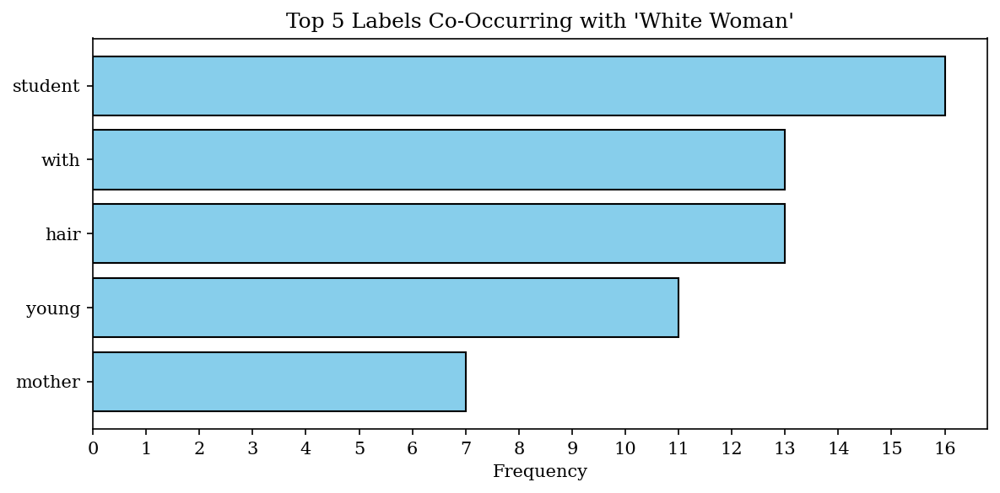

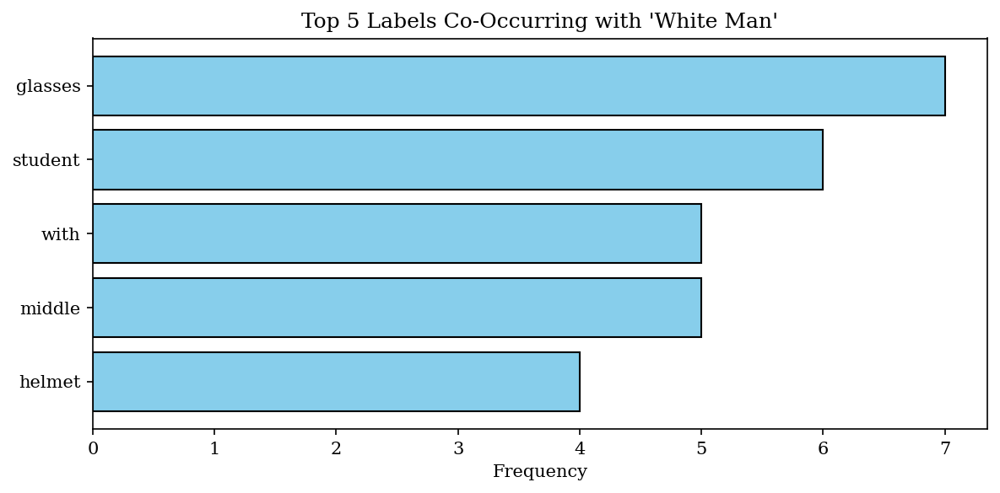

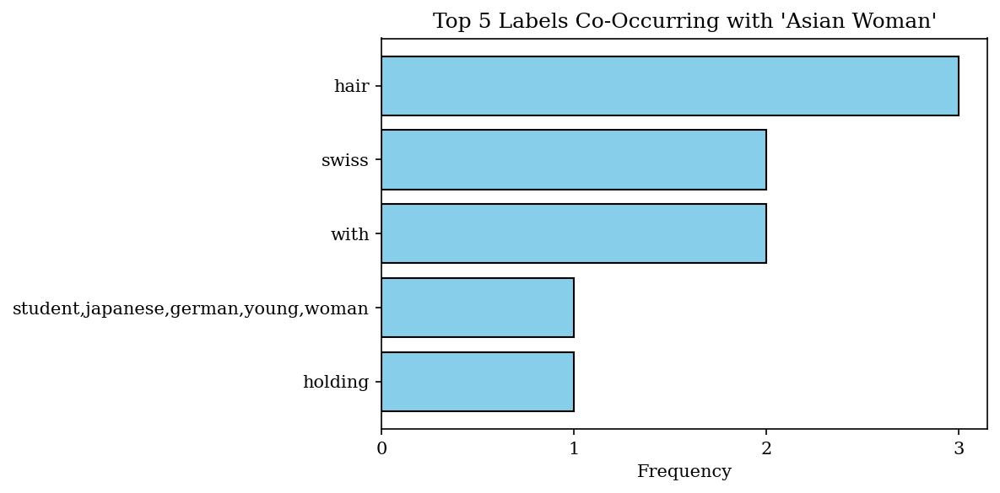

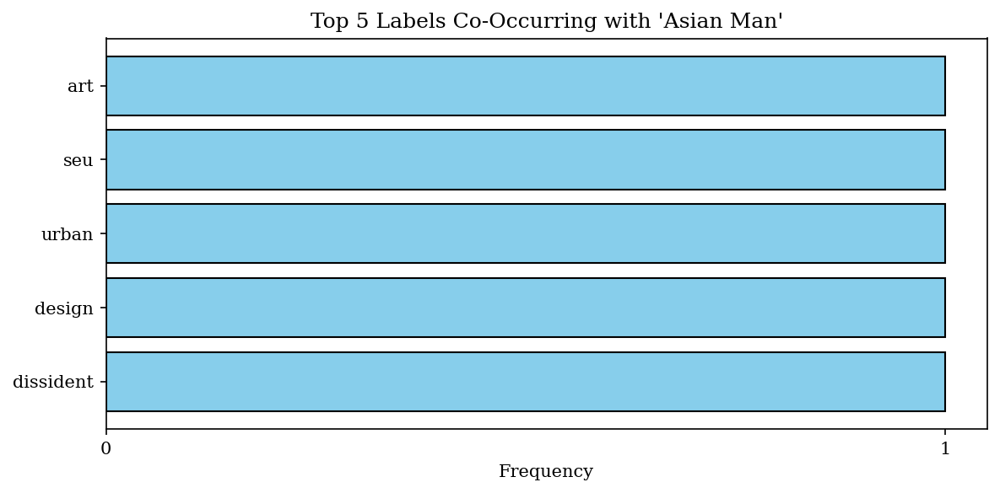

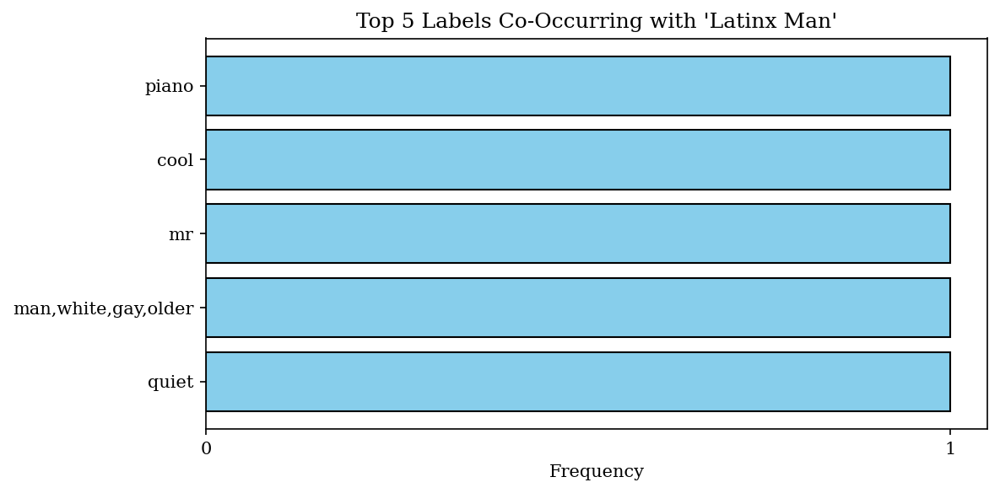

...

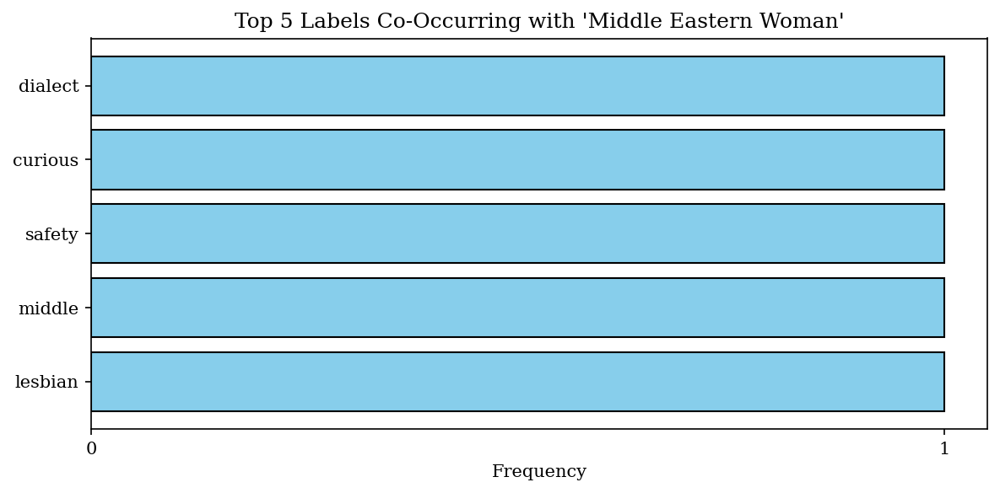

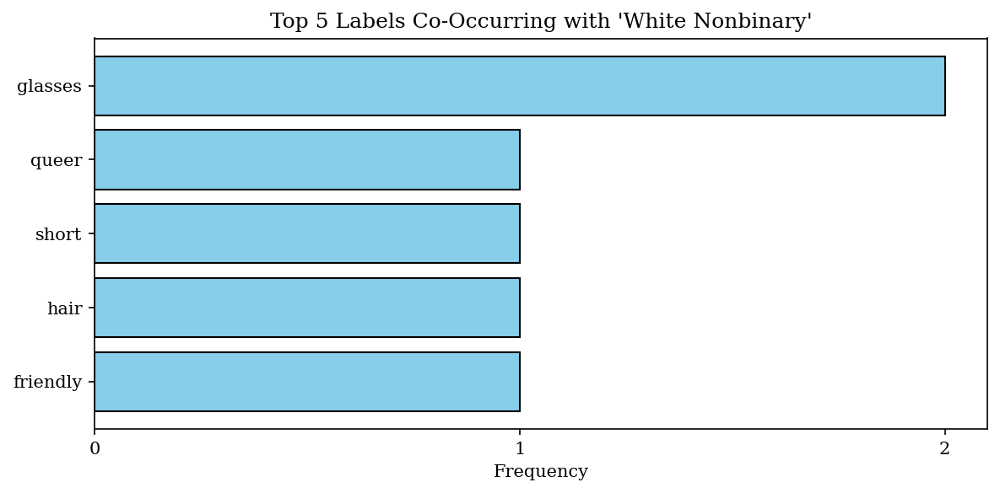

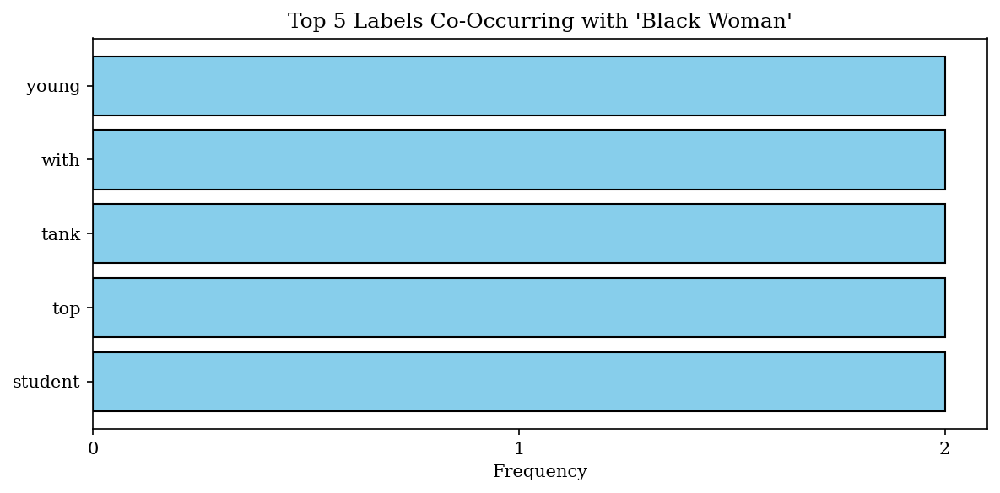

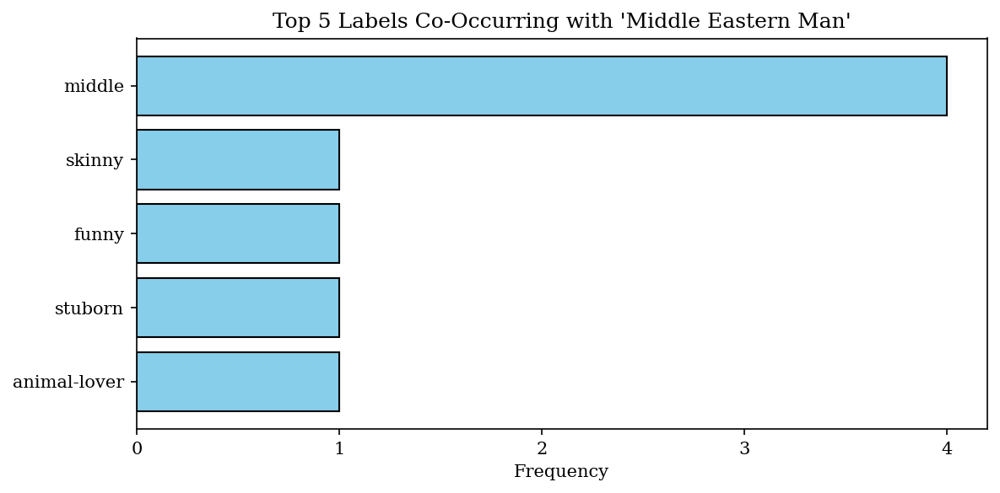

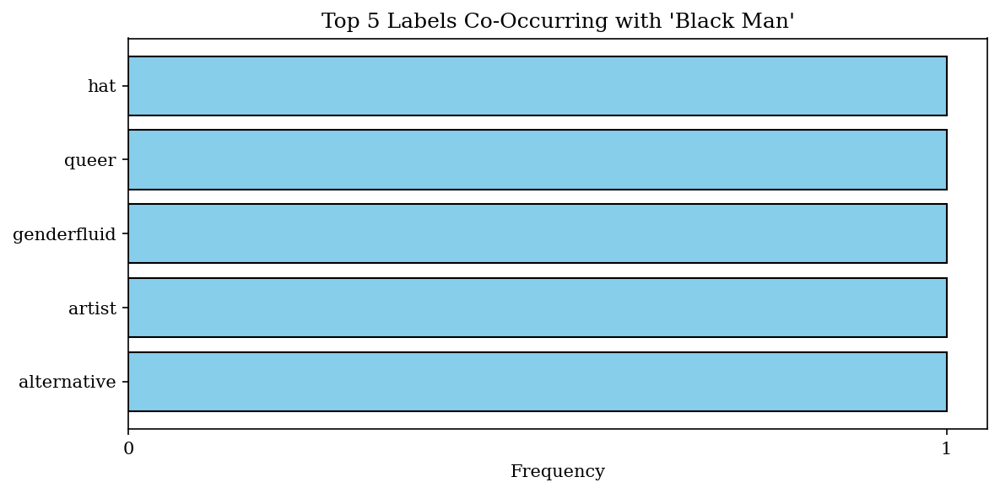

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import ast

def get_top_cooccurring_labels(df, ethnicity_labels, gender_labels, top_n=10, visualize=True):
    """
    Identifies top non-demographic co-occurring labels with each (ethnicity, gender) combination.
    Ignores floats and provides optional visualization.

    Args:
        df: DataFrame with a column 'List of labels'.
        ethnicity_labels: List of ethnicity categories to consider.
        gender_labels: List of gender categories to consider.
        top_n: Number of top co-occurring labels to return per (ethnicity, gender).
        visualize: If True, generates bar charts.

    Returns:
        Dictionary of (ethnicity, gender) -> list of top co-occurring labels with counts.
    """

    # synonym mapping for demographic categories
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    cooccurrence_counts = defaultdict(lambda: defaultdict(int))

    for _, row in df.iterrows():
        labels = row['List of labels']

        if not isinstance(labels, list):
            try:
                labels = ast.literal_eval(labels)
            except:
                continue

        if not isinstance(labels, list):
            continue

        ethnicity_found = set()
        gender_found = set()
        other_labels = []

        for label in labels:
            if isinstance(label, float):
                continue

            label_str = str(label).strip()
            is_demo = False

            for demo_cat, synonyms in demographic_labels.items():
                if label_str.lower() in synonyms:
                    is_demo = True
                    if demo_cat in ethnicity_labels:
                        ethnicity_found.add(demo_cat)
                    elif demo_cat in gender_labels:
                        gender_found.add(demo_cat)
                    break

            if not is_demo:
                other_labels.append(label_str)

        for eth in ethnicity_found:
            for gen in gender_found:
                for lbl in other_labels:
                    cooccurrence_counts[(eth, gen)][lbl] += 1

    # sort and store top co-occurring labels
    top_labels_by_group = {}
    for key, label_counts in cooccurrence_counts.items():
        sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)[:top_n]
        sorted_labels = [(label, int(freq)) for label, freq in sorted_labels]
        top_labels_by_group[key] = sorted_labels

    # visualization
    if visualize:
        for (eth, gen), items in top_labels_by_group.items():
            if not items:
                continue
            labels, counts = zip(*items)
            counts = [int(c) for c in counts]
            plt.figure(figsize=(8, 4))
            bars = plt.barh(labels, counts, color='skyblue', edgecolor='black')
            plt.gca().invert_yaxis()
            plt.title(f"Top {top_n} Labels Co-Occurring with '{eth.title()} {gen.title()}'")
            plt.xlabel("Frequency")
            plt.xticks(range(0, max(counts)+1))  # Increments of 1
            plt.tight_layout()
            plt.show()

    return top_labels_by_group

ethnicities = ['white', 'asian', 'latinx', 'middle eastern', 'black']
genders = ['woman', 'man', 'nonbinary']

top_labels = get_top_cooccurring_labels(df_features_prompts, ethnicities, genders, top_n=5, visualize=True)

#Latent (Feature-Identity) Pattern Analysis


## Investigating a single feature: Adiposity


Step 1: Investigate the Feature "Adiposity"

In [ ]:
# assuming 'df' is your DataFrame with 'List of features' as a column
adiposity_images = df_final_clip[df_final_clip['List of features'].apply(lambda features: 'adiposity' in features)]

# 1. number of images with 'adiposity' in their tags
num_adiposity_images = len(adiposity_images)
print(f"Number of images with 'adiposity': {num_adiposity_images}")

# 2. images with the 'adiposity' tag
print(f"Images with 'adiposity': {adiposity_images['Image ID'].tolist()}")

Number of images with 'adiposity': 10
Images with 'adiposity': ['1a33b20964dd4ac491a03ca9fb698657_with_caption.png', '1ddda19c5b4f483183d39a59626c9aa0_with_caption.png', '1dedae3c9a854103ba517c93a776b3b2_with_caption.png', '1e8bf1d1c13b4158858e4d994e7a3259_with_caption.png', '2c88a42b332949ef87ad38a91d656c30_with_caption.png', '03ba666c1da44c2281cc9fa8de8a982b_with_caption.png', '4f7dada51bd84f1998c781105a35d036_with_caption.png', '5d32c5e68a5046cd916116e46d3dc754_with_caption.png', '6d3107c604a440a5ad2014ee898e03c4_with_caption.png', '6f69285b44a743b4ba72e1ebf20db836_ittgwo_with_caption.png']


Step 2: Check if "Adiposity" is Most Used in Specific Clusters

In [ ]:
# 3. checking the most common clusters where 'adiposity' appears
adiposity_clusters = adiposity_images['Image_Sim_Cluster'].value_counts()
print(f"Clusters with the most 'adiposity' feature occurrences:\n{adiposity_clusters}")

Clusters with the most 'adiposity' feature occurrences:
Image_Sim_Cluster
7    2
6    2
0    1
4    1
2    1
1    1
5    1
8    1
Name: count, dtype: int64


Step 3: Co-occurrences with Other Features

In [ ]:
import ast

adiposity_co_occurrences = {}

for _, row in adiposity_images.iterrows():
    features = row['List of features']

    # safely parse features
    if isinstance(features, str):
        features = ast.literal_eval(features)

    if isinstance(features, list):
        features = [f.lower().strip() for f in features]

        feature_pairs = list(combinations(features, 2))
        for pair in feature_pairs:
            if 'adiposity' in pair:
                other_feature = pair[0] if pair[1] == 'adiposity' else pair[1]
                if other_feature not in adiposity_co_occurrences:
                    adiposity_co_occurrences[other_feature] = 0
                adiposity_co_occurrences[other_feature] += 1

# 5. display the most common co-occurring features with 'adiposity'
sorted_co_occurrences = sorted(adiposity_co_occurrences.items(), key=lambda x: x[1], reverse=True)
print("Most common features co-occurring with 'adiposity':")
for feature, count in sorted_co_occurrences:
    print(f"{feature}: {count}")

Most common features co-occurring with 'adiposity':
eye contact: 7
portrait: 6
hunched: 6
eyes distorted: 6
chair: 4
side lighting: 4
distorted face: 4
body cut off: 3
facial hair: 3
graphic clothing: 3
high saturation: 2
head tilted: 2
distorted hands: 2
full-body: 2
hands held together: 2
smiling with teeth: 2
smiling without teeth: 2
slouched: 2
warm lighting: 2
side profile: 2
unidentifiable object: 2
looking to the side: 2
image of a person: 1
curtain: 1
face cut off: 1
happy: 1
big forehead: 1
patterned clothing: 1
grainy/milky quality: 1
photo booth: 1
make-up: 1
colored hair: 1
open facing: 1
tattoos: 1
uniform: 1
non-black colour: 1
selfie: 1
animal: 1
high exposure: 1
photorealistic: 1
close-up: 1
body hair: 1
curly  hair: 1
barefoot: 1
minimizing: 1
distorted body: 1
jewelry: 1
skin showing: 1


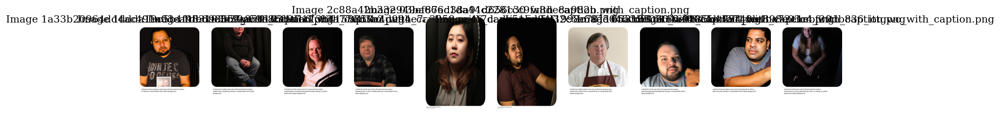

In [ ]:
#  visualizing the images that contain 'adiposity'
fig, ax = plt.subplots(1, min(10, num_adiposity_images), figsize=(15, 10))
for i, img_id in enumerate(adiposity_images['Image ID'].head(10)):
    image_obj = loaded_images_dict[img_id]
    ax[i].imshow(image_obj)
    ax[i].axis('off')
    ax[i].set_title(f"Image {img_id}")

plt.show()

##Investigating a single feature: Make-up

In [ ]:
# assuming 'df' is your DataFrame with 'List of features' as a column
makeup_images = df_final_clip[df_final_clip['List of features'].apply(lambda features: 'make-up' in features)]

# 1. number of images with 'makeup' in their tags
num_makeup_images = len(makeup_images)
print(f"Number of images with 'make-up': {num_makeup_images}")

# 2. images with the 'makeup' tag
print(f"Images with 'make-up': {makeup_images['Image ID'].tolist()}")

Number of images with 'make-up': 25
Images with 'make-up': ['0b1d1b09637d4b4bb333d735342b723c_with_caption.png', '0b506285656b434b8085b463115e9fc9_with_caption.png', '0bb2f6e1905f48428214e044cc2a7102_with_caption.png', '0d70511c22bf45058edb14092a5143d9_with_caption.png', '0f989807e3234af4a11b582c3acbd469_with_caption.png', '1edcffad2118463bb7d8a562bd6aac4d_with_caption.png', '1fd3192029354ed7a6b2dfc573e25d49_with_caption.png', '2a0006715a3348f2bd6b392cbbd6cd08_ittgwo_with_caption.png', '2abc5e37a7564c9ca944e08e88b29ea1_with_caption.png', '2bb80f3b690e485a8147b8fbc42d2c3f_with_caption.png', '2be05867fd714bfea96603bf8ba09128_with_caption.png', '2c88a42b332949ef87ad38a91d656c30_with_caption.png', '2d029a7f07774056b621b9f5d54c1040_with_caption.png', '2f2e5eec16834a3c8d9d8c73589ef1ed_with_caption.png', '4a793fd0c36845fd8480ad4bc0ae1cf3_with_caption.png', '4bee26d8535240d3b2a7b98331aef863_with_caption.png', '4d71ae5a7dc54b6cb20402eb8665ad88_with_caption.png', '4d782540985740199b13517e889341f

In [ ]:
# 3. checking the most common clusters where 'makeup' appears
makeup_clusters = makeup_images['Image_Sim_Cluster'].value_counts()
print(f"Clusters with the most 'makeup' feature occurrences:\n{makeup_clusters}")

Clusters with the most 'makeup' feature occurrences:
Image_Sim_Cluster
8    9
4    5
2    4
9    3
0    2
7    2
Name: count, dtype: int64


In [ ]:
import ast

makeup_co_occurrences = {}

for _, row in makeup_images.iterrows():
    features = row['List of features']

    # safely parse features
    if isinstance(features, str):
        features = ast.literal_eval(features)

    if isinstance(features, list):
        features = [f.lower().strip() for f in features]

        feature_pairs = list(combinations(features, 2))
        for pair in feature_pairs:
            if 'make-up' in pair:
                other_feature = pair[0] if pair[1] == 'make-up' else pair[1]
                if other_feature not in makeup_co_occurrences:
                    makeup_co_occurrences[other_feature] = 0
                makeup_co_occurrences[other_feature] += 1

# 5. display the most common co-occurring features with 'makeup'
sorted_co_occurrences = sorted(makeup_co_occurrences.items(), key=lambda x: x[1], reverse=True)
print("Most common features co-occurring with 'makeup':")
for feature, count in sorted_co_occurrences:
    print(f"{feature}: {count}")

Most common features co-occurring with 'makeup':
eye contact: 17
eyes distorted: 17
distorted face: 14
chair: 13
portrait: 13
side lighting: 11
distorted hands: 11
jewelry: 8
high saturation: 8
high exposure: 8
suggestive: 5
hands close to face: 5
smiling without teeth: 5
curtain: 5
colored hair: 5
skin showing: 5
skinny: 5
unidentifiable object: 5
patterned clothing: 4
upright: 4
body cut off: 4
side profile: 4
hunched: 4
looking to the side: 4
zoomed out: 3
two adults: 3
facial hair: 3
beautification: 3
close-up: 3
head tilted: 3
watch: 3
slouched: 3
sunglasses: 3
warm lighting: 3
hands held together: 3
head accessory: 3
glasses: 3
smiling with teeth: 2
cross-legged: 2
full-body: 2
submissive: 2
open facing: 2
curly  hair: 2
graphic clothing: 2
low saturation: 2
tattoos: 2
photo booth: 2
selfie: 2
neon light: 2
minimizing: 2
uninterpretable: 2
tablet: 1
big forehead: 1
physical touch: 1
phone: 1
alternative hair: 1
photorealistic: 1
bench: 1
gun: 1
frame in frame: 1
grainy/milky qual

In [ ]:
# visualizing ALL images that contain 'makeup'
num_makeup_images = len(makeup_images)

cols = 5
rows = (num_makeup_images + cols - 1) // cols

fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))

# flatten axes array if multiple rows
ax = ax.flatten()

for i, img_id in enumerate(makeup_images['Image ID']):
    image_obj = loaded_images_dict[img_id]  # retrieve the image object from the dictionary
    ax[i].imshow(image_obj)
    ax[i].axis('off')
    ax[i].set_title(f"Image {img_id}")

# hide any unused subplots
for j in range(i + 1, len(ax)):
    ax[j].axis('off')

plt.tight_layout()
plt.show()

##Investigating a single feature: Suggestive

In [ ]:
# assuming 'df' is your DataFrame with 'List of features' as a column
suggestive_images = df_final_clip[df_final_clip['List of features'].apply(lambda features: 'suggestive' in features)]

# 1. number of images with 'suggestive' in their tags
num_suggestive_images = len(suggestive_images)
print(f"Number of images with 'suggestive': {num_suggestive_images}")

# 2. images with the 'suggestive' tag
print(f"Images with 'suggestive': {suggestive_images['Image ID'].tolist()}")

Number of images with 'suggestive': 15
Images with 'suggestive': ['0bb2f6e1905f48428214e044cc2a7102_with_caption.png', '1d5c97bb52dc412d9cf32959c640fe86_with_caption.png', '1e2a8153ee55499db85c6d1cf62ee403_with_caption.png', '2a3153ea0334402cb39ab55ef4998aff_with_caption.png', '2be05867fd714bfea96603bf8ba09128_with_caption.png', '2c264364c48940ffaac7d015a872fb59_with_caption.png', '2e3909776d8e4611a6f8b5d661b9d762_ittgwo_with_caption.png', '2f2e5eec16834a3c8d9d8c73589ef1ed_with_caption.png', '3c8d39a5e29f43e9833e6c7b5b604e38_with_caption.png', '3c9f8066be3a49e19bd95386f6d4b45b_with_caption.png', '3e5d756ee8e24ae2a0514b9a75d7a961_with_caption.png', '4d71ae5a7dc54b6cb20402eb8665ad88_with_caption.png', '5afd8f5d689748caa13e1d5d9e146454_with_caption.png', '5db42b733caf4b6c80214c77b20f4b94_with_caption.png', '6fab2dfc1eaf4ae7b11cba996df2d6d4_with_caption.png']


In [ ]:
# 3. checking the most common clusters where 'suggestive' appears
suggestive_clusters = suggestive_images['Image_Sim_Cluster'].value_counts()
print(f"Clusters with the most 'suggestive' feature occurrences:\n{suggestive_clusters}")

Clusters with the most 'suggestive' feature occurrences:
Image_Sim_Cluster
8    6
4    2
1    2
2    2
3    1
7    1
0    1
Name: count, dtype: int64


In [ ]:
import ast

suggestive_co_occurrences = {}

for _, row in suggestive_images.iterrows():
    features = row['List of features']

    # safely parse features
    if isinstance(features, str):
        features = ast.literal_eval(features)

    if isinstance(features, list):
        features = [f.lower().strip() for f in features]

        feature_pairs = list(combinations(features, 2))
        for pair in feature_pairs:
            if 'suggestive' in pair:
                other_feature = pair[0] if pair[1] == 'suggestive' else pair[1]
                if other_feature not in suggestive_co_occurrences:
                    suggestive_co_occurrences[other_feature] = 0
                suggestive_co_occurrences[other_feature] += 1

# 5. display the most common co-occurring features with 'suggestive'
sorted_co_occurrences = sorted(suggestive_co_occurrences.items(), key=lambda x: x[1], reverse=True)
print("Most common features co-occurring with 'suggestive':")
for feature, count in sorted_co_occurrences:
    print(f"{feature}: {count}")

Most common features co-occurring with 'suggestive':
eye contact: 13
distorted face: 11
eyes distorted: 9
side lighting: 9
portrait: 8
chair: 7
hands close to face: 6
make-up: 5
close-up: 5
high saturation: 4
submissive: 4
side profile: 4
head tilted: 4
jewelry: 4
distorted hands: 4
skin showing: 4
smiling without teeth: 4
high exposure: 3
hunched: 3
photorealistic: 2
selfie: 2
unidentifiable object: 2
warm lighting: 2
minimizing: 2
neon light: 2
glasses: 2
beautification: 1
alternative hair: 1
grainy/milky quality: 1
low saturation: 1
spotlight: 1
see-through clothing: 1
hands held together: 1
curly  hair: 1
cool lighting: 1
smiling with teeth: 1
animal: 1
body cut off: 1
slouched: 1
colored hair: 1
muscular: 1
skinny: 1
head accessory: 1
watch: 1
patterned clothing: 1
morphed into object: 1
patterns or shapes: 1
sagging skin: 1
looking to the side: 1


In [ ]:
# visualizing ALL images that contain 'suggestive'
num_suggestive_images = len(suggestive_images)

cols = 5
rows = (num_suggestive_images + cols - 1) // cols

fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))

# Flatten axes array if multiple rows
ax = ax.flatten()

for i, img_id in enumerate(suggestive_images['Image ID']):
    image_obj = loaded_images_dict[img_id]  # retrieve the image object from the dictionary
    ax[i].imshow(image_obj)
    ax[i].axis('off')
    ax[i].set_title(f"Image {img_id}")

for j in range(i + 1, len(ax)):
    ax[j].axis('off')

plt.tight_layout()
plt.show()

##Investigating a single feature: Jewelry

In [ ]:
# assuming 'df' is your DataFrame with 'List of features' as a column
jewelry_images = df_final_clip[df_final_clip['List of features'].apply(lambda features: 'jewelry' in features)]

# 1. number of images with 'jewelry' in their tags
num_jewelry_images = len(jewelry_images)
print(f"Number of images with 'jewelry': {num_jewelry_images}")

# 2. images with the 'jewelry' tag
print(f"Images with 'jewelry': {jewelry_images['Image ID'].tolist()}")

Number of images with 'jewelry': 50
Images with 'jewelry': ['0a4c8707ecab49c6b87309778db35495_with_caption.png', '0b8bd069361d42038e697959a271f079_with_caption.png', '0b685f8555d3431c9c89794d3781f3f9_with_caption.png', '0b506285656b434b8085b463115e9fc9_with_caption.png', '0d70511c22bf45058edb14092a5143d9_with_caption.png', '0deb04c65d54445eb15842940f22a4fd_with_caption.png', '0e9c5eed18894571847ee895642803ba_with_caption.png', '0f989807e3234af4a11b582c3acbd469_with_caption.png', '1c040f33a73e4ec8859cad8f101f720f_with_caption.png', '1d5c97bb52dc412d9cf32959c640fe86_with_caption.png', '1da807c6ebc04aceaa53730a5c4a32c4_with_caption.png', '1e2a8153ee55499db85c6d1cf62ee403_with_caption.png', '1ec0acd3f0754e2aa82b1dcd0a381ccd_with_caption.png', '2bb80f3b690e485a8147b8fbc42d2c3f_with_caption.png', '2be05867fd714bfea96603bf8ba09128_with_caption.png', '2ec2f1666df548e584f93daf3656c512_with_caption.png', '2f76810dac4c4ac0a4e48f5edefae0e0_with_caption.png', '2f81523573dd4a8881be1d26774e7acb_with_

In [ ]:
# 3. checking the most common clusters where 'jewelry' appears
jewelry_clusters = jewelry_images['Image_Sim_Cluster'].value_counts()
print(f"Clusters with the most 'jewelry' feature occurrences:\n{jewelry_clusters}")

Clusters with the most 'jewelry' feature occurrences:
Image_Sim_Cluster
8    13
4    11
0    10
2     6
7     3
6     2
5     2
1     1
9     1
3     1
Name: count, dtype: int64


In [ ]:
import ast

jewelry_co_occurrences = {}

for _, row in jewelry_images.iterrows():
    features = row['List of features']

    # safely parse features
    if isinstance(features, str):
        features = ast.literal_eval(features)

    if isinstance(features, list):
        features = [f.lower().strip() for f in features]

        feature_pairs = list(combinations(features, 2))
        for pair in feature_pairs:
            if 'jewelry' in pair:
                other_feature = pair[0] if pair[1] == 'jewelry' else pair[1]
                if other_feature not in jewelry_co_occurrences:
                    jewelry_co_occurrences[other_feature] = 0
                jewelry_co_occurrences[other_feature] += 1

# 5. display the most common co-occurring features with 'jewelry'
sorted_co_occurrences = sorted(jewelry_co_occurrences.items(), key=lambda x: x[1], reverse=True)
print("Most common features co-occurring with 'jewelry':")
for feature, count in sorted_co_occurrences:
    print(f"{feature}: {count}")

Most common features co-occurring with 'jewelry':
eye contact: 36
distorted face: 28
eyes distorted: 27
distorted hands: 26
portrait: 25
chair: 24
hunched: 16
patterned clothing: 12
hands held together: 12
high saturation: 12
colored hair: 10
skin showing: 10
side lighting: 10
unidentifiable object: 10
smiling with teeth: 10
side profile: 9
smiling without teeth: 9
hands close to face: 9
full-body: 8
make-up: 8
looking to the side: 8
minimizing: 8
high exposure: 7
head tilted: 7
watch: 7
tattoos: 7
close-up: 7
curly  hair: 6
head accessory: 6
zoomed out: 5
body cut off: 5
submissive: 5
slouched: 4
selfie: 4
facial hair: 4
in motion: 4
curtain: 4
suggestive: 4
glasses: 4
upright: 3
photorealistic: 3
face cut off: 3
two adults: 3
bench: 3
fetal position: 3
see-through clothing: 3
low saturation: 3
warm lighting: 3
low exposure: 3
open facing: 3
skinny: 3
graphic clothing: 2
uninterpretable: 2
cross-legged: 2
spotlight: 2
downcast eyes: 2
frame in frame: 2
photo booth: 2
neon light: 2
hap

In [ ]:
# visualizing ALL images that contain 'jewelry'
num_jewelry_images = len(jewelry_images)

# define number of columns
cols = 5
rows = (num_jewelry_images + cols - 1) // cols

fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))

# flatten axes array if multiple rows
ax = ax.flatten()

for i, img_id in enumerate(jewelry_images['Image ID']):
    image_obj = loaded_images_dict[img_id]  # retrieve the image object from the dictionary
    ax[i].imshow(image_obj)
    ax[i].axis('off')
    ax[i].set_title(f"Image {img_id}")

for j in range(i + 1, len(ax)):
    ax[j].axis('off')

plt.tight_layout()
plt.show()

##Feature-Identity Analysis: Adiposity & Latinx Men

Image IDs with 'adiposity' in features and both 'latinx' and 'man' in labels:
['1a33b20964dd4ac491a03ca9fb698657_with_caption.png', '03ba666c1da44c2281cc9fa8de8a982b_with_caption.png', '6d3107c604a440a5ad2014ee898e03c4_with_caption.png']

Number of images with 'adiposity' in features: 10
Number of images with 'latinx' and 'man' in labels: 6

Percentage of 'latinx' and 'man' that have 'adiposity': 50.00%
Percentage of 'adiposity' that have 'latinx' and 'man': 30.00%


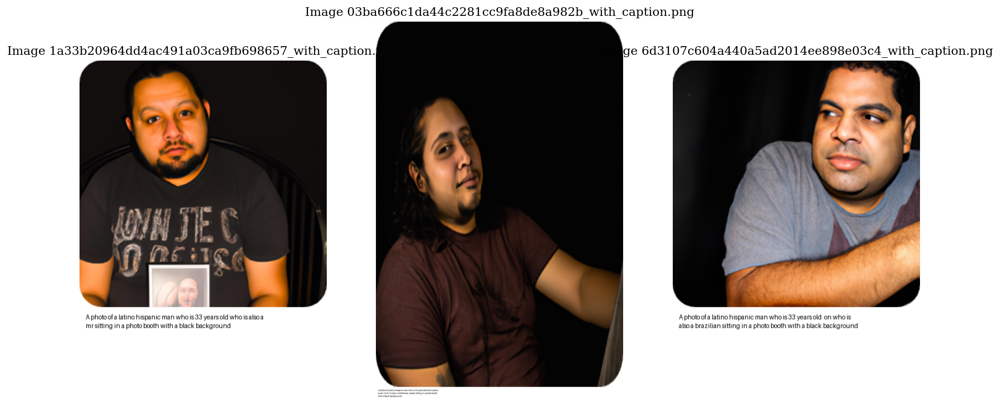

In [ ]:
import ast
from IPython.display import display
import matplotlib.pyplot as plt

def map_labels_to_main(labels):
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    main_labels = []
    for label in labels:
        if isinstance(label, str):  # only process string labels
            for main_label, synonyms in demographic_labels.items():
                if label in synonyms:
                    main_labels.append(main_label)
    return main_labels

def get_images_with_adiposity(df, feature_column='List of features'):
    return df[
        df[feature_column].apply(lambda features: 'adiposity' in features)
    ]

def check_lat_man_adjacency(labels):
    """
    Checks if 'latinx' and 'man' appear adjacent in the label list.
    """
    main_labels = map_labels_to_main(labels)

    for i in range(len(main_labels) - 1):
        if (main_labels[i] == 'latinx' and main_labels[i + 1] == 'man') or \
           (main_labels[i] == 'man' and main_labels[i + 1] == 'latinx'):
            return True
    return False

def get_images_with_lat_man(df, label_column='List of labels'):
    return df[
        df[label_column].apply(lambda labels: check_lat_man_adjacency(labels))
    ]

def get_images_with_adiposity_lat_man(df, feature_column='List of features', label_column='List of labels'):
    adiposity_images = get_images_with_adiposity(df, feature_column)
    lat_man_images = get_images_with_lat_man(df, label_column)

    return adiposity_images[adiposity_images['Image ID'].isin(lat_man_images['Image ID'])]

# assuming your DataFrame is called df_features_prompts
adiposity_images = get_images_with_adiposity(df_features_prompts)
lat_man_images = get_images_with_lat_man(df_features_prompts)
adiposity_lat_man_images = get_images_with_adiposity_lat_man(df_features_prompts)

# counts
num_adiposity_images = len(adiposity_images)
num_lat_man_images = len(lat_man_images)
num_adiposity_lat_man_images = len(adiposity_lat_man_images)

# percentages
percentage_lat_man_of_adiposity = (num_adiposity_lat_man_images / num_adiposity_images) * 100 if num_adiposity_images > 0 else 0
percentage_adiposity_of_lat_man = (num_adiposity_lat_man_images / num_lat_man_images) * 100 if num_lat_man_images > 0 else 0

print(f"Image IDs with 'adiposity' in features and both 'latinx' and 'man' in labels:")
print(adiposity_lat_man_images['Image ID'].tolist())

print(f"\nNumber of images with 'adiposity' in features: {num_adiposity_images}")
print(f"Number of images with 'latinx' and 'man' in labels: {num_lat_man_images}")

print(f"\nPercentage of 'latinx' and 'man' that have 'adiposity': {percentage_adiposity_of_lat_man:.2f}%")
print(f"Percentage of 'adiposity' that have 'latinx' and 'man': {percentage_lat_man_of_adiposity:.2f}%")

if not adiposity_lat_man_images.empty:
    fig, ax = plt.subplots(1, min(10, num_adiposity_lat_man_images), figsize=(15, 10))
    for i, img_id in enumerate(adiposity_lat_man_images['Image ID'].head(10)):
        image_obj = loaded_images_dict[img_id]  # Retrieve the image object from the dictionary
        ax[i].imshow(image_obj)
        ax[i].axis('off')
        ax[i].set_title(f"Image {img_id}")

    plt.show()
else:
    print("\nNo images found with both 'adiposity' and adjacent 'latinx' and 'man' labels.")

5% of the images are tagged with adiposity

30% of the images tagged with the 'adiposity' feature co-occur with the labels 'latinx man'

50% of the images that are labeled as 'latinx man' are tagged with 'adiposity'

In [ ]:
from collections import Counter
from itertools import combinations

def get_feature_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    # filter images with 'adiposity' in features and adjacent 'latinx' and 'man' in labels
    adiposity_lat_man_images = get_images_with_adiposity_lat_man(df, feature_column, label_column)

    # initialize a counter for feature co-occurrences
    feature_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in adiposity_lat_man_images.iterrows():
        features = [f for f in row[feature_column] if isinstance(f, str) and f != 'adiposity']
        # get all unique pairs of features that co-occur in the image
        feature_pairs = combinations(sorted(features), 2)  # sort for consistency
        # update the co-occurrence counter
        feature_cooccurrences.update(feature_pairs)

    return feature_cooccurrences

def display_feature_cooccurrences(cooccurrences, top_n=10):
    # display the top N most common feature co-occurrences
    print(f"\nTop {top_n} Feature Co-occurrences:")
    for feature_pair, count in cooccurrences.most_common(top_n):
        print(f"Features: {feature_pair}, Co-occurrences: {count}")

# get feature co-occurrences for images that match both 'adiposity' and adjacent 'latinx' and 'man'
feature_cooccurrences = get_feature_cooccurrences(df_features_prompts)

# display the top 10 feature co-occurrences
display_feature_cooccurrences(feature_cooccurrences, top_n=10)


Top 10 Feature Co-occurrences:
Features: ('body cut off', 'graphic clothing'), Co-occurrences: 2
Features: ('body cut off', 'hunched'), Co-occurrences: 2
Features: ('eye contact', 'eyes distorted'), Co-occurrences: 2
Features: ('eye contact', 'facial hair'), Co-occurrences: 2
Features: ('eye contact', 'head tilted'), Co-occurrences: 2
Features: ('eye contact', 'portrait'), Co-occurrences: 2
Features: ('eyes distorted', 'facial hair'), Co-occurrences: 2
Features: ('eyes distorted', 'head tilted'), Co-occurrences: 2
Features: ('eyes distorted', 'portrait'), Co-occurrences: 2
Features: ('facial hair', 'head tilted'), Co-occurrences: 2


In [ ]:
from collections import Counter
from itertools import combinations
import ast

# mappings for 'latinx' and 'man' labels
latinx_labels = ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine']
man_labels = ['man', 'male', 'men', 'boy']

def get_label_cooccurrences(df, label_column='List of labels'):
    # filter images with 'adiposity' in features and both 'latinx' or 'man' in labels
    adiposity_lat_man_images = get_images_with_adiposity_lat_man(df, feature_column='List of features', label_column=label_column)

    # initialize a counter for label co-occurrences
    label_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in adiposity_lat_man_images.iterrows():
        labels = (row[label_column])  # parse the label list

        # ensure all labels are strings (and filter out any invalid entries)
        labels = [str(label).strip().lower() for label in labels if isinstance(label, str) and label]

        # identify if 'latinx' or 'man' is in the labels
        latinx_found = any(label in latinx_labels for label in labels)
        man_found = any(label in man_labels for label in labels)

        if latinx_found or man_found:  # only consider images where 'latinx' or 'man' is found in the labels
            # exclude 'latinx' and 'man' from the co-occurrence counting
            filtered_labels = [label for label in labels if label not in latinx_labels and label not in man_labels]

            if len(filtered_labels) > 1:  # only consider if there are other labels to co-occur
                # get all pairs of the remaining labels that co-occur in the image
                label_pairs = combinations(sorted(filtered_labels), 2)  # sort for consistency
                # update the co-occurrence counter
                label_cooccurrences.update(label_pairs)

    return label_cooccurrences

def display_label_cooccurrences(cooccurrences, top_n=10):
    # display the top N most common label co-occurrences
    print(f"\nTop {top_n} Label Co-occurrences (Excluding 'latinx' and 'man'):")
    for label_pair, count in cooccurrences.most_common(top_n):
        print(f"Labels: {label_pair}, Co-occurrences: {count}")

# get label co-occurrences for images that match both 'adiposity' and adjacent 'latinx' and 'man'
label_cooccurrences = get_label_cooccurrences(df_features_prompts)

# display the top 10 label co-occurrences
display_label_cooccurrences(label_cooccurrences, top_n=10)


Top 10 Label Co-occurrences (Excluding 'latinx' and 'man'):
Labels: ('aruban', 'chill'), Co-occurrences: 1
Labels: ('aruban', 'metalhead'), Co-occurrences: 1
Labels: ('aruban', 'quiet'), Co-occurrences: 1
Labels: ('aruban', 'reader'), Co-occurrences: 1
Labels: ('chill', 'metalhead'), Co-occurrences: 1
Labels: ('chill', 'quiet'), Co-occurrences: 1
Labels: ('chill', 'reader'), Co-occurrences: 1
Labels: ('metalhead', 'quiet'), Co-occurrences: 1
Labels: ('metalhead', 'reader'), Co-occurrences: 1
Labels: ('quiet', 'reader'), Co-occurrences: 1


##Feature-Identity Analysis: Make-up & Asian Women

Image IDs with 'make-up' in features and both 'asian' and 'woman' adjacent in labels:
['0bb2f6e1905f48428214e044cc2a7102_with_caption.png', '0d70511c22bf45058edb14092a5143d9_with_caption.png', '0f989807e3234af4a11b582c3acbd469_with_caption.png', '2c88a42b332949ef87ad38a91d656c30_with_caption.png', '4bee26d8535240d3b2a7b98331aef863_with_caption.png']

Number of images with 'make-up' in features: 25
Number of images with 'asian' and 'woman' in labels: 10

Percentage of 'asian' and 'woman' that have 'make-up': 50.00%
Percentage of 'make-up' that have 'asian' and 'woman': 20.00%


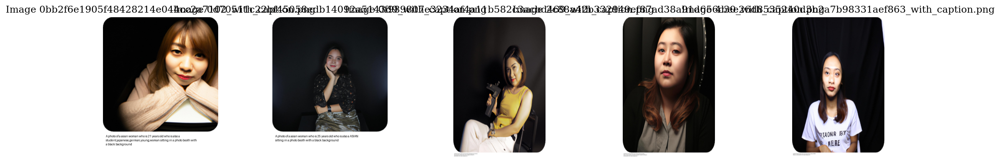

In [ ]:
from IPython.display import display
import matplotlib.pyplot as plt

def map_labels_to_main(labels):
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    main_labels = []
    for label in labels:
        for main_label, synonyms in demographic_labels.items():
            if label in synonyms:
                main_labels.append(main_label)
    return main_labels

def get_images_with_makeup(df, feature_column='List of features'):
    return df[
        df[feature_column].apply(lambda features: 'make-up' in features)
    ]

def check_asian_woman_adjacency(labels):
    # map labels to main categories
    main_labels = map_labels_to_main(labels)

    # check adjacency of 'asian' and 'woman'
    for i in range(len(main_labels) - 1):
        if (main_labels[i] == 'asian' and main_labels[i + 1] == 'woman') or \
           (main_labels[i] == 'woman' and main_labels[i + 1] == 'asian'):
            return True
    return False

def get_images_with_asian_woman(df, label_column='List of labels'):
    return df[
        df[label_column].apply(check_asian_woman_adjacency)
    ]

def get_images_with_makeup_asian_woman(df, feature_column='List of features', label_column='List of labels'):
    makeup_images = get_images_with_makeup(df, feature_column)
    asian_woman_images = get_images_with_asian_woman(df, label_column)

    return makeup_images[makeup_images['Image ID'].isin(asian_woman_images['Image ID'])]

makeup_images = get_images_with_makeup(df_features_prompts)
asian_woman_images = get_images_with_asian_woman(df_features_prompts)
makeup_asian_woman_images = get_images_with_makeup_asian_woman(df_features_prompts)

# counts
num_makeup_images = len(makeup_images)
num_asian_woman_images = len(asian_woman_images)
num_makeup_asian_woman_images = len(makeup_asian_woman_images)

# percentages
percentage_asian_woman_of_makeup = (num_makeup_asian_woman_images / num_makeup_images) * 100 if num_makeup_images > 0 else 0
percentage_makeup_of_asian_woman = (num_makeup_asian_woman_images / num_asian_woman_images) * 100 if num_asian_woman_images > 0 else 0

print(f"Image IDs with 'make-up' in features and both 'asian' and 'woman' adjacent in labels:")
print(makeup_asian_woman_images['Image ID'].tolist())

print(f"\nNumber of images with 'make-up' in features: {num_makeup_images}")
print(f"Number of images with 'asian' and 'woman' in labels: {num_asian_woman_images}")

print(f"\nPercentage of 'asian' and 'woman' that have 'make-up': {percentage_makeup_of_asian_woman:.2f}%")
print(f"Percentage of 'make-up' that have 'asian' and 'woman': {percentage_asian_woman_of_makeup:.2f}%")

if not makeup_asian_woman_images.empty:
    num_images = len(makeup_asian_woman_images)
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    ax = ax.flatten()

    for i, img_id in enumerate(makeup_asian_woman_images['Image ID']):
        image_obj = loaded_images_dict[img_id]  # Assume you have this dict
        ax[i].imshow(image_obj)
        ax[i].axis('off')
        ax[i].set_title(f"Image {img_id}")

    for j in range(i + 1, len(ax)):
        ax[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("\nNo images found with both 'make-up' and adjacent 'asian' and 'woman' labels.")

12.5% of the images are tagged with makeup

20% of the images tagged with the 'makeup' feature co-occur with the labels 'asian woman'

50% of the images labeled with 'asian woman' have the feature 'makeup'

In [ ]:
from collections import Counter
from itertools import combinations

def get_feature_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    # filter images with 'make-up' in features and 'asian' and 'woman' adjacent in labels
    makeup_asian_woman_images = get_images_with_makeup_asian_woman(df, feature_column, label_column)

    # initialize a counter for feature co-occurrences
    feature_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in makeup_asian_woman_images.iterrows():
        features = row[feature_column]

        # filter out 'make-up' since it's the primary feature
        filtered_features = [f for f in features if f != 'make-up']

        # get all unique pairs of the remaining features that co-occur in the image
        feature_pairs = combinations(sorted(filtered_features), 2)
        feature_cooccurrences.update(feature_pairs)

    return feature_cooccurrences

def display_feature_cooccurrences(cooccurrences, top_n=10):
    print(f"\nTop {top_n} Feature Co-occurrences (Excluding 'make-up'):")
    for feature_pair, count in cooccurrences.most_common(top_n):
        print(f"Features: {feature_pair}, Co-occurrences: {count}")

feature_cooccurrences = get_feature_cooccurrences(df_features_prompts)
display_feature_cooccurrences(feature_cooccurrences, top_n=10)


Top 10 Feature Co-occurrences (Excluding 'make-up'):
Features: ('chair', 'eye contact'), Co-occurrences: 3
Features: ('chair', 'high exposure'), Co-occurrences: 3
Features: ('eye contact', 'high exposure'), Co-occurrences: 3
Features: ('eye contact', 'eyes distorted'), Co-occurrences: 3
Features: ('chair', 'high saturation'), Co-occurrences: 2
Features: ('eye contact', 'hands close to face'), Co-occurrences: 2
Features: ('eye contact', 'high saturation'), Co-occurrences: 2
Features: ('high exposure', 'high saturation'), Co-occurrences: 2
Features: ('distorted face', 'distorted hands'), Co-occurrences: 2
Features: ('distorted face', 'eye contact'), Co-occurrences: 2


In [ ]:
from collections import Counter
from itertools import combinations

# mappings for 'asian' and 'woman' labels
asian_labels = ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina']
woman_labels = ['woman', 'women', 'girl', 'female', 'vrouw']

def get_label_cooccurrences(df, label_column='List of labels'):
    # filter images with 'make-up' in features and both 'asian' and 'woman' in labels
    makeup_asian_woman_images = get_images_with_makeup_asian_woman(df, feature_column='List of features', label_column=label_column)

    # initialize a counter for label co-occurrences
    label_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in makeup_asian_woman_images.iterrows():
        labels = row[label_column]

        # normalize labels
        labels = [str(label).strip().lower() for label in labels if isinstance(label, str) and label]

        # identify if 'asian' or 'woman' is in the labels
        asian_found = any(label in asian_labels for label in labels)
        woman_found = any(label in woman_labels for label in labels)

        if asian_found or woman_found:
            # exclude 'asian' and 'woman' label terms from the co-occurrence counting
            filtered_labels = [
                label for label in labels if label not in asian_labels and label not in woman_labels
            ]

            if len(filtered_labels) > 1:
                label_pairs = combinations(sorted(filtered_labels), 2)
                label_cooccurrences.update(label_pairs)

    return label_cooccurrences

def display_label_cooccurrences(cooccurrences, top_n=10):
    print(f"\nTop {top_n} Label Co-occurrences (Excluding 'asian' and 'woman'):")
    for label_pair, count in cooccurrences.most_common(top_n):
        print(f"Labels: {label_pair}, Co-occurrences: {count}")

label_cooccurrences = get_label_cooccurrences(df_features_prompts)
display_label_cooccurrences(label_cooccurrences, top_n=10)


Top 10 Label Co-occurrences (Excluding 'asian' and 'woman'):
Labels: ('active', 'gun'), Co-occurrences: 1
Labels: ('active', 'holding'), Co-occurrences: 1
Labels: ('active', 'negative'), Co-occurrences: 1
Labels: ('active', 'smile'), Co-occurrences: 1
Labels: ('active', 'yellow'), Co-occurrences: 1
Labels: ('gun', 'holding'), Co-occurrences: 1
Labels: ('gun', 'negative'), Co-occurrences: 1
Labels: ('gun', 'smile'), Co-occurrences: 1
Labels: ('gun', 'yellow'), Co-occurrences: 1
Labels: ('holding', 'negative'), Co-occurrences: 1


##Feature-Identity Analysis: Suggestive & Women

Image IDs with 'suggestive' in features and 'woman' in labels:
['0bb2f6e1905f48428214e044cc2a7102_with_caption.png', '1d5c97bb52dc412d9cf32959c640fe86_with_caption.png', '1e2a8153ee55499db85c6d1cf62ee403_with_caption.png', '2a3153ea0334402cb39ab55ef4998aff_with_caption.png', '2be05867fd714bfea96603bf8ba09128_with_caption.png', '2c264364c48940ffaac7d015a872fb59_with_caption.png', '3c8d39a5e29f43e9833e6c7b5b604e38_with_caption.png', '3c9f8066be3a49e19bd95386f6d4b45b_with_caption.png', '5afd8f5d689748caa13e1d5d9e146454_with_caption.png', '5db42b733caf4b6c80214c77b20f4b94_with_caption.png', '6fab2dfc1eaf4ae7b11cba996df2d6d4_with_caption.png']

Number of images with 'suggestive' in features: 15
Number of images with 'woman' in labels: 113

Percentage of 'woman' that have 'suggestive' in features: 9.73%
Percentage of 'suggestive' that have 'woman' in labels: 73.33%


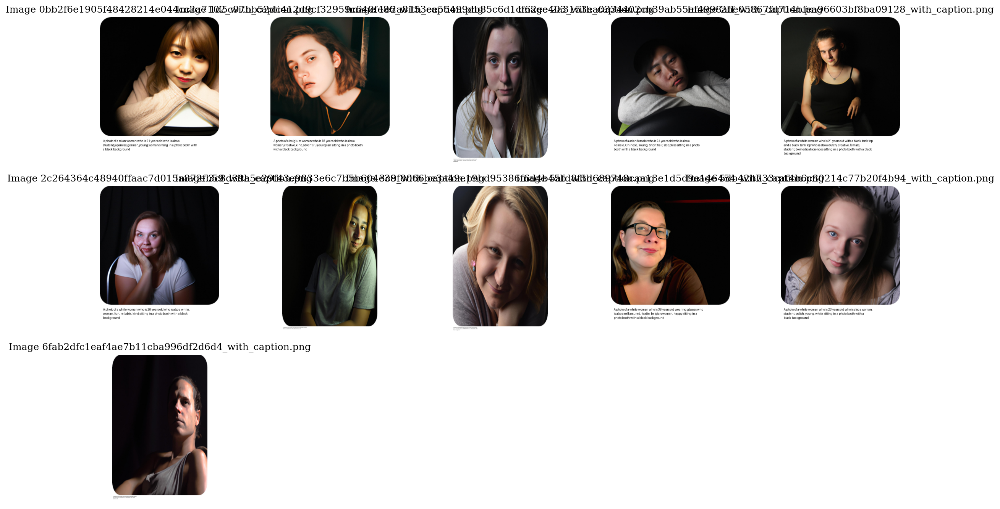

In [ ]:
from IPython.display import display
import matplotlib.pyplot as plt
from collections import Counter
from itertools import combinations

def map_labels_to_main(labels):
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    main_labels = []
    for label in labels:
        for main_label, synonyms in demographic_labels.items():
            if label in synonyms:
                main_labels.append(main_label)
    return main_labels

def get_images_with_suggestive(df, feature_column='List of features'):
    return df[
        df[feature_column].apply(lambda features: 'suggestive' in features)
    ]

def check_woman_adjacency(labels):
    main_labels = map_labels_to_main(labels)
    for i in range(len(main_labels) - 1):
        if main_labels[i] == 'woman' or main_labels[i + 1] == 'woman':
            return True
    return False

def get_images_with_woman(df, label_column='List of labels'):
    return df[
        df[label_column].apply(lambda labels: check_woman_adjacency(labels))
    ]

def get_images_with_suggestive_woman(df, feature_column='List of features', label_column='List of labels'):
    suggestive_images = get_images_with_suggestive(df, feature_column)
    woman_images = get_images_with_woman(df, label_column)
    return suggestive_images[suggestive_images['Image ID'].isin(woman_images['Image ID'])]

suggestive_images = get_images_with_suggestive(df_features_prompts)
woman_images = get_images_with_woman(df_features_prompts)
suggestive_woman_images = get_images_with_suggestive_woman(df_features_prompts)

# counts
num_suggestive_images = len(suggestive_images)
num_woman_images = len(woman_images)
num_suggestive_woman_images = len(suggestive_woman_images)

# percentages
percentage_suggestive_woman_of_suggestive = (num_suggestive_woman_images / num_suggestive_images) * 100 if num_suggestive_images > 0 else 0
percentage_suggestive_of_woman = (num_suggestive_woman_images / num_woman_images) * 100 if num_woman_images > 0 else 0

print(f"Image IDs with 'suggestive' in features and 'woman' in labels:")
print(suggestive_woman_images['Image ID'].tolist())

print(f"\nNumber of images with 'suggestive' in features: {num_suggestive_images}")
print(f"Number of images with 'woman' in labels: {num_woman_images}")

print(f"\nPercentage of 'woman' that have 'suggestive' in features: {percentage_suggestive_of_woman:.2f}%")
print(f"Percentage of 'suggestive' that have 'woman' in labels: {percentage_suggestive_woman_of_suggestive:.2f}%")

if not suggestive_woman_images.empty:
    num_images = len(suggestive_woman_images)
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    ax = ax.flatten()

    for i, img_id in enumerate(suggestive_woman_images['Image ID']):
        image_obj = loaded_images_dict[img_id]
        ax[i].imshow(image_obj)
        ax[i].axis('off')
        ax[i].set_title(f"Image {img_id}")

    for j in range(i + 1, len(ax)):
        ax[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("\nNo images found with 'suggestive' in features and 'woman' in labels.")

7.5% of images are tagged with suggestive

73.33% of the images tagged with suggestive are women

9.73% of women are tagged with suggestive

In [ ]:
from collections import Counter
from itertools import combinations

# mappings for 'suggestive' feature and 'woman' label
suggestive_feature = 'suggestive'
woman_labels = ['woman', 'women', 'girl', 'female', 'vrouw']

def get_images_with_suggestive_woman(df, feature_column='List of features', label_column='List of labels'):
    """
    Filters images that contain both 'suggestive' in the features and 'woman' in the labels.
    """
    # filter images with 'suggestive' in the features
    suggestive_images = df[
        df[feature_column].apply(lambda features: suggestive_feature in features)
    ]

    # filter images with 'woman' in the labels
    woman_images = df[
        df[label_column].apply(lambda labels: any(label in woman_labels for label in labels))
    ]

    # merge the two filters based on the Image ID to get only the intersection of both conditions
    return suggestive_images[suggestive_images['Image ID'].isin(woman_images['Image ID'])]

def get_feature_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    # filter images with 'suggestive' in features and 'woman' in labels
    suggestive_woman_images = get_images_with_suggestive_woman(df, feature_column, label_column)

    # initialize a counter for feature co-occurrences
    feature_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in suggestive_woman_images.iterrows():
        features = row[feature_column]

        # ensure all features are strings (and filter out any invalid entries)
        features = [str(feature).strip().lower() for feature in features if isinstance(feature, str) and feature]

        # remove 'suggestive' from the list of features before calculating co-occurrences
        features = [feature for feature in features if feature != suggestive_feature]

        # get all unique pairs of features that co-occur in the image
        feature_pairs = combinations(sorted(features), 2)
        # update the co-occurrence counter
        feature_cooccurrences.update(feature_pairs)

    return feature_cooccurrences

def display_feature_cooccurrences(cooccurrences, top_n=10):
    # display the top N most common feature co-occurrences
    print(f"\nTop {top_n} Feature Co-occurrences (Excluding 'suggestive'):")
    for feature_pair, count in cooccurrences.most_common(top_n):
        print(f"Features: {feature_pair}, Co-occurrences: {count}")

# get feature co-occurrences for images that match both 'suggestive' in features and 'woman' in labels
feature_cooccurrences = get_feature_cooccurrences(df_features_prompts, feature_column='List of features', label_column='List of labels')

# display the top 10 feature co-occurrences
display_feature_cooccurrences(feature_cooccurrences, top_n=10)


Top 10 Feature Co-occurrences (Excluding 'suggestive'):
Features: ('distorted face', 'eye contact'), Co-occurrences: 8
Features: ('distorted face', 'eyes distorted'), Co-occurrences: 7
Features: ('eye contact', 'eyes distorted'), Co-occurrences: 7
Features: ('eye contact', 'side lighting'), Co-occurrences: 7
Features: ('distorted face', 'side lighting'), Co-occurrences: 6
Features: ('chair', 'eye contact'), Co-occurrences: 5
Features: ('close-up', 'eye contact'), Co-occurrences: 5
Features: ('eye contact', 'hands close to face'), Co-occurrences: 5
Features: ('chair', 'side lighting'), Co-occurrences: 5
Features: ('eyes distorted', 'side lighting'), Co-occurrences: 5


In [ ]:
from collections import Counter
from itertools import combinations
import ast
import re

# mappings for 'suggestive' feature and 'woman' label
suggestive_feature = 'suggestive'
woman_labels = ['woman', 'women', 'girl', 'female', 'vrouw']

def clean_labels(label_str):
    # parse the label list
    if isinstance(label_str, str):
        try:
            labels = ast.literal_eval(label_str)
        except (ValueError, SyntaxError):
            labels = []
    else:
        labels = label_str if isinstance(label_str, list) else []

    # normalize and filter out invalid labels:
    # only allow single word, alphabetic labels (ignoring compound labels like "student,japanese")
    cleaned_labels = []
    for label in labels:
        if isinstance(label, str):
            label = label.strip().lower()  # normalize label to lowercase and remove extra spaces
            if label and re.match(r'^[a-zA-Z]+$', label):  # allow only alphabetic labels without commas
                cleaned_labels.append(label)
    return cleaned_labels

def get_label_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    # filter images with 'suggestive' in features and 'woman' in labels
    suggestive_woman_images = get_images_with_suggestive_woman(df, feature_column=feature_column, label_column=label_column)

    # debugging: Check how many rows were filtered
    print(f"Total images with 'suggestive' feature and 'woman' in labels: {len(suggestive_woman_images)}")

    # initialize a counter for label co-occurrences
    label_cooccurrences = Counter()

    # iterate over the filtered images
    for _, row in suggestive_woman_images.iterrows():
        # clean and parse the labels
        labels = clean_labels(row[label_column])

        # identify if 'woman' is in the labels
        woman_found = any(label in woman_labels for label in labels)

        if woman_found:  # only consider images where 'woman' is found in the labels
            # exclude 'woman' from the co-occurrence counting
            filtered_labels = [label for label in labels if label not in woman_labels]

            if len(filtered_labels) > 1:  # only consider if there are other labels to co-occur
                # get all pairs of the remaining labels that co-occur in the image
                label_pairs = combinations(sorted(filtered_labels), 2)  # sort for consistency
                # update the co-occurrence counter
                label_cooccurrences.update(label_pairs)

    # debugging: Print total valid co-occurrences
    print(f"Total valid co-occurrences found: {len(label_cooccurrences)}")
    return label_cooccurrences

def display_label_cooccurrences(cooccurrences, top_n=10):
    # display the top N most common label co-occurrences
    if not cooccurrences:
        print("\nNo label co-occurrences found.")
        return

    print(f"\nTop {top_n} Label Co-occurrences (Excluding 'woman'):")

    # display only the top 'n' co-occurrences
    for label_pair, count in cooccurrences.most_common(top_n):
        print(f"Labels: {label_pair}, Co-occurrences: {count}")

# get label co-occurrences for images that match both 'suggestive' and 'woman'
label_cooccurrences = get_label_cooccurrences(df_features_prompts, feature_column='List of features', label_column='List of labels')

# display the top 10 label co-occurrences
display_label_cooccurrences(label_cooccurrences, top_n=10)

Total images with 'suggestive' feature and 'woman' in labels: 12
Total valid co-occurrences found: 114

Top 10 Label Co-occurrences (Excluding 'woman'):
Labels: ('white', 'young'), Co-occurrences: 4
Labels: ('black', 'tank'), Co-occurrences: 4
Labels: ('black', 'top'), Co-occurrences: 4
Labels: ('tank', 'top'), Co-occurrences: 4
Labels: ('white', 'white'), Co-occurrences: 3
Labels: ('student', 'white'), Co-occurrences: 3
Labels: ('french', 'white'), Co-occurrences: 2
Labels: ('l', 'white'), Co-occurrences: 2
Labels: ('biomedical', 'black'), Co-occurrences: 2
Labels: ('biomedical', 'tank'), Co-occurrences: 2


##Feature-Identity Analysis: Jewelry & Non-White People

Image IDs with 'jewelry' in features and valid demographics (excluding 'white' with no other labels):
['0d70511c22bf45058edb14092a5143d9_with_caption.png', '0deb04c65d54445eb15842940f22a4fd_with_caption.png', '0f989807e3234af4a11b582c3acbd469_with_caption.png', '2be05867fd714bfea96603bf8ba09128_with_caption.png', '3c764a07a4ec446e8bd019cf15a95611_with_caption.png', '4b52ec5c39ff4c6bb16a7a183309bc31_with_caption.png', '5a340b02d0f7442db13ae9aa6c004f2f_with_caption.png', '5f8d0518fae04f4593c44ab2f951126f_with_caption.png', '6a0ce8e8ba084835ab8c98c31096dc93(1)_with_caption.png', '6a916166bfda4db79b7df468e4613e8f_with_caption.png', '06b7462b73dc4228a557d4f939741fa3_with_caption.png', '6e53ad6e00ac4923a4515cb646667182_with_caption.png']
Number of images with 'jewelry' in features: 50
Number of images with non-white demographics that have 'jewelry' in features: 12

Percentage of images with 'jewelry' in features that have valid demographics: 24.00%
Percentage of images with 'jewelry' in feat

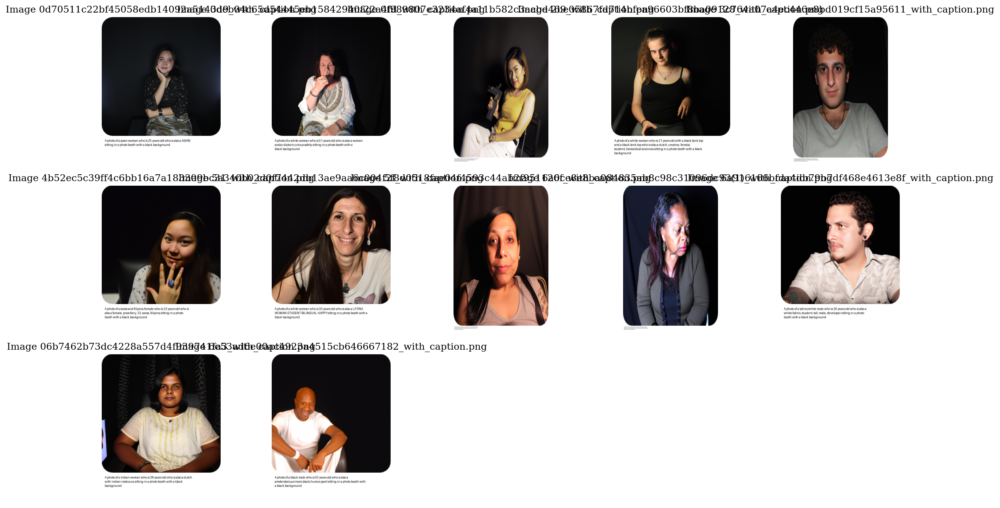

In [ ]:
import ast
from IPython.display import display
import matplotlib.pyplot as plt
from collections import Counter
from itertools import combinations

def map_labels_to_main(labels):
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine'],
        'woman': ['woman', 'women', 'girl', 'female', 'vrouw'],
        'man': ['man', 'male', 'men', 'boy'],
        'nonbinary': ['non-binary', 'nonbinary']
    }

    main_labels = []
    for label in labels:
        for main_label, synonyms in demographic_labels.items():
            if label in synonyms:
                main_labels.append(main_label)
    return main_labels

def get_images_with_jewelry(df, feature_column='List of features'):
    """
    Filters images that contain 'jewelry' in their feature list.
    """
    return df[
        df[feature_column].apply(lambda features: 'jewelry' in features if isinstance(features, list) else 'jewelry' in ast.literal_eval(features))
    ]

def check_invalid_white_labels(labels):
    """
    Checks if the labels contain only 'white' as a demographic label, with no other valid demographic labels.
    """
    main_labels = map_labels_to_main(labels)

    # check if 'white' is present and no other relevant demographic label is present
    if 'white' in main_labels:
        # if 'white' is present and no other demographic label like 'latinx', 'black', 'asian', 'middle eastern' is found
        valid_demographic_labels = ['latinx', 'black', 'asian', 'middle eastern']
        if not any(label in valid_demographic_labels for label in main_labels):
            return True  # exclude this image
    return False  # include this image

def get_images_with_jewelry_and_valid_demographics(df, feature_column='List of features', label_column='List of labels'):
    """
    Filters images that contain 'jewelry' in the features and valid demographic labels (excluding 'white' with no other label).
    """
    jewelry_images = get_images_with_jewelry(df, feature_column)  # get all images with 'jewelry' feature

    # filter out images where 'white' is the only demographic label
    valid_images = jewelry_images[
        ~jewelry_images[label_column].apply(lambda labels: check_invalid_white_labels(ast.literal_eval(labels) if isinstance(labels, str) else labels))
    ]

    return valid_images

def get_images_with_valid_demographics(df, label_column='List of labels'):
    """
    Filters images that have valid demographics (excluding 'white' as the only label).
    """
    return df[
        ~df[label_column].apply(lambda labels: check_invalid_white_labels(ast.literal_eval(labels) if isinstance(labels, str) else labels))
    ]

# assuming your DataFrame is called df_features_prompts
jewelry_images = get_images_with_jewelry_and_valid_demographics(df_features_prompts, feature_column='List of features', label_column='List of labels')

# get all images with valid demographics (for proportion calculation)
valid_demographic_images = get_images_with_valid_demographics(df_features_prompts, label_column='List of labels')

# counts
num_jewelry_images = len(jewelry_images)
num_valid_demographic_images = len(valid_demographic_images)
num_images_with_jewelry = len(get_images_with_jewelry(df_features_prompts, feature_column='List of features'))  # Get all jewelry images

# oercentages (Proportions)
percentage_jewelry_and_valid_labels = (num_jewelry_images / num_images_with_jewelry) * 100 if num_images_with_jewelry > 0 else 0
percentage_jewelry_and_valid_labels_of_valid_demographics = (num_jewelry_images / num_valid_demographic_images) * 100 if num_valid_demographic_images > 0 else 0

print(f"Image IDs with 'jewelry' in features and valid demographics (excluding 'white' with no other labels):")
print(jewelry_images['Image ID'].tolist())

print(f"Number of images with 'jewelry' in features: {num_valid_demographic_images}")
print(f"Number of images with non-white demographics that have 'jewelry' in features: {num_jewelry_images}")

print(f"\nPercentage of images with 'jewelry' in features that have valid demographics: {percentage_jewelry_and_valid_labels:.2f}%")
print(f"Percentage of images with 'jewelry' in features that have valid demographics out of all valid demographic images: {percentage_jewelry_and_valid_labels_of_valid_demographics:.2f}%")

if not jewelry_images.empty:
    num_images = len(jewelry_images)
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, ax = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    ax = ax.flatten()

    for i, img_id in enumerate(jewelry_images['Image ID']):
        image_obj = loaded_images_dict[img_id]
        ax[i].imshow(image_obj)
        ax[i].axis('off')
        ax[i].set_title(f"Image {img_id}")

    for j in range(i + 1, len(ax)):
        ax[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("\nNo images found with 'jewelry' in features and valid demographics.")

25% of images are tagged with feature 'jewelry'
24% of images tagged with 'jewelry' are non-white (> arguably this is 26%, as it missed the woman who prompted 'iranian', scroll up to single feature investigation to see this)

(On the other hand, this means that not 50 people should be labeled non-white in the dataset, but rather 51. 13/51 = 25.5%, meaning that 25.5% of the non-white people in the dataset wear jewelry.)
This seems to be balanced in proportion!

In [ ]:
from collections import Counter
from itertools import combinations
import ast

jewelry_feature = 'jewelry'

def check_invalid_white_labels(labels):
    demographic_labels = {
        'white': ['white', 'caucasian', 'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish', 'french', 'german', 'belgium'],
        'black': ['black', 'surinamese'],
        'asian': ['asian', 'indian', 'japanese', 'chinese', 'filipino', 'filipina'],
        'middle eastern': ['eastern', 'arabic'],
        'latinx': ['latin', 'hispanic', 'latina', 'latino', 'brazilian', 'argentine']
    }

    all_demographic_labels = sum(demographic_labels.values(), [])

    # ensure that labels are a list, if they're a string, we convert them into a list
    if isinstance(labels, str):
        labels = ast.literal_eval(labels)

    labels = [label for label in labels if label in all_demographic_labels]

    # check for invalid 'white' labels
    return 'white' in labels and not any(label not in demographic_labels['white'] for label in labels)

def get_images_with_non_white_jewelry(df, feature_column='List of features', label_column='List of labels'):
    # check if features are already in a list form
    jewelry_images = df[
        df[feature_column].apply(lambda features: jewelry_feature in (features if isinstance(features, list) else ast.literal_eval(features)))
    ]

    # check if labels are in a list form and handle accordingly
    valid_demographic_images = df[
        ~df[label_column].apply(lambda labels: check_invalid_white_labels(labels if isinstance(labels, list) else ast.literal_eval(labels)))
    ]

    return jewelry_images[jewelry_images['Image ID'].isin(valid_demographic_images['Image ID'])]

def get_feature_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    jewelry_non_white_images = get_images_with_non_white_jewelry(df, feature_column, label_column)

    feature_cooccurrences = Counter()

    for _, row in jewelry_non_white_images.iterrows():
        features = row[feature_column]

        # if features are a string, convert to a list
        if isinstance(features, str):
            features = ast.literal_eval(features)

        # keep only string features, discard floats or other types
        features = [feature.strip() for feature in features if isinstance(feature, str) and feature]

        # exclude 'jewelry' from the features list
        features = [feature for feature in features if feature != jewelry_feature]

        # create pairs of features, but exclude jewelry
        feature_pairs = combinations(sorted(features), 2)
        feature_cooccurrences.update(feature_pairs)

    return feature_cooccurrences

def display_feature_cooccurrences(cooccurrences, top_n=10):
    print(f"\nTop {top_n} Feature Co-occurrences (Excluding 'jewelry'):")
    for feature_pair, count in cooccurrences.most_common(top_n):
        print(f"Features: {feature_pair}, Co-occurrences: {count}")

feature_cooccurrences = get_feature_cooccurrences(df_features_prompts, feature_column='List of features', label_column='List of labels')

display_feature_cooccurrences(feature_cooccurrences, top_n=10)


Top 10 Feature Co-occurrences (Excluding 'jewelry'):
Features: ('distorted face', 'eye contact'), Co-occurrences: 10
Features: ('distorted hands', 'eye contact'), Co-occurrences: 8
Features: ('chair', 'distorted face'), Co-occurrences: 7
Features: ('chair', 'eye contact'), Co-occurrences: 7
Features: ('distorted face', 'eyes distorted'), Co-occurrences: 7
Features: ('distorted face', 'distorted hands'), Co-occurrences: 6
Features: ('chair', 'eyes distorted'), Co-occurrences: 6
Features: ('eye contact', 'eyes distorted'), Co-occurrences: 6
Features: ('chair', 'portrait'), Co-occurrences: 6
Features: ('distorted face', 'portrait'), Co-occurrences: 6


In [ ]:
from collections import Counter
from itertools import combinations
import ast
import pandas as pd

# define feature of interest
jewelry_feature = 'jewelry'

# define ethnic descriptors to exclude (NOT excluding gender)
excluded_labels = [
    'white', 'black', 'asian', 'latinx', 'middle eastern', 'caucasian',
    'european', 'dutch', 'british', 'italian', 'nederlands', 'polish', 'irish',
    'french', 'german', 'belgium', 'surinamese', 'indian', 'japanese', 'chinese',
    'filipino', 'filipina', 'latin', 'hispanic', 'latina', 'latino', 'brazilian',
    'argentine', 'eastern', 'arabic'
]

def safe_literal_eval(val):
    if isinstance(val, list):
        return val
    if pd.isna(val):
        return []
    try:
        return ast.literal_eval(val)
    except (ValueError, SyntaxError):
        return []

def check_valid_demographics(labels):
    """
    Checks if an image has valid demographics: must have at least one label
    that's not a "white" group (i.e., not only 'white' or its variants).
    """
    return any(label for label in labels if label not in [
        'white', 'caucasian', 'european', 'british', 'french',
        'german', 'italian', 'polish', 'irish'
    ])

# filter by Feature + Valid Demographics
def get_images_with_jewelry_and_valid_demographics(df, feature_column='List of features', label_column='List of labels'):
    # filter images with 'jewelry' in the features
    jewelry_images = df[
        df[feature_column].apply(lambda features: jewelry_feature in safe_literal_eval(features))
    ]

    # filter images with valid demographics
    valid_demographic_images = df[
        df[label_column].apply(lambda labels: check_valid_demographics(safe_literal_eval(labels)))
    ]

    # return intersection based on Image ID
    return jewelry_images[jewelry_images['Image ID'].isin(valid_demographic_images['Image ID'])]

# label co-occurrence counter
def get_label_cooccurrences(df, feature_column='List of features', label_column='List of labels'):
    # filter to relevant images
    jewelry_valid_images = get_images_with_jewelry_and_valid_demographics(df, feature_column, label_column)

    label_cooccurrences = Counter()

    for _, row in jewelry_valid_images.iterrows():
        labels = safe_literal_eval(row[label_column])

        # normalize and filter out only ethnic/regional labels
        labels = [str(label).strip().lower() for label in labels if isinstance(label, str) and label]
        filtered_labels = [label for label in labels if label not in excluded_labels]

        if len(filtered_labels) > 1:
            label_pairs = combinations(sorted(filtered_labels), 2)
            label_cooccurrences.update(label_pairs)

    return label_cooccurrences

def display_label_cooccurrences(cooccurrences, top_n=10):
    print(f"\nTop {top_n} Label Co-occurrences (excluding ethnic/regional labels):")
    for label_pair, count in cooccurrences.most_common(top_n):
        print(f"Labels: {label_pair}, Co-occurrences: {count}")

label_cooccurrences = get_label_cooccurrences(df_features_prompts, feature_column='List of features', label_column='List of labels')
display_label_cooccurrences(label_cooccurrences, top_n=10)


Top 10 Label Co-occurrences (excluding ethnic/regional labels):
Labels: ('woman', 'woman'), Co-occurrences: 10
Labels: ('happy', 'woman'), Co-occurrences: 8
Labels: ('-', 'woman'), Co-occurrences: 8
Labels: ('hair', 'woman'), Co-occurrences: 7
Labels: ('woman', 'young'), Co-occurrences: 7
Labels: ('female', 'woman'), Co-occurrences: 6
Labels: ('-', '-'), Co-occurrences: 6
Labels: ('blue', 'woman'), Co-occurrences: 4
Labels: ('short', 'woman'), Co-occurrences: 4
Labels: ('-', 'l'), Co-occurrences: 4
